# k-Nearest Neighbor (kNN) exercise

*Complete and hand in this completed worksheet (including its outputs and any supporting code outside of the worksheet) with your assignment submission. For more details see the [assignments page](http://vision.stanford.edu/teaching/cs231n/assignments.html) on the course website.*

The kNN classifier consists of two stages:

- During training, the classifier takes the training data and simply remembers it
- During testing, kNN classifies every test image by comparing to all training images and transfering the labels of the k most similar training examples
- The value of k is cross-validated

In this exercise you will implement these steps and understand the basic Image Classification pipeline, cross-validation, and gain proficiency in writing efficient, vectorized code.

In [13]:
# Run some setup code for this notebook.
from collections import defaultdict
import random
import numpy as np
from cs231n.data_utils import load_CIFAR10
import matplotlib.pyplot as plt

# This is a bit of magic to make matplotlib figures appear inline in the notebook
# rather than in a new window.
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
# Load the raw CIFAR-10 data.
cifar10_dir = 'cs231n/datasets/cifar-10-batches-py'

# Cleaning up variables to prevent loading data multiple times (which may cause memory issue)
try:
   del X_train, y_train
   del X_test, y_test
   print('Clear previously loaded data.')
except:
   pass

X_train, y_train, X_test, y_test = load_CIFAR10(cifar10_dir)

# As a sanity check, we print out the size of the training and test data.
print('Training data shape: ', X_train.shape)
print('Training labels shape: ', y_train.shape)
print('Test data shape: ', X_test.shape)
print('Test labels shape: ', y_test.shape)

Training data shape:  (50000, 32, 32, 3)
Training labels shape:  (50000,)
Test data shape:  (10000, 32, 32, 3)
Test labels shape:  (10000,)


We would now like to classify the test data with the kNN classifier. Recall that we can break down this process into two steps: 

1. First we must compute the distances between all test examples and all train examples. 
2. Given these distances, for each test example we find the k nearest examples and have them vote for the label

Lets begin with computing the distance matrix between all training and test examples. For example, if there are **Ntr** training examples and **Nte** test examples, this stage should result in a **Nte x Ntr** matrix where each element (i,j) is the distance between the i-th test and j-th train example.

**Note: For the three distance computations that we require you to implement in this notebook, you may not use the np.linalg.norm() function that numpy provides.**

First, open `cs231n/classifiers/k_nearest_neighbor.py` and implement the function `compute_distances_two_loops` that uses a (very inefficient) double loop over all pairs of (test, train) examples and computes the distance matrix one element at a time.

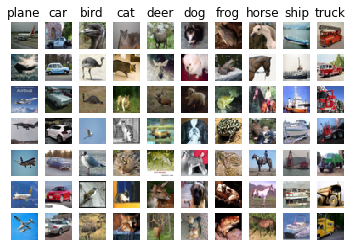

In [3]:
# Visualize some examples from the dataset.
# We show a few examples of training images from each class.
classes = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
num_classes = len(classes)
samples_per_class = 7
for y, cls in enumerate(classes):
    idxs = np.flatnonzero(y_train == y)
    idxs = np.random.choice(idxs, samples_per_class, replace=False)
    for i, idx in enumerate(idxs):
        plt_idx = i * num_classes + y + 1
        plt.subplot(samples_per_class, num_classes, plt_idx)
        plt.imshow(X_train[idx].astype('uint8'))
        plt.axis('off')
        if i == 0:
            plt.title(cls)
plt.show()

In [4]:
# Subsample the data for more efficient code execution in this exercise
num_training = 5000
mask = list(range(num_training))
X_train = X_train[mask]
y_train = y_train[mask]

num_test = 500
mask = list(range(num_test))
X_test = X_test[mask]
y_test = y_test[mask]

# Reshape the image data into rows
X_train = np.reshape(X_train, (X_train.shape[0], -1))
X_test = np.reshape(X_test, (X_test.shape[0], -1))
print(X_train.shape, X_test.shape)

(5000, 3072) (500, 3072)


In [5]:
from cs231n.classifiers import KNearestNeighbor

# Create a kNN classifier instance. 
# Remember that training a kNN classifier is a noop: 
# the Classifier simply remembers the data and does no further processing 
classifier = KNearestNeighbor()
classifier.train(X_train, y_train)

In [14]:
# Open cs231n/classifiers/k_nearest_neighbor.py and implement
# compute_distances_two_loops.

# Test your implementation:
dists = classifier.compute_distances_two_loops(X_test)
print("1")
print(dists.shape)

1
(500, 5000)


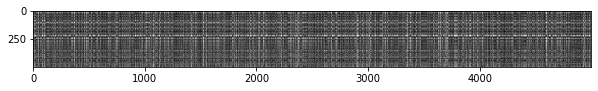

In [15]:
# We can visualize the distance matrix: each row is a single test example and
# its distances to training examples
plt.imshow(dists, interpolation='none')
plt.show()

**Inline Question 1** 

Notice the structured patterns in the distance matrix, where some rows or columns are visible brighter. (Note that with the default color scheme black indicates low distances while white indicates high distances.)

- What in the data is the cause behind the distinctly bright rows?
- What causes the columns?

$\color{blue}{\textit Your Answer:}$ *fill this in.*



In [16]:
# Now implement the function predict_labels and run the code below:
# We use k = 1 (which is Nearest Neighbor).
y_test_pred = classifier.predict_labels(dists, k=1)

# Compute and print the fraction of correctly predicted examples
num_correct = np.sum(y_test_pred == y_test)
accuracy = float(num_correct) / num_test
print('Got %d / %d correct => accuracy: %f' % (num_correct, num_test, accuracy))

rlan: (5000,)
[ 420 3684 4224 ... 4375 2744 4601]
[420]
[4]
rlan: (5000,)
[2192 4848 2166 ... 4400 4688 1387]
[2192]
[9]
rlan: (5000,)
[4469  909 3904 ... 4921 3355 3837]
[4469]
[8]
rlan: (5000,)
[ 252 4453 4270 ... 4688 4921 1387]
[252]
[8]
rlan: (5000,)
[1881 3949 3797 ... 4271 2744 4601]
[1881]
[4]
rlan: (5000,)
[2654  347 1983 ...  790 4601 2744]
[2654]
[4]
rlan: (5000,)
[4033  831   22 ... 1342 2744 4601]
[4033]
[3]
rlan: (5000,)
[ 910 4055 1838 ... 4645 2744 4601]
[910]
[2]
rlan: (5000,)
[4808 1686 1283 ... 4813 4940 1387]
[4808]
[5]
rlan: (5000,)
[2096 4320  126 ... 2814 3035 4688]
[2096]
[8]
rlan: (5000,)
[ 303  456 1759 ... 1387 4940 3286]
[303]
[2]
rlan: (5000,)
[ 139  722 2905 ... 4921 3355 3837]
[139]
[8]
rlan: (5000,)
[2745 3540 4124 ... 4271 3205 4601]
[2745]
[5]
rlan: (5000,)
[ 825 4279  920 ... 1342 2744 1527]
[825]
[7]
rlan: (5000,)
[ 271 4066 2749 ... 4645 2744 4601]
[271]
[2]
rlan: (5000,)
[4183 4453 1832 ... 4273 1342 4564]
[4183]
[2]
rlan: (5000,)
[4153 1160 2550 .

[2150 1367 4946 ... 4645 2744 4601]
[2150]
[6]
rlan: (5000,)
[3787 4197  918 ... 4375 4601 2744]
[3787]
[3]
rlan: (5000,)
[3144 3607 2172 ... 4940 4921 1387]
[3144]
[8]
rlan: (5000,)
[1027 2154 3376 ... 4940 3746 1766]
[1027]
[6]
rlan: (5000,)
[4571 3977 1431 ... 1527 4645  735]
[4571]
[0]
rlan: (5000,)
[1746 2983 2698 ... 1342 4418 4601]
[1746]
[4]
rlan: (5000,)
[ 337 3739  951 ... 2412 4601 1363]
[337]
[5]
rlan: (5000,)
[2684 2946 3249 ... 1342 4348 4418]
[2684]
[6]
rlan: (5000,)
[3623 1284 1235 ... 4375 2744  504]
[3623]
[7]
rlan: (5000,)
[ 887  552  372 ... 2744 4601  735]
[887]
[4]
rlan: (5000,)
[2796 3376 2867 ... 2439 1387 4940]
[2796]
[6]
rlan: (5000,)
[ 105 1853  207 ...  134 3467 4940]
[105]
[1]
rlan: (5000,)
[ 811 2715 3304 ... 4400 4940 1387]
[811]
[8]
rlan: (5000,)
[1826 4527 1500 ... 3205 1527 4601]
[1826]
[4]
rlan: (5000,)
[ 359 4579 1201 ... 4601 4375 2744]
[359]
[5]
rlan: (5000,)
[4540 4096 1439 ... 4921 4940 1387]
[4540]
[0]
rlan: (5000,)
[  69 3939 2603 ... 4601 2263

You should expect to see approximately `27%` accuracy. Now lets try out a larger `k`, say `k = 5`:

In [17]:
y_test_pred = classifier.predict_labels(dists, k=5)
num_correct = np.sum(y_test_pred == y_test)
accuracy = float(num_correct) / num_test
print('Got %d / %d correct => accuracy: %f' % (num_correct, num_test, accuracy))

rlan: (5000,)
[ 420 3684 4224 ... 4375 2744 4601]
[ 420 3684 4224 1161 4550]
[4 4 4 6 6]
rlan: (5000,)
[2192 4848 2166 ... 4400 4688 1387]
[2192 4848 2166 2172 3644]
[9 8 8 8 0]
rlan: (5000,)
[4469  909 3904 ... 4921 3355 3837]
[4469  909 3904 1726  139]
[8 8 8 5 8]
rlan: (5000,)
[ 252 4453 4270 ... 4688 4921 1387]
[ 252 4453 4270 2172 3039]
[8 2 0 8 8]
rlan: (5000,)
[1881 3949 3797 ... 4271 2744 4601]
[1881 3949 3797 4604 4262]
[4 5 4 2 4]
rlan: (5000,)
[2654  347 1983 ...  790 4601 2744]
[2654  347 1983 2372 4130]
[4 6 5 2 6]
rlan: (5000,)
[4033  831   22 ... 1342 2744 4601]
[4033  831   22 3525 1184]
[3 4 6 6 2]
rlan: (5000,)
[ 910 4055 1838 ... 4645 2744 4601]
[ 910 4055 1838 2746  347]
[2 4 2 7 6]
rlan: (5000,)
[4808 1686 1283 ... 4813 4940 1387]
[4808 1686 1283 4634 4306]
[5 8 2 2 2]
rlan: (5000,)
[2096 4320  126 ... 2814 3035 4688]
[2096 4320  126  193 1462]
[8 8 1 8 9]
rlan: (5000,)
[ 303  456 1759 ... 1387 4940 3286]
[ 303  456 1759 4808 1540]
[2 8 0 5 0]
rlan: (5000,)
[ 139  

[ 383  254 4398 ... 1387 3286 4940]
[ 383  254 4398 3759 2993]
[2 4 2 4 2]
rlan: (5000,)
[1283 3376  383 ... 1387 3035 4940]
[1283 3376  383 3703 2796]
[2 3 2 3 6]
rlan: (5000,)
[2150 1367 4946 ... 4645 2744 4601]
[2150 1367 4946 3560 1692]
[6 6 6 4 4]
rlan: (5000,)
[3787 4197  918 ... 4375 4601 2744]
[3787 4197  918 3742 3920]
[3 3 5 6 7]
rlan: (5000,)
[3144 3607 2172 ... 4940 4921 1387]
[3144 3607 2172 1794 1229]
[8 0 8 8 8]
rlan: (5000,)
[1027 2154 3376 ... 4940 3746 1766]
[1027 2154 3376 4568 2993]
[6 3 3 6 2]
rlan: (5000,)
[4571 3977 1431 ... 1527 4645  735]
[4571 3977 1431  475 1049]
[0 9 8 8 9]
rlan: (5000,)
[1746 2983 2698 ... 1342 4418 4601]
[1746 2983 2698 3797 3418]
[4 2 2 4 4]
rlan: (5000,)
[ 337 3739  951 ... 2412 4601 1363]
[ 337 3739  951 3845 2875]
[5 6 4 2 2]
rlan: (5000,)
[2684 2946 3249 ... 1342 4348 4418]
[2684 2946 3249  894 4309]
[6 0 5 5 6]
rlan: (5000,)
[3623 1284 1235 ... 4375 2744  504]
[3623 1284 1235 1973 1404]
[7 4 9 1 8]
rlan: (5000,)
[ 887  552  372 ... 2

You should expect to see a slightly better performance than with `k = 1`.

**Inline Question 2**

We can also use other distance metrics such as L1 distance.
For pixel values $p_{ij}^{(k)}$ at location $(i,j)$ of some image $I_k$, 

the mean $\mu$ across all pixels over all images is $$\mu=\frac{1}{nhw}\sum_{k=1}^n\sum_{i=1}^{h}\sum_{j=1}^{w}p_{ij}^{(k)}$$
And the pixel-wise mean $\mu_{ij}$ across all images is 
$$\mu_{ij}=\frac{1}{n}\sum_{k=1}^np_{ij}^{(k)}.$$
The general standard deviation $\sigma$ and pixel-wise standard deviation $\sigma_{ij}$ is defined similarly.

Which of the following preprocessing steps will not change the performance of a Nearest Neighbor classifier that uses L1 distance? Select all that apply.
1. Subtracting the mean $\mu$ ($\tilde{p}_{ij}^{(k)}=p_{ij}^{(k)}-\mu$.)
2. Subtracting the per pixel mean $\mu_{ij}$  ($\tilde{p}_{ij}^{(k)}=p_{ij}^{(k)}-\mu_{ij}$.)
3. Subtracting the mean $\mu$ and dividing by the standard deviation $\sigma$.
4. Subtracting the pixel-wise mean $\mu_{ij}$ and dividing by the pixel-wise standard deviation $\sigma_{ij}$.
5. Rotating the coordinate axes of the data.

$\color{blue}{\textit Your Answer:}$


$\color{blue}{\textit Your Explanation:}$


In [18]:
# Now lets speed up distance matrix computation by using partial vectorization
# with one loop. Implement the function compute_distances_one_loop and run the
# code below:
dists_one = classifier.compute_distances_one_loop(X_test)

# To ensure that our vectorized implementation is correct, we make sure that it
# agrees with the naive implementation. There are many ways to decide whether
# two matrices are similar; one of the simplest is the Frobenius norm. In case
# you haven't seen it before, the Frobenius norm of two matrices is the square
# root of the squared sum of differences of all elements; in other words, reshape
# the matrices into vectors and compute the Euclidean distance between them.
difference = np.linalg.norm(dists - dists_one, ord='fro')
print('One loop difference was: %f' % (difference, ))
if difference < 0.001:
    print('Good! The distance matrices are the same')
else:
    print('Uh-oh! The distance matrices are different')

One loop difference was: 0.000000
Good! The distance matrices are the same


In [19]:
# Now implement the fully vectorized version inside compute_distances_no_loops
# and run the code
dists_two = classifier.compute_distances_no_loops(X_test)

# check that the distance matrix agrees with the one we computed before:
difference = np.linalg.norm(dists - dists_two, ord='fro')
print('No loop difference was: %f' % (difference, ))
if difference < 0.001:
    print('Good! The distance matrices are the same')
else:
    print('Uh-oh! The distance matrices are different')

No loop difference was: 0.000000
Good! The distance matrices are the same


In [20]:
# Let's compare how fast the implementations are
def time_function(f, *args):
    """
    Call a function f with args and return the time (in seconds) that it took to execute.
    """
    import time
    tic = time.time()
    f(*args)
    toc = time.time()
    return toc - tic

two_loop_time = time_function(classifier.compute_distances_two_loops, X_test)
print('Two loop version took %f seconds' % two_loop_time)

one_loop_time = time_function(classifier.compute_distances_one_loop, X_test)
print('One loop version took %f seconds' % one_loop_time)

no_loop_time = time_function(classifier.compute_distances_no_loops, X_test)
print('No loop version took %f seconds' % no_loop_time)

# You should see significantly faster performance with the fully vectorized implementation!

# NOTE: depending on what machine you're using, 
# you might not see a speedup when you go from two loops to one loop, 
# and might even see a slow-down.

KeyboardInterrupt: 

### Cross-validation

We have implemented the k-Nearest Neighbor classifier but we set the value k = 5 arbitrarily. We will now determine the best value of this hyperparameter with cross-validation.

In [15]:
num_folds = 5
k_choices = [1, 3, 5, 8, 10, 12, 15, 20, 50, 100]

X_train_folds = []
y_train_folds = []
################################################################################
# TODO:                                                                        #
# Split up the training data into folds. After splitting, X_train_folds and    #
# y_train_folds should each be lists of length num_folds, where                #
# y_train_folds[i] is the label vector for the points in X_train_folds[i].     #
# Hint: Look up the numpy array_split function.                                #
################################################################################
# *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

#pass
X_train_folds = np.array_split(X_train, num_folds)
y_train_folds = np.array_split(y_train, num_folds)
#print(len(X_train_folds))
#print(len(y_train_folds))
#print(X_train_folds[0].shape)
#print(y_train_folds[0].shape)

# *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

# A dictionary holding the accuracies for different values of k that we find
# when running cross-validation. After running cross-validation,
# k_to_accuracies[k] should be a list of length num_folds giving the different
# accuracy values that we found when using that value of k.
# k_to_accuracies = {i+1: [] for i in range(num_folds)}
k_to_accuracies = defaultdict(list)



################################################################################
# TODO:                                                                        #
# Perform k-fold cross validation to find the best value of k. For each        #
# possible value of k, run the k-nearest-neighbor algorithm num_folds times,   #
# where in each case you use all but one of the folds as training data and the #
# last fold as a validation set. Store the accuracies for all fold and all     #
# values of k in the k_to_accuracies dictionary.                               #
################################################################################
# *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

##pass
num_val_cv = num_training / num_folds
# print('validation set size: %d' % (num_val_cv))
num_training_cv = num_training - num_val_cv
# print('training set size: %d' % (num_training_cv))

for k in k_choices:
    for n in range(num_folds):
#         print('current %d fold as validation fold...' % n)
        X_val_fold = X_train_folds[n]
        y_val_fold = y_train_folds[n]
        
        X_train_fold = np.delete(X_train_folds, n, axis=0)
        #print(len(X_train_fold))
        y_train_fold = np.delete(y_train_folds, n, axis=0)
        #print(len(y_train_fold))
        
        X_train_fold = np.array(X_train_fold)
        #print(X_train_fold.shape)
        trains = num_training*(num_folds-1)/num_folds
        #print(trains)
        #print(X_train_fold.shape)
        X_train_fold = np.reshape(X_train_fold, (int(trains), -1))
#         print('training set shape: ')
        print(X_train_fold.shape)
        y_train_fold = np.array(y_train_fold)
        #print(y_train_fold.shape)
        y_train_fold = np.reshape(y_train_fold, (int(trains)))
#         print('training set label shape: ')
        print(y_train_fold.shape)
        
        classifier.train(X_train_fold, y_train_fold)
        dists = classifier.compute_distances_no_loops(X_val_fold)
        y_test_pred = classifier.predict_labels(dists, k)

    # Compute and print the fraction of correctly predicted examples
        num_correct = np.sum(y_test_pred == y_val_fold)
        accuracy = float(num_correct) / num_val_cv
        print('Got %d / %d correct => accuracy: %f' % (num_correct, num_val_cv, accuracy))
        k_to_accuracies[k].append(accuracy)


# *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

# Print out the computed accuracies
for k in sorted(k_to_accuracies):
    for accuracy in k_to_accuracies[k]:
        print('k = %d, accuracy = %f' % (k, accuracy))

validation set size: 1000
training set size: 4000
current 0 fold as validation fold...
training set shape: 
(4000, 3072)
training set label shape: 
(4000,)
[3637 3805 2797 ... 2205 3271 3601]
[3637]
[6]
[3453  404  759 ... 2205 2837 3273]
[3453]
[2]
[3476  602 2882 ... 3688 3921   79]
[3476]
[0]
[ 367 1650 3732 ... 3271 1744 3601]
[367]
[6]
[3852 1574  162 ... 3689 1744 3601]
[3852]
[8]
[ 968 3354 3349 ... 3645  527 3601]
[968]
[4]
[1764 2418 3753 ... 3271  527 3601]
[1764]
[2]
[1921 1140 1075 ... 2626 1065 3601]
[1921]
[4]
[ 243 2254 2745 ... 3921 3940 2286]
[243]
[0]
[1968 1568 3869 ... 1744 3645 3601]
[1968]
[6]
[2560  530 1650 ... 3645 1744 3601]
[2560]
[4]
[3779  665 3476 ... 3101  387 3940]
[3779]
[8]
[3053  329 3476 ... 3940 2746 2355]
[3053]
[4]
[3849 3836  777 ... 3645 3601 1744]
[3849]
[5]
[3715 3235 1966 ... 3645 1744 3601]
[3715]
[4]
[2058 1914 2246 ... 2286  387 3921]
[2058]
[8]
[3053   58 3544 ... 2035 1814 3688]
[3053]
[4]
[1730  881 2797 ...  342 1744 3601]
[1730]
[5]
[

[2897 3801 3108 ... 1577 3601 3500]
[2897]
[4]
[1859 1819   67 ... 3273 3418 3688]
[1859]
[0]
[2418   27 2074 ... 3940 3271 1907]
[2418]
[4]
[3053 2501  233 ... 2355 3590 2616]
[3053]
[4]
[ 624 2434 3159 ... 2035  387 3940]
[624]
[4]
[2797 3905 1730 ... 1744 3564 3601]
[2797]
[4]
[ 984  406 2652 ... 3271 3348 3601]
[984]
[4]
[2141 1573 1983 ... 1744 3601  527]
[2141]
[4]
[1573 3224  788 ... 3645 1744 3601]
[1573]
[4]
[3703 1695 3007 ... 3500 3645 3601]
[3703]
[2]
[ 419  295 3633 ... 3601  527 2205]
[419]
[5]
[2376 1534  283 ... 2467 3940 2286]
[2376]
[3]
[2273  933 1922 ... 3601 1744 2205]
[2273]
[1]
[3032 3224 1573 ... 3375 1744 3601]
[3032]
[4]
[3756 1196  910 ... 1744 3645 3601]
[3756]
[4]
[3710 2944 2166 ... 1744  342 3601]
[3710]
[4]
[1819 1247  751 ... 3375 3564 2286]
[1819]
[8]
[2039  509 3469 ... 3921 3688 2837]
[2039]
[8]
[1003 1917 3958 ... 3400  387 3921]
[1003]
[8]
[ 669 2886   92 ... 2837 1744 3601]
[669]
[9]
[2469  162 1745 ... 3601 3689 2205]
[2469]
[8]
[ 126 3715 1812 .

[3208 2739 1017 ... 2035 1412 3940]
[3208]
[6]
[ 880 2558 1983 ... 3645 1744 3601]
[880]
[4]
[1943  969 3969 ... 1388 1744 3601]
[1943]
[4]
[3713  229 3711 ... 2286 3921  387]
[3713]
[8]
[1894 3522  971 ... 2837 3273  342]
[1894]
[2]
[2366 3153  600 ... 3375 3601 1744]
[2366]
[1]
[1172 2638 3848 ... 3813 3921  387]
[1172]
[8]
[ 600 1943 2217 ... 3601 3418  342]
[600]
[5]
[ 597 2304 1593 ... 3400  387 3921]
[597]
[8]
[1966 3066 3236 ...  527 3645 3601]
[1966]
[2]
[3725 3628 3317 ... 3500 3271 3601]
[3725]
[4]
[ 480 1966 3624 ... 1744 3645 3601]
[480]
[8]
[1594 1966 1812 ... 1744 3645 3601]
[1594]
[3]
[2443 1415   38 ... 3601 3271  527]
[2443]
[0]
[3621 3045 3516 ... 1744 2286 2205]
[3621]
[0]
[2189 1782 1650 ... 1744 3645 3601]
[2189]
[4]
[ 983 1372 2193 ...  527 1744 3601]
[983]
[5]
[ 351  154  843 ... 3645 1744 3601]
[351]
[3]
[1830 3108  777 ... 3418 1744 3601]
[1830]
[4]
[3053 1217 1767 ... 2616 2035 2365]
[3053]
[4]
[1034 3808 1867 ... 3813  387 3940]
[1034]
[0]
[ 500 1213  759 ...

[8]
[1003 1172  130 ... 3400  387 3921]
[1003]
[8]
[2376 1091   27 ... 3921 1907 3940]
[2376]
[3]
[ 352 1223 1196 ... 3418 3645 3601]
[352]
[7]
[1749  284 2029 ... 3689 1744 3601]
[1749]
[8]
[3588 2376   27 ... 2746  766 3940]
[3588]
[2]
[1737 1150  692 ... 3645  527 3601]
[1737]
[2]
[ 770 1715 3746 ... 3921 3400  387]
[770]
[8]
[2039 3914 1096 ... 2035  387 3688]
[2039]
[8]
[ 323   92  284 ...  527 3601 1744]
[323]
[8]
[1788  778 3482 ... 3271 3645 3601]
[1788]
[5]
[1550   11 2670 ... 3601 3348 3564]
[1550]
[2]
[2263 1341 3056 ... 3400 3940  387]
[2263]
[0]
[1034  340 1760 ... 3921  387 3940]
[1034]
[0]
[ 563 3715  123 ... 3375 3601 1744]
[563]
[6]
[3493 1039 1968 ... 1744 3645 3601]
[3493]
[2]
[ 126 2684 3224 ... 3500 1744 3601]
[126]
[6]
[ 351 2742 2920 ...  342 1744 3601]
[351]
[3]
[2077 3224 2377 ... 3375 3601 1744]
[2077]
[4]
[2383  427  778 ... 1744 3645 3601]
[2383]
[4]
[2196 3502 3276 ... 3656  387 3940]
[2196]
[2]
[3685 3516 3262 ...  342 3601 2205]
[3685]
[6]
[ 809 3715 3224

[2874 1573 3885 ... 3645 3601  504]
[2874]
[8]
[3682 3982 1617 ... 3813 1907 3940]
[3682]
[6]
[1715 3717 2304 ... 2035 3921 3940]
[1715]
[7]
[3398 2703 3862 ... 1412 2626 3271]
[3398]
[2]
[2027  347 2377 ... 3375 3601 1744]
[2027]
[4]
[1905 3094 3779 ... 3921 2035 2837]
[1905]
[4]
[ 933 2759  403 ... 3921 3656 3940]
[933]
[2]
[1543 3353  557 ... 3400 3656 3940]
[1543]
[2]
[2745 1333 2829 ... 2286 3940 1356]
[2745]
[8]
[2638  139  252 ... 3688 2035 2355]
[2638]
[8]
[1905 2573  139 ... 3921 2355 2837]
[1905]
[4]
[3804  592  110 ... 2746 3940 2467]
[3804]
[8]
[ 243 1535 2841 ... 1744 3271 3601]
[243]
[6]
[1034  974  349 ... 3921 2286 3940]
[1034]
[0]
[ 878  313 3106 ... 1744 3645 3601]
[878]
[3]
[1349  655 2251 ... 1439 2746 3940]
[1349]
[2]
[3304 1269 3066 ... 1744 2205 3601]
[3304]
[8]
[1736  268 2897 ... 3601 3500  735]
[1736]
[5]
[1150 1782  626 ... 3645 1744 3601]
[1150]
[6]
[ 402  949 3002 ... 3921 2286 3940]
[402]
[2]
[ 157 3969 3801 ... 3601  735 3500]
[157]
[5]
[3555 2987 1191 ..

[2408 2418  130 ...  735 3271 3601]
[2408]
[4]
[1610 3121 3516 ...  790 3601 1744]
[1610]
[2]
[ 901 1635 1768 ... 3921 3940 2035]
[901]
[8]
[1509 2251 2503 ... 3656 3400 3940]
[1509]
[5]
[1634 2886 1201 ... 2837 3601 3645]
[1634]
[5]
[2254 2049 2745 ... 3921 3940 2286]
[2254]
[2]
[ 882  117 2938 ... 3601 1744  504]
[882]
[3]
[1857  909  139 ... 2616 3601  504]
[1857]
[8]
[ 784 1812 1372 ... 3418 1744 3601]
[784]
[5]
[1979  592 1213 ... 3921 2467 3940]
[1979]
[8]
[1441 1079  108 ... 3656 2035 3940]
[1441]
[8]
[1229 3617  987 ... 3101 2035 3940]
[1229]
[8]
[ 217 2873  336 ...  735 3601 3271]
[217]
[5]
[2172 3710 1654 ... 3418 3601  735]
[2172]
[3]
[2350 1824  379 ... 2035 3688 3940]
[2350]
[8]
[1106 1465 1041 ... 3273 3271 3564]
[1106]
[4]
[2525 3946 1666 ... 3645 1744 3601]
[2525]
[6]
[1658 2292 2039 ... 3400 3921 2286]
[1658]
[8]
[ 139  909  495 ... 2355  504 2837]
[139]
[8]
[3808 3905 2868 ... 2286 3518 3331]
[3808]
[5]
[1106 3905 1716 ... 1744 3601 3271]
[1106]
[4]
[2874 3885  804 ..

[ 910  196 3879 ... 3645 1744 3601]
[910]
[2]
[1972 2664 3394 ... 3645 1744 3601]
[1972]
[6]
[2549 1610 2377 ... 3375 3601 1744]
[2549]
[0]
[2883 1150 1253 ... 3645 1744 3601]
[2883]
[8]
[1619  695 2163 ... 1412 3921 3940]
[1619]
[2]
[3755  986  849 ... 1744 3418  504]
[3755]
[2]
[ 254 3862 2217 ... 3500 2199  735]
[254]
[4]
[3322 2979 1349 ... 1439 2467 3940]
[3322]
[0]
[1372 2178 2712 ... 3645 1744 3601]
[1372]
[2]
[  10  910  180 ... 3645 1744 3601]
[10]
[4]
[ 906 1116 1350 ... 3645 1744 3601]
[906]
[0]
[3617 2634 1341 ... 3400 3921 3940]
[3617]
[8]
[ 990 1983  622 ... 3418 1744 3601]
[990]
[2]
[3868 3224 3755 ... 3601 1744 2205]
[3868]
[0]
[2768   18 2939 ...  735 1744 3601]
[2768]
[7]
[ 294 3398 1716 ... 1744 3601 3271]
[294]
[7]
[ 909 3277  722 ... 3940  504 3921]
[909]
[8]
[1617  591  569 ... 3813 2286 3940]
[1617]
[0]
[1349 2163 1079 ... 3656 1412 3940]
[1349]
[2]
[3276 3398  349 ... 1907 2746 3940]
[3276]
[6]
[ 139 1166 1156 ... 3688 3590 2837]
[139]
[8]
[1812  347 1836 ... 36

[3282 2789 1990 ...  790 3645 3601]
[3282]
[0]
[2418 2164 2213 ... 3645  790 3601]
[2418]
[4]
[3066 1480 2488 ... 3645 3601  504]
[3066]
[8]
[1759 1119 3758 ... 2837 3271 3601]
[1759]
[0]
[1500 1936  149 ... 3601 3418  735]
[1500]
[2]
[3108  959 1917 ...  735 3500 3601]
[3108]
[3]
[2948 3224  716 ... 2205  735 3601]
[2948]
[4]
[3955 3453 3923 ... 3564 1387 3273]
[3955]
[8]
[ 711 2638 1139 ... 1387 2035 3688]
[711]
[4]
[2579 1759 2458 ... 3940 2286 1387]
[2579]
[8]
[1283  557 3683 ... 3656 1387 3940]
[1283]
[2]
[3731 2048 3606 ... 2205 3601 3418]
[3731]
[6]
[1794 2554 3779 ... 3656 1387 3940]
[1794]
[8]
[ 181 2627 1759 ... 2286 3656 1387]
[181]
[7]
[2759  662 3808 ... 1387 3940 2286]
[2759]
[4]
[3453 1143 1404 ... 3601  504 3564]
[3453]
[2]
[2246  766 3502 ... 3688 2035 3940]
[2246]
[0]
[2193 3729 1268 ... 3500 3645 3601]
[2193]
[2]
[1881 2797 2193 ... 1527 2205 3601]
[1881]
[4]
[ 254 1690  272 ... 2467 2746 3940]
[254]
[4]
[1373 1237  933 ... 3564 1387 3921]
[1373]
[4]
[3540 2263  974 

[3804 2376  379 ... 2746 2467 3940]
[3804]
[8]
[3540  557 3617 ... 3921 3940 1387]
[3540]
[0]
[3827  910 3879 ... 3375 3645 3601]
[3827]
[3]
[1497 3905 3301 ... 3169 3564  735]
[1497]
[2]
[  10 1530 2883 ...  790 3645 3601]
[10]
[4]
[1814 1500 1038 ... 2199 3418  735]
[1814]
[4]
[1770  566 2115 ... 3400 3921 1387]
[1770]
[8]
[1728 1521 3224 ...  790  504 3601]
[1728]
[4]
[ 622  347 2558 ... 3645  790 3601]
[622]
[4]
[1826  887 2306 ... 3418 3601  735]
[1826]
[4]
[1991 1913 2891 ... 2205 3271 3689]
[1991]
[5]
[1254 3257   48 ... 1387 1977 3940]
[1254]
[4]
[1732  891 3634 ... 3921 1387 2286]
[1732]
[8]
[1345  906 2178 ... 1527 3645 3601]
[1345]
[3]
[3282 2259 2789 ...  790 3645 3601]
[3282]
[0]
[2858 1796 1049 ... 2837 1554 2616]
[2858]
[9]
[3601 3645 3573 ... 3400 1387 3940]
[3601]
[0]
[3287  711 1139 ... 3400 1387 3921]
[3287]
[8]
[3113 2116   18 ... 2616 3940 2035]
[3113]
[2]
[ 982 2608 3208 ... 1363 2035 3940]
[982]
[4]
[3871 3885 1798 ... 1527 3645 3601]
[3871]
[7]
[3492  868 1323 .

[3658 3431 3671 ... 2746 1766 3940]
[3658]
[8]
[ 243 3604 2841 ... 3271 3601  735]
[243]
[6]
[1624 1759 1463 ... 3921 1387 3940]
[1624]
[4]
[2882 2063  749 ... 3590  504 2837]
[2882]
[9]
[1480 2488 3066 ...  790 3645 3601]
[1480]
[8]
[3208  337 2739 ...  735 3601 1363]
[3208]
[6]
[1838  420 2178 ... 3418 3645 3601]
[1838]
[2]
[ 157  931 1096 ... 3169 3418 3518]
[157]
[5]
[1124 1759 3758 ... 3271 3645 3601]
[1124]
[3]
[ 197 1842 2410 ... 3273 3331 3518]
[197]
[3]
[3096 3617 2669 ... 3400 3940 1387]
[3096]
[0]
[1953 1764 3801 ... 3500 2626 2199]
[1953]
[4]
[1092   69  558 ... 1527  504 3601]
[1092]
[8]
[2182  692 3678 ...  735 3500 3601]
[2182]
[4]
[ 472 3053  909 ... 2837 2035 3688]
[472]
[9]
[1314 1751 2738 ... 3518 3564 2286]
[1314]
[8]
[2376  827 1027 ... 3656 1387 3940]
[2376]
[3]
[  69 1431 3571 ... 3940 3921 3132]
[69]
[8]
[3053  711 1185 ... 3940 2035 3688]
[3053]
[4]
[ 887 3007 3703 ... 1342 3645 3601]
[887]
[4]
[2587 2448 3969 ... 3902 2626  735]
[2587]
[4]
[2997 2608 3208 ... 

[1416 2267  749 ... 3601 2744  504]
[1416]
[8]
[ 781 3907 1351 ... 3645 1527 3601]
[781]
[6]
[2749 1284 2962 ... 3601 2744  504]
[2749]
[8]
[2875 1926  592 ... 1387 3688 3940]
[2875]
[2]
[ 933 2993 2764 ... 1387 3921 3940]
[933]
[2]
[3270 3489 1139 ... 1387 3940 3921]
[3270]
[0]
[2195 1125  571 ... 1766 3940 3932]
[2195]
[7]
[ 592 1758 2207 ... 3645 3601  735]
[592]
[8]
[2610 2693  564 ... 3645 2744 3601]
[2610]
[2]
[3621  303  129 ...  774 1387 3940]
[3621]
[0]
[2868 1593 1665 ... 1766 2814 3921]
[2868]
[2]
[  10 2607 2812 ... 3645 2744 3601]
[10]
[4]
[2966 3885 2725 ... 2744 3645 3601]
[2966]
[2]
[2068 3033   54 ... 3418 3271 3601]
[2068]
[3]
[ 609  574 2382 ... 3921 2744  504]
[609]
[8]
[2133  990 1677 ... 3418 2744 3601]
[2133]
[2]
[1027   42  933 ... 2439 1977 3940]
[1027]
[6]
[ 894 3637 2479 ... 3348 3271 3601]
[894]
[5]
[1009  349  557 ... 1766 1387 3940]
[1009]
[2]
[2229 3935 1593 ... 3656 1387 3940]
[2229]
[8]
[3617 1665  987 ... 3921 1387 3940]
[3617]
[8]
[1345 3869 2616 ... 

[1791 3317 2130 ... 2744 3645 3601]
[1791]
[4]
[ 688 3072  932 ... 3564 3902 3518]
[688]
[7]
[3067 2868 1004 ... 2814 3940 3921]
[3067]
[5]
[3502 1439  711 ... 3940 2814 3688]
[3502]
[8]
[1220  933 2310 ... 3271 3601 3564]
[1220]
[6]
[3836 3108 3297 ... 3645  735 3601]
[3836]
[3]
[ 961 3033 1367 ... 3375 2744 3601]
[961]
[6]
[  58  347 2654 ...  790 2744 3601]
[58]
[4]
[1862 1092 3298 ... 3375 2744  504]
[1862]
[8]
[3066 2894 1092 ... 1527 3601  504]
[3066]
[8]
[ 715  240 2834 ... 1843 1387 3940]
[715]
[8]
[2670 1413 2192 ... 3688 3365 3590]
[2670]
[8]
[1759 2796 2859 ... 3921 1387 3940]
[1759]
[0]
[1323 1229 1711 ... 1342 2744  504]
[1323]
[8]
[3077 1468  704 ... 3645  504 1527]
[3077]
[6]
[2197  254  933 ... 3601 2744  735]
[2197]
[3]
[3550 2983  132 ... 3418 1342 3601]
[3550]
[6]
[ 951 3184 2776 ... 3500 3601  735]
[951]
[4]
[3649 2464 2065 ... 3656 1387 3940]
[3649]
[9]
[2034  695 1664 ... 3400 1387 3940]
[2034]
[0]
[  89 1759 1531 ... 1342 3601  504]
[89]
[4]
[2964 2610 3282 ... 3

[3149  197 1881 ... 3601 3564 3348]
[3149]
[3]
[ 711 3128 1711 ... 3688 3921 2814]
[711]
[4]
[2475 3126 2959 ... 3689 2744 3601]
[2475]
[6]
[1720 3611 2942 ... 3940 1387  504]
[1720]
[8]
[1853  987  554 ... 3932 3132 3940]
[1853]
[8]
[2193 2341 2543 ... 3656 1387 3940]
[2193]
[2]
[  10  910 1436 ...  790 2744 3601]
[10]
[4]
[3755 3758 1141 ... 3601 1342  504]
[3755]
[2]
[ 254 1762 3969 ... 3500 2577  735]
[254]
[4]
[1366  373 3015 ...  221 2577 3902]
[1366]
[4]
[3047  647 1762 ...  310  816  735]
[3047]
[1]
[1809 3491 2730 ...  790 2744 3601]
[1809]
[6]
[1323 1092  909 ...  504 1527 1363]
[1323]
[8]
[ 342 3731 3033 ... 3271 1342 3601]
[342]
[3]
[ 177 2253 1881 ... 1527 2744 3601]
[177]
[5]
[2723  928 2859 ... 3400 3921 1387]
[2723]
[3]
[2922 2567 2077 ... 2744  735 3564]
[2922]
[4]
[2998 3094 3208 ... 3688 1773 3940]
[2998]
[6]
[3053 2767 3742 ... 3132 2814 1079]
[3053]
[4]
[3687 3725 3426 ... 3500 2744 3601]
[3687]
[4]
Got 278 / 1000 correct => accuracy: 0.278000
current 4 fold as val

[1467]
[9]
[2796 3627 1759 ... 3467 3035 1387]
[2796]
[6]
[ 420 1746 3684 ... 3205  790 2744]
[420]
[4]
[3739  254 2276 ... 1766 3746  735]
[3739]
[6]
[2770 2017 3376 ... 1977 1766 2907]
[2770]
[3]
[3024 2578  317 ... 1766 3467 1387]
[3024]
[0]
[ 622 3712 1968 ... 1527  790 2744]
[622]
[4]
[2922 3377 3587 ... 2744 3737 3626]
[2922]
[4]
[ 126 1468  554 ... 3365 3035 3616]
[126]
[1]
[ 963  838   10 ... 1342 2744 1527]
[963]
[2]
[1027 3376 2034 ... 2907 2439 1387]
[1027]
[6]
[   5 1212  804 ...  504 1527 2744]
[5]
[1]
[3163 2079 3436 ... 1766 1843 1387]
[3163]
[5]
[2133 2605 1934 ... 1342 3035  504]
[2133]
[2]
[3784 2074 2207 ... 3616 1363  504]
[3784]
[4]
[ 592  927 3819 ... 1342  735  504]
[592]
[8]
[1471  373 1203 ... 3171 3286 3626]
[1471]
[4]
[2966 2725 3874 ...  790 2744 1527]
[2966]
[2]
[ 130 2668 2522 ... 1527 3205 1342]
[130]
[4]
[ 197   33 2194 ...  496 3205 3978]
[197]
[3]
[2745 1039 3397 ... 2744 3842 3205]
[2745]
[5]
[1711  777 1640 ... 1766 2356 1387]
[1711]
[0]
[3980 2410 3

[ 622 2069 2573 ...  735 1527 2744]
[622]
[4]
[ 303 2197 3417 ... 2907 1766 3467]
[303]
[2]
[  10 2782 3761 ...  790 1342 2744]
[10]
[4]
[2333 2993 2540 ... 3467 1387 1977]
[2333]
[8]
[ 658 1663 1514 ... 2263 2356 3746]
[658]
[0]
[3063 1413 1234 ... 3616 3837  504]
[3063]
[0]
[2567 3408 2922 ... 2744 3286  735]
[2567]
[2]
[ 622 3558 1746 ... 3205 2744  735]
[622]
[4]
[1229 1323 3745 ... 3286 3035 1387]
[1229]
[8]
[2966 3768 2968 ... 1527  790 2744]
[2966]
[2]
[1323 1229 1996 ... 3035 3286 1387]
[1323]
[8]
[2746 1809  196 ...  735  790 2744]
[2746]
[7]
[ 420  951  196 ...  735  790 2744]
[420]
[4]
[ 982 1714  571 ...  134 3035 1766]
[982]
[4]
[1329  600  711 ... 2814 3035 1387]
[1329]
[0]
[ 284 3240 1674 ... 1766 3035 1387]
[284]
[0]
[2650 2252 3136 ... 1527  790 2744]
[2650]
[6]
[1128 1556 3365 ...  816  790 2744]
[1128]
[3]
[1757 1722  832 ... 1766 2439 1977]
[1757]
[0]
[1664  129 3701 ... 3286 1766 1387]
[1664]
[0]
[1229  554 1323 ... 3035 3286 1387]
[1229]
[8]
[3263 1709 3638 ... 28

training set shape: 
(4000, 3072)
training set label shape: 
(4000,)
[3637 3805 2797 ... 2205 3271 3601]
[3637 3805 2797]
[6 6 4]
[3453  404  759 ... 2205 2837 3273]
[3453  404  759]
[2 8 0]
[3476  602 2882 ... 3688 3921   79]
[3476  602 2882]
[0 9 9]
[ 367 1650 3732 ... 3271 1744 3601]
[ 367 1650 3732]
[6 6 2]
[3852 1574  162 ... 3689 1744 3601]
[3852 1574  162]
[8 0 8]
[ 968 3354 3349 ... 3645  527 3601]
[ 968 3354 3349]
[4 1 3]
[1764 2418 3753 ... 3271  527 3601]
[1764 2418 3753]
[2 4 4]
[1921 1140 1075 ... 2626 1065 3601]
[1921 1140 1075]
[4 7 7]
[ 243 2254 2745 ... 3921 3940 2286]
[ 243 2254 2745]
[0 2 8]
[1968 1568 3869 ... 1744 3645 3601]
[1968 1568 3869]
[6 1 0]
[2560  530 1650 ... 3645 1744 3601]
[2560  530 1650]
[4 2 6]
[3779  665 3476 ... 3101  387 3940]
[3779  665 3476]
[8 8 0]
[3053  329 3476 ... 3940 2746 2355]
[3053  329 3476]
[4 0 0]
[3849 3836  777 ... 3645 3601 1744]
[3849 3836  777]
[5 3 2]
[3715 3235 1966 ... 3645 1744 3601]
[3715 3235 1966]
[4 6 2]
[2058 1914 2246 

[2376 1534  283 ... 2467 3940 2286]
[2376 1534  283]
[3 8 2]
[2273  933 1922 ... 3601 1744 2205]
[2273  933 1922]
[1 6 4]
[3032 3224 1573 ... 3375 1744 3601]
[3032 3224 1573]
[4 4 4]
[3756 1196  910 ... 1744 3645 3601]
[3756 1196  910]
[4 4 4]
[3710 2944 2166 ... 1744  342 3601]
[3710 2944 2166]
[4 2 4]
[1819 1247  751 ... 3375 3564 2286]
[1819 1247  751]
[8 2 8]
[2039  509 3469 ... 3921 3688 2837]
[2039  509 3469]
[8 4 8]
[1003 1917 3958 ... 3400  387 3921]
[1003 1917 3958]
[8 9 1]
[ 669 2886   92 ... 2837 1744 3601]
[ 669 2886   92]
[9 1 8]
[2469  162 1745 ... 3601 3689 2205]
[2469  162 1745]
[8 8 5]
[ 126 3715 1812 ... 1744 3645 3601]
[ 126 3715 1812]
[6 4 2]
[1812  968 3729 ... 3645 1744 3601]
[1812  968 3729]
[2 4 7]
[3221 1509  118 ... 3921  387 3940]
[3221 1509  118]
[3 5 7]
[2858 2677 2919 ... 2837 2616  363]
[2858 2677 2919]
[9 9 4]
[ 787 3056 2184 ... 3400  387 3940]
[ 787 3056 2184]
[2 2 0]
[3247  926 2213 ... 2355 3921 3564]
[3247  926 2213]
[7 0 7]
[2984 2127 2485 ... 2467

[3211 2908 2506 ... 3564 1744 3375]
[3211 2908 2506]
[2 4 2]
[1616 3869 2762 ... 3645 1744 3601]
[1616 3869 2762]
[7 0 3]
[ 264 1942  643 ... 3348 3271 3601]
[ 264 1942  643]
[4 8 8]
[2376 1867  663 ... 3656 1263 3940]
[2376 1867  663]
[3 2 4]
[3814 3849 2044 ... 3418 1744 3601]
[3814 3849 2044]
[5 5 4]
[3639  461 2409 ... 3601 3375 1744]
[3639  461 2409]
[5 3 9]
[1112 2044  351 ... 3645 1744 3601]
[1112 2044  351]
[6 4 3]
[3134 3985  465 ... 3400  387 3921]
[3134 3985  465]
[7 4 9]
[ 366  296 1435 ...  977 3940 2286]
[ 366  296 1435]
[4 0 0]
[1116 1364 2986 ... 3375 1744 3601]
[1116 1364 2986]
[4 6 6]
[3453 3955  686 ... 3400 3921  387]
[3453 3955  686]
[2 8 8]
[ 867  500 3868 ... 3645  527 3601]
[ 867  500 3868]
[2 2 0]
[ 220 1069 2939 ... 3645 3500 3601]
[ 220 1069 2939]
[6 4 7]
[2166 1197 1605 ... 2199 3940 3601]
[2166 1197 1605]
[4 3 6]
[ 465 3818 3134 ... 3365 2355 2616]
[ 465 3818 3134]
[9 9 7]
[1192 1172 1354 ... 3688 3921 2035]
[1192 1172 1354]
[9 8 2]
[2949 1594 2841 ... 1744

[3224  746 3429 ... 3375 3601 1744]
[3224  746 3429]
[4 4 4]
[3755  881 3905 ... 3418  342 3601]
[3755  881 3905]
[2 4 4]
[3617  996 2330 ... 3921 3940  387]
[3617  996 2330]
[8 8 8]
[3868 1133  267 ...  527 3601 3271]
[3868 1133  267]
[0 2 2]
[2263 3056 2101 ... 3656  387 3940]
[2263 3056 2101]
[0 2 2]
[2418  129  746 ...  342 1744 3601]
[2418  129  746]
[4 2 4]
[1509 1227  618 ...  766  387 3940]
[1509 1227  618]
[5 1 5]
[1836  614 2193 ... 1744 3271 3601]
[1836  614 2193]
[6 2 2]
[ 314 2336  952 ... 3601  342 2205]
[ 314 2336  952]
[8 0 4]
[3007 3715 3703 ... 3645 1744 3601]
[3007 3715 3703]
[3 4 2]
[1510  536 1089 ... 1744 3645 3601]
[1510  536 1089]
[6 6 5]
[3755 2260 1372 ... 3375 3601 1744]
[3755 2260 1372]
[2 4 2]
[3066 3514 2624 ...  527 3601 1744]
[3066 3514 2624]
[8 8 8]
[1233 1824 3812 ... 3688 2035 2837]
[1233 1824 3812]
[0 0 8]
[3715  563  317 ... 1744 3645 3601]
[3715  563  317]
[4 6 6]
Got 239 / 1000 correct => accuracy: 0.239000
current 1 fold as validation fold...
tra

[ 622  804 3349 ... 3645 1744 3601]
[ 622  804 3349]
[4 2 3]
[3758 3032 3755 ... 3271 3601 3273]
[3758 3032 3755]
[8 4 2]
[2586 1193  497 ... 1263 3921 3940]
[2586 1193  497]
[2 2 0]
[3257 3671 1017 ... 1439 2467 3940]
[3257 3671 1017]
[2 7 5]
[2607 1797  139 ... 3688 2355 2837]
[2607 1797  139]
[0 8 8]
[3346 1510  571 ... 3656 1907 3940]
[3346 1510  571]
[3 6 6]
[3703   58 1573 ... 3645 1744 3601]
[3703   58 1573]
[2 4 4]
[ 790 3375 1349 ... 2746 1439 3940]
[ 790 3375 1349]
[2 2 2]
[ 933 2739 1310 ...  735 1907 3940]
[ 933 2739 1310]
[2 6 6]
[1567  349 2759 ... 1907 3940 2286]
[1567  349 2759]
[2 0 4]
[2502 1745 3936 ... 3271 3348 3273]
[2502 1745 3936]
[5 5 8]
[2488  419 1472 ...  790  504 3601]
[2488  419 1472]
[2 9 7]
[2166  447   19 ... 3518  816  735]
[2166  447   19]
[4 4 6]
[3864  287 3703 ... 3271 3601  735]
[3864  287 3703]
[4 3 2]
[1834 3865  898 ... 1439 2467 3940]
[1834 3865  898]
[7 9 7]
[ 130 2164  933 ... 1744 2205 3601]
[ 130 2164  933]
[4 2 2]
[1842  180   10 ... 1744

[1942 3207 3233 ... 3271 2355 2837]
[1942 3207 3233]
[8 8 8]
[3066 1894 1454 ... 3601 1744  504]
[3066 1894 1454]
[8 2 8]
[3429 1678 3106 ... 3645 3601  735]
[3429 1678 3106]
[4 2 4]
[1068 3033 3124 ... 3689 1744 3601]
[1068 3033 3124]
[3 3 3]
[ 743 3316 1176 ... 3813 2035 3940]
[ 743 3316 1176]
[1 5 8]
[2446  552 1540 ... 3500 1744 3601]
[2446  552 1540]
[2 6 2]
[1546 1868 3683 ... 2746 3940 3921]
[1546 1868 3683]
[2 2 0]
[3960  804 3211 ... 3273 1744  504]
[3960  804 3211]
[5 2 2]
[3215 1032  592 ... 3656 2467 3940]
[3215 1032  592]
[9 9 8]
[2759  254 3905 ...  735 2286 3940]
[2759  254 3905]
[4 4 4]
[ 399 1812  420 ... 1744  735 3601]
[ 399 1812  420]
[4 2 4]
[3905  952 3808 ... 3273 3564 2286]
[3905  952 3808]
[4 7 5]
[1133  622  804 ... 1744 3271 3601]
[1133  622  804]
[2 4 2]
[3224 2835 3067 ... 3689 1744 3601]
[3224 2835 3067]
[4 7 5]
[3715 3007 1922 ...  735 1744 3601]
[3715 3007 1922]
[4 3 4]
[2652 2761 3705 ... 3645 1744 3601]
[2652 2761 3705]
[9 4 7]
[ 420 3583 3685 ... 2205

[3517  592 1678 ... 3940 2746  735]
[3517  592 1678]
[1 8 2]
[ 254 2587  149 ... 2626 2199  735]
[ 254 2587  149]
[4 4 4]
[1333  303  982 ... 3921 2286 3940]
[1333  303  982]
[8 2 4]
[ 373 2376 1567 ... 2286 3940 2626]
[ 373 2376 1567]
[0 3 2]
[ 403 1796 3257 ... 1439 3656 3940]
[ 403 1796 3257]
[2 6 2]
[2558 3710 1842 ... 1744 3645 3601]
[2558 3710 1842]
[2 4 4]
[2434  289 2784 ... 2746 3940 3921]
[2434  289 2784]
[7 7 4]
[ 196 2226   10 ... 1744 3645 3601]
[ 196 2226   10]
[2 2 4]
[ 141 1465 2797 ... 3418 3271 3601]
[ 141 1465 2797]
[3 4 4]
[3956  993 3032 ... 1744 3273 2205]
[3956  993 3032]
[5 5 4]
[1133 1573  804 ... 1744  504 3601]
[1133 1573  804]
[2 4 2]
[1266 2873 2684 ... 1744 3271 3601]
[1266 2873 2684]
[5 6 4]
[1077  658 2549 ...  735 1744 3601]
[1077  658 2549]
[8 0 0]
[3224 3703 3868 ...  790 1744 3601]
[3224 3703 3868]
[4 2 0]
[3530  801 3493 ...  790 1744 3601]
[3530  801 3493]
[3 3 2]
[3029  567 1592 ... 3921 3400 3940]
[3029  567 1592]
[8 8 8]
[3224  592  149 ... 1744

[6 3 6]
[3053 3427 3594 ... 3365 2616 1363]
[3053 3427 3594]
[4 7 8]
[ 695 3772 2701 ... 1766 2746 3940]
[ 695 3772 2701]
[0 3 0]
[3224 1500 2949 ... 3645 3601  735]
[3224 1500 2949]
[4 2 5]
[ 554 3303 3571 ... 3688 2837  504]
[ 554 3303 3571]
[8 8 0]
[1141 1092 1166 ... 3601 2837  504]
[1141 1092 1166]
[8 8 0]
[1809 1836 2027 ... 3375  790 3601]
[1809 1836 2027]
[6 6 4]
[ 523 1318 3773 ... 3601  816  735]
[ 523 1318 3773]
[7 6 4]
[1708 3094 3804 ... 3656 2467 3940]
[1708 3094 3804]
[0 6 8]
[ 420  906  564 ...  790 1342 3601]
[420 906 564]
[4 0 0]
[1351 2136 2843 ... 3645 3271 3601]
[1351 2136 2843]
[3 0 3]
[1845 1618  991 ... 1766 1387 3940]
[1845 1618  991]
[3 5 1]
[3213 1777 3108 ... 1342  735 3601]
[3213 1777 3108]
[4 2 3]
[3617 1593 1663 ... 2746 1387 3940]
[3617 1593 1663]
[8 0 4]
[ 737   26 1480 ... 1527 3645 3601]
[ 737   26 1480]
[2 3 8]
[2271 3773 1791 ... 3500  735 3601]
[2271 3773 1791]
[5 4 4]
[2549  564  420 ... 3418 1342 3601]
[2549  564  420]
[0 0 4]
[ 982 2801 1759 ...

[2376 1283  303 ... 2286 1387 3940]
[2376 1283  303]
[3 2 2]
[ 481 3568  762 ... 1387 1766 2746]
[ 481 3568  762]
[0 6 5]
[2770 1009 3320 ... 3400 1387 3656]
[2770 1009 3320]
[8 2 8]
[3755 1092 3583 ... 3418 3601 1527]
[3755 1092 3583]
[2 8 2]
[ 132  961 3731 ... 2205 1342 3601]
[ 132  961 3731]
[6 6 6]
[1895  349  557 ... 2286 1387 3940]
[1895  349  557]
[3 0 0]
[3394 3885 2560 ... 3645  790 3601]
[3394 3885 2560]
[4 4 4]
[2645 1018 2418 ... 3645  735 3601]
[2645 1018 2418]
[2 4 4]
[ 933 1027 2213 ... 3271 3601 3564]
[ 933 1027 2213]
[2 6 7]
[1677  130  933 ... 3601 2205 3271]
[1677  130  933]
[2 4 2]
[ 773 3522 1156 ... 1342 3375  504]
[ 773 3522 1156]
[8 7 5]
[2929  722 3066 ... 3645 3601 2837]
[2929  722 3066]
[9 7 8]
[2989  350  373 ... 2978 3902 2626]
[2989  350  373]
[7 6 0]
[1413  139 2150 ... 3601  790  504]
[1413  139 2150]
[1 8 7]
[3905 2408 1314 ... 2205 3273 3564]
[3905 2408 1314]
[4 4 8]
[ 309 1632 1800 ... 3940 1387 3688]
[ 309 1632 1800]
[8 0 2]
[ 566 3476 3053 ... 3400

[ 326 3899 1690 ... 2746 2467 3940]
[ 326 3899 1690]
[6 6 6]
[ 557  349 1283 ... 3656 1387 3940]
[ 557  349 1283]
[0 0 2]
[ 120 3683 1065 ... 3921 1387 3940]
[ 120 3683 1065]
[2 0 2]
[3190 3588 1340 ... 3813 1387 3940]
[3190 3588 1340]
[6 2 0]
[ 906  564  420 ...  790 3645 3601]
[906 564 420]
[0 0 4]
[2558  622   58 ... 3645  790 3601]
[2558  622   58]
[2 4 4]
[ 933  130 2376 ... 3688 1387 3940]
[ 933  130 2376]
[2 4 3]
[3936 1881   39 ... 3271 3348 3601]
[3936 1881   39]
[8 4 3]
[ 838   10 3732 ...  790 1342 3601]
[ 838   10 3732]
[6 4 2]
[1500 3224 3703 ... 1527 3645 3601]
[1500 3224 3703]
[2 4 2]
[ 963 2383  413 ... 3645 3601  735]
[ 963 2383  413]
[2 4 7]
[3015 1088  373 ... 3564 2978 2626]
[3015 1088  373]
[6 5 0]
[1853  987 1593 ... 3921 1387 3940]
[1853  987 1593]
[8 8 0]
[1162  906 3852 ... 3689 3375 3601]
[1162  906 3852]
[8 0 8]
[ 139 1726 1277 ... 2355  504 2837]
[ 139 1726 1277]
[8 5 9]
[2438 3476  376 ... 3400 1387 3921]
[2438 3476  376]
[0 0 0]
[ 566 2638  600 ... 3921 20

[1624 2979 1808 ... 3601  735 1363]
[1624 2979 1808]
[4 8 7]
[2868 2546 2867 ... 1387 3921 3940]
[2868 2546 2867]
[2 2 2]
[2812   10 2650 ...  735 3645 3601]
[2812   10 2650]
[2 4 6]
[3089 1110 3881 ... 3500 2744 3601]
[3089 1110 3881]
[3 2 6]
[2710 2583 2893 ... 2412 2439 3940]
[2710 2583 2893]
[4 6 6]
[2017 1027  303 ... 2907 3940  735]
[2017 1027  303]
[5 6 2]
[3134 2086 1711 ... 1387 3921 3688]
[3134 2086 1711]
[7 9 0]
[1125 3053 2201 ...  504 1527 1363]
[1125 3053 2201]
[7 4 7]
[ 982 1458  722 ... 2814 1363 3940]
[ 982 1458  722]
[4 2 7]
[3617 3683 3575 ... 3921 3940 1387]
[3617 3683 3575]
[8 0 8]
[2543  120  957 ... 3656 1387 3940]
[2543  120  957]
[2 2 2]
[3527  982 1514 ... 2814 2263 3940]
[3527  982 1514]
[4 4 0]
[ 961 1692 1367 ... 3645 2744 3601]
[ 961 1692 1367]
[6 4 6]
[ 520 3905  976 ... 3271 2744 3601]
[ 520 3905  976]
[4 4 4]
[3288 1049 1020 ... 3645 3601 2744]
[3288 1049 1020]
[3 9 1]
[1351  918 1189 ... 1342 3418 3601]
[1351  918 1189]
[3 5 2]
[  10 2018 1530 ...  735

[4 4 4]
[1318 3864 3857 ...  735 3500 3271]
[1318 3864 3857]
[6 4 4]
[2905  898 2851 ...  504 3601 1527]
[2905  898 2851]
[4 7 1]
[2770  948  481 ... 1766 2412 1363]
[2770  948  481]
[3 7 0]
[1416 2267  749 ... 3601 2744  504]
[1416 2267  749]
[8 6 9]
[ 781 3907 1351 ... 3645 1527 3601]
[ 781 3907 1351]
[6 6 3]
[2749 1284 2962 ... 3601 2744  504]
[2749 1284 2962]
[8 4 0]
[2875 1926  592 ... 1387 3688 3940]
[2875 1926  592]
[2 0 8]
[ 933 2993 2764 ... 1387 3921 3940]
[ 933 2993 2764]
[2 2 2]
[3270 3489 1139 ... 1387 3940 3921]
[3270 3489 1139]
[0 9 2]
[2195 1125  571 ... 1766 3940 3932]
[2195 1125  571]
[7 7 6]
[ 592 1758 2207 ... 3645 3601  735]
[ 592 1758 2207]
[8 7 7]
[2610 2693  564 ... 3645 2744 3601]
[2610 2693  564]
[2 2 0]
[3621  303  129 ...  774 1387 3940]
[3621  303  129]
[0 2 0]
[2868 1593 1665 ... 1766 2814 3921]
[2868 1593 1665]
[2 0 8]
[  10 2607 2812 ... 3645 2744 3601]
[  10 2607 2812]
[4 6 2]
[2966 3885 2725 ... 2744 3645 3601]
[2966 3885 2725]
[2 4 4]
[2068 3033   54 

[3453  639 2172 ... 2814 3688 1387]
[3453  639 2172]
[2 3 8]
[3270 1130 2172 ... 3688 1387 3921]
[3270 1130 2172]
[0 0 8]
[3108 2943 3836 ...  816 3601  735]
[3108 2943 3836]
[3 4 3]
[2968 2269  626 ... 2744 3645 3601]
[2968 2269  626]
[6 2 0]
[ 126 3517 1462 ... 3921 2814 1387]
[ 126 3517 1462]
[1 1 9]
[1049 3818 1565 ... 3601 2744  790]
[1049 3818 1565]
[9 9 1]
[2812  622 3703 ... 2744 3645 3601]
[2812  622 3703]
[2 4 2]
[2116 1881 2650 ... 2744 3271 3601]
[2116 1881 2650]
[4 4 6]
[1458 3557  481 ... 3940  826 1363]
[1458 3557  481]
[2 1 0]
[2966  271 3066 ... 3645 2744 3601]
[2966  271 3066]
[2 2 8]
[3298  199 3477 ... 3921 1387 3688]
[3298  199 3477]
[8 0 0]
[ 982 3208 2796 ... 1387 2814 3940]
[ 982 3208 2796]
[4 6 6]
[2534 3432  974 ... 3940 3921 1387]
[2534 3432  974]
[8 8 0]
[1521 3172  571 ... 2744  735 3601]
[1521 3172  571]
[5 1 6]
[2492 2493 1563 ... 3645  735 3601]
[2492 2493 1563]
[7 7 6]
[2488 1491  673 ... 3500 3601  735]
[2488 1491  673]
[4 4 2]
[2989 1264 3172 ... 3645

[2911 2486 2106 ... 2412 1977 3940]
[2911 2486 2106]
[4 4 4]
[1881  673  564 ... 3645 2744 3601]
[1881  673  564]
[4 2 0]
[2684 2361 3731 ... 3418 3601 1342]
[2684 2361 3731]
[6 5 6]
[1881 2730 3905 ... 2744 3418 3601]
[1881 2730 3905]
[4 5 4]
[2276 1995 3208 ... 2412 1766 3940]
[2276 1995 3208]
[6 2 6]
[1027  272 2091 ... 1977 2907 3940]
[1027  272 2091]
[6 4 2]
[3811 1530  180 ... 3500 3645 3601]
[3811 1530  180]
[2 2 4]
[1711 1726 1431 ... 2744 1342  504]
[1711 1726 1431]
[0 5 8]
[1557 1442 1737 ... 3921 1387 3688]
[1557 1442 1737]
[4 7 3]
[1911 1351 3934 ... 3418 1342 3601]
[1911 1351 3934]
[5 3 3]
[3453 1759 1404 ... 1387 3688 3921]
[3453 1759 1404]
[2 0 8]
[1439 3502 2162 ... 3921 1387 3940]
[1439 3502 2162]
[8 8 3]
[1759 3868 1677 ... 3601 3940 3564]
[1759 3868 1677]
[0 0 2]
[2725 2983  420 ... 1342 2744 3601]
[2725 2983  420]
[4 2 4]
[3574 2247 1243 ... 3601 2744   21]
[3574 2247 1243]
[0 2 0]
[1106 3540  698 ... 3400 3940 1387]
[1106 3540  698]
[8 0 0]
[3703  622 3429 ... 3645

[2333  456 1533 ... 1387 3467 3286]
[2333  456 1533]
[8 8 2]
[3360 1290 2266 ... 1527  816  735]
[3360 1290 2266]
[4 9 5]
[ 592 3246 1004 ... 3746 3355 1387]
[ 592 3246 1004]
[8 0 4]
[2372 1838 2393 ...  790 2744 1342]
[2372 1838 2393]
[2 2 2]
[1759 2133  558 ... 2744 3205 3837]
[1759 2133  558]
[0 2 2]
[2732 2176 2858 ... 1843 3035 1387]
[2732 2176 2858]
[8 8 4]
[2130 3245 1406 ... 3205  790 2744]
[2130 3245 1406]
[3 2 4]
[ 688 3448  157 ...  735 3978 3626]
[ 688 3448  157]
[7 5 5]
[1458 1506 1468 ... 1363 3035 3837]
[1458 1506 1468]
[2 8 8]
[ 554 1323 2323 ... 3355 3035 1387]
[ 554 1323 2323]
[8 8 8]
[ 217 2788 2631 ...  816 1363  735]
[ 217 2788 2631]
[5 5 6]
[1362 2341  108 ... 3035 2439 1387]
[1362 2341  108]
[6 0 2]
[1530 2650 2124 ... 1527  790 2744]
[1530 2650 2124]
[2 6 6]
[1692 1367   10 ... 1527  790 2744]
[1692 1367   10]
[4 6 4]
[3949 1881 1838 ...  790 1342 2744]
[3949 1881 1838]
[5 4 2]
[1284 1150 3380 ... 2744 1363  504]
[1284 1150 3380]
[4 3 8]
[ 910  347 3423 ... 1342

[3015 2860 2479 ... 1342 2744  816]
[3015 2860 2479]
[5 2 6]
[2567 2716 3949 ... 2744 3205  735]
[2567 2716 3949]
[2 7 5]
[ 811 2848 3573 ... 3837 3035 1387]
[ 811 2848 3573]
[8 0 7]
[ 986  933  130 ... 1527  735 2744]
[986 933 130]
[2 2 4]
[ 790 1522 3382 ... 2439 1843 1387]
[ 790 1522 3382]
[2 0 0]
[ 284 3669 3638 ...  321 3035 1387]
[ 284 3669 3638]
[0 2 8]
[2812 1838 2983 ... 1342  790 2744]
[2812 1838 2983]
[2 2 2]
[2527  442  614 ...  474 1387 3286]
[2527  442  614]
[3 8 0]
[1939 3633 2464 ...  134 3035 1387]
[1939 3633 2464]
[8 9 8]
[2492 2966 3145 ... 1527 2744  735]
[2492 2966 3145]
[7 2 4]
[3855 2871 2041 ... 1342 2662 2744]
[3855 2871 2041]
[4 6 2]
[1427 2666 2196 ...  735 2744 1527]
[1427 2666 2196]
[3 8 4]
[1229 2323 1323 ... 3837 1387 3286]
[1229 2323 1323]
[8 8 8]
[1933 3987  986 ... 3205 2744 1342]
[1933 3987  986]
[6 0 2]
[2382  574 1229 ... 3219 3837 3355]
[2382  574 1229]
[8 8 8]
[1387 1266  781 ... 1342  790 2744]
[1387 1266  781]
[4 0 6]
[1890 2224 1004 ... 2412 17

[3337 2979 1564 ...  504  790 2744]
[3337 2979 1564]
[0 8 8]
[1597 2848  811 ... 3365 3035 1387]
[1597 2848  811]
[8 0 8]
[ 773 1557 1669 ... 2744 3205 3837]
[ 773 1557 1669]
[8 4 9]
[1845 3634  315 ... 1766 1387 2907]
[1845 3634  315]
[3 8 3]
[ 982 3845  592 ...  134 3035 3467]
[ 982 3845  592]
[4 2 8]
[ 849 3410 1600 ... 3205 1342 2744]
[ 849 3410 1600]
[2 5 5]
[2989 3116 1624 ...  790 2744  504]
[2989 3116 1624]
[6 4 4]
[2543  403 2317 ... 3035 1766 1387]
[2543  403 2317]
[2 2 2]
[2943 3480 1917 ...  790 2744  735]
[2943 3480 1917]
[4 2 6]
Got 254 / 1000 correct => accuracy: 0.254000
current 0 fold as validation fold...
training set shape: 
(4000, 3072)
training set label shape: 
(4000,)
[3637 3805 2797 ... 2205 3271 3601]
[3637 3805 2797  184 1698]
[6 6 4 2 2]
[3453  404  759 ... 2205 2837 3273]
[3453  404  759  832  162]
[2 8 0 4 8]
[3476  602 2882 ... 3688 3921   79]
[3476  602 2882 3053 1609]
[0 9 9 4 9]
[ 367 1650 3732 ... 3271 1744 3601]
[ 367 1650 3732 2540 1372]
[6 6 2 4 2]


[3858 2607  252 ... 2355  387 2837]
[3858 2607  252  468 2144]
[1 0 3 8 8]
[1201 3427  468 ... 3688 2616 2837]
[1201 3427  468 1233 3887]
[7 7 8 0 3]
[ 264 3695 3182 ... 3645 1744 3601]
[ 264 3695 3182 1749  500]
[4 4 4 8 2]
[  27 2376 3147 ... 1907  977 3940]
[  27 2376 3147 1503 3398]
[6 3 6 6 2]
[2949 1266 3106 ... 3645  527 3601]
[2949 1266 3106 1069 1595]
[5 5 4 4 2]
[1472 3066  123 ... 3645 1744 3601]
[1472 3066  123 1966 3635]
[7 8 0 2 5]
[ 452 3925 1725 ... 2205 1744 3601]
[ 452 3925 1725 3705 3647]
[8 0 4 7 2]
[3919  296  701 ... 2746 3940 2286]
[3919  296  701 2696 3311]
[0 0 0 0 0]
[3725  496  407 ... 3645 1744 3601]
[3725  496  407 3007 2528]
[4 3 4 3 6]
[ 462  770  468 ... 2035 1814 3688]
[ 462  770  468 1096 1354]
[9 8 8 8 2]
[3211 1106 3090 ... 3400  387 3921]
[3211 1106 3090 3521  373]
[2 4 2 2 4]
[3540 2263 3056 ... 3921 3940  387]
[3540 2263 3056 1391 2860]
[0 0 2 0 8]
[2713 1034 1333 ...  387 3940 2286]
[2713 1034 1333 2918    9]
[0 0 8 0 2]
[1921 1266  962 ... 3271 

[ 880 2558 1983 ... 3645 1744 3601]
[ 880 2558 1983  692 2712]
[4 2 2 4 6]
[1943  969 3969 ... 1388 1744 3601]
[1943  969 3969 3108  207]
[4 3 4 3 2]
[3713  229 3711 ... 2286 3921  387]
[3713  229 3711 2812 3723]
[8 8 8 8 8]
[1894 3522  971 ... 2837 3273  342]
[1894 3522  971 3032 3755]
[2 7 2 4 2]
[2366 3153  600 ... 3375 3601 1744]
[2366 3153  600 2194 3583]
[1 5 5 3 2]
[1172 2638 3848 ... 3813 3921  387]
[1172 2638 3848 1003  824]
[8 8 8 8 0]
[ 600 1943 2217 ... 3601 3418  342]
[ 600 1943 2217 3947 2710]
[5 4 4 6 6]
[ 597 2304 1593 ... 3400  387 3921]
[ 597 2304 1593 2452 2449]
[8 0 8 1 8]
[1966 3066 3236 ...  527 3645 3601]
[1966 3066 3236  480 3624]
[2 8 7 8 1]
[3725 3628 3317 ... 3500 3271 3601]
[3725 3628 3317 3687  311]
[4 3 4 4 4]
[ 480 1966 3624 ... 1744 3645 3601]
[ 480 1966 3624 3066 1981]
[8 2 1 8 7]
[1594 1966 1812 ... 1744 3645 3601]
[1594 1966 1812 1725  563]
[3 2 2 4 6]
[2443 1415   38 ... 3601 3271  527]
[2443 1415   38 3703 2913]
[0 4 6 2 4]
[3621 3045 3516 ... 1744 

[3864 3968 1567 ... 1114 3271 3331]
[3864 3968 1567 3760  712]
[4 5 2 3 4]
[1684 1602 3962 ... 1744  527 3601]
[1684 1602 3962 3324 2122]
[6 6 4 6 6]
[3715  427 1725 ... 1744 3645 3601]
[3715  427 1725 1812 3235]
[4 3 4 2 6]
[ 759 1979 2246 ... 3656  387 3921]
[ 759 1979 2246 2627  643]
[0 8 0 7 8]
[1616 1253 2560 ... 3645 1744 3601]
[1616 1253 2560  530 1150]
[7 4 4 2 6]
[ 746 1573 2418 ... 3645 1744 3601]
[ 746 1573 2418 1983 3583]
[4 4 4 2 2]
[3442 2612 3943 ... 2978 2884 2626]
[3442 2612 3943 2798  738]
[7 4 4 4 7]
[ 759 1962 3453 ... 2035 2837 2355]
[ 759 1962 3453 3298 2607]
[0 0 2 8 0]
[ 264 1693 1610 ... 3645 1744 3601]
[ 264 1693 1610 3224  500]
[4 2 2 4 2]
[1133 1826 1796 ... 2035  387 3940]
[1133 1826 1796 1317 3521]
[2 2 6 2 2]
[1190 1710  690 ...  977 2467 3940]
[1190 1710  690  215 3452]
[4 4 6 7 6]
[ 838 3732 1812 ... 3645 1744 3601]
[ 838 3732 1812 1842 1983]
[2 2 2 4 2]
[2797 3905  881 ... 3564 1744 3601]
[2797 3905  881 1730 1203]
[4 4 4 5 6]
[ 998 2448 3015 ... 1980 

[ 564 3868  149 ... 3375 3601 3271]
[ 564 3868  149 1077  130]
[0 0 4 8 4]
[3452 1017 3911 ... 3118 1907 3940]
[3452 1017 3911  355 1770]
[6 5 6 6 3]
[1034  557 1341 ... 3400 3656 3940]
[1034  557 1341 2669  264]
[0 0 0 2 0]
[ 252 3634 3453 ... 2286 2837 3921]
[ 252 3634 3453 1330 2812]
[8 2 2 0 8]
[2703 2759  209 ... 3921 3813 3940]
[2703 2759  209  383 3808]
[3 4 6 2 5]
[1905 3834 3298 ... 3688 3921 2837]
[1905 3834 3298 3094 3119]
[4 8 8 6 7]
[2984 1359 3133 ... 1356 3940 2467]
[2984 1359 3133  571 2485]
[1 3 7 6 1]
[1034 3353 1760 ... 3813 1439 3940]
[1034 3353 1760  349  852]
[0 0 2 0 5]
[2263  566 1096 ... 3940 3688 1814]
[2263  566 1096 2215 3617]
[0 8 8 8 8]
[3106 2217 1594 ... 3645 3601  735]
[3106 2217 1594  552 1943]
[4 4 3 6 4]
[1017 3176 3899 ... 2467 3940  735]
[1017 3176 3899  592 1678]
[5 0 6 8 2]
[ 149 2166 3905 ... 3518 2978  735]
[ 149 2166 3905 1147 2408]
[4 4 4 5 4]
[3087 2621 3197 ... 3375 3601 1744]
[3087 2621 3197 1507 1315]
[3 6 3 2 2]
[3597 3935 3322 ... 3921 

[2670 1943  673  552 3108]
[8 4 2 6 3]
[1333 2845  982 ... 1412 2035 3940]
[1333 2845  982 1768 3706]
[8 2 4 9 7]
[2918 1034  786 ... 1439 2286 3940]
[2918 1034  786 1341 2713]
[0 0 8 0 0]
[3395 3628 1873 ... 3271 3689 3348]
[3395 3628 1873 1745  581]
[4 3 8 5 4]
[3682 2979 2436 ... 3656 1439 3940]
[3682 2979 2436 1617 2163]
[6 0 2 0 5]
[1943 2670 3725 ...  735 1744 3601]
[1943 2670 3725  673 2528]
[4 8 4 2 6]
[3905 3604 3969 ... 1744 3601  735]
[3905 3604 3969 2684 2797]
[4 2 4 4 4]
[2845 1875 1213 ... 3656 3940 2467]
[2845 1875 1213 1207 2817]
[2 2 4 7 7]
[2039  199 3540 ... 3400 3940 3921]
[2039  199 3540  974 1298]
[8 0 0 0 8]
[3224 2684 3868 ... 3645 1744 3601]
[3224 2684 3868 2164  420]
[4 4 0 2 4]
[1650 1782   10 ... 1744 3645 3601]
[1650 1782   10 1616 2136]
[6 3 4 7 0]
[2360 3232 2841 ... 3601 3418  735]
[2360 3232 2841 2949  728]
[4 4 6 5 6]
[1986  197 1487 ... 3418 3273 3518]
[1986  197 1487 2060 1686]
[3 3 8 5 5]
[1894 1221  170 ... 2205 2837  504]
[1894 1221  170 3298 1820

[ 990 2908 3211 ... 3518 3331 3273]
[ 990 2908 3211 2506 3905]
[2 4 2 2 4]
[1894 3304 3577 ... 2205 1744 3601]
[1894 3304 3577 1820 3758]
[2 8 0 8 8]
[1812 3885 3482 ... 1744 3645 3601]
[1812 3885 3482 3106 2560]
[2 4 2 4 4]
[3257  820 3190 ... 1412 1439 3940]
[3257  820 3190 3809 3175]
[2 2 6 7 4]
[2317 2845  592 ... 3601 2467  735]
[2317 2845  592 1358 3215]
[7 2 8 7 9]
[2627  982 3868 ... 3400 3921 3940]
[2627  982 3868 3453 1796]
[7 4 0 2 6]
[ 420 3583 1983 ... 3418 1744 3601]
[ 420 3583 1983 2949 2718]
[4 2 2 5 4]
[1111 3452 1543 ... 3921 3813 3940]
[1111 3452 1543  403 1167]
[6 6 2 2 5]
[3969 3230 2670 ...  221 2626  735]
[3969 3230 2670 2587 2717]
[4 1 8 4 4]
[ 656 1610 1819 ... 3601 1744  504]
[ 656 1610 1819 2051 1330]
[8 2 8 0 0]
[2670 3969 1943 ... 3500 2199  735]
[2670 3969 1943  552 1216]
[8 4 4 6 4]
[1812 2193 3106 ... 1744 3645 3601]
[1812 2193 3106 1836 1725]
[2 2 4 6 4]
[ 781  918 3741 ...  790 1744 3601]
[ 781  918 3741 3087 2147]
[6 5 4 3 7]
[ 420 2213 3224 ... 1744 

training set shape: 
(4000, 3072)
training set label shape: 
(4000,)
[2919 2573 3053 ... 3688 2616 2837]
[2919 2573 3053 2845  558]
[4 7 4 2 2]
[3463 2194  670 ... 1342 3601 3375]
[3463 2194  670 2410 3755]
[5 3 5 5 2]
[ 592 1542 3067 ... 3940 3271 3601]
[ 592 1542 3067 2246  425]
[8 2 5 0 2]
[ 185 2478  971 ... 1387 3688 3921]
[ 185 2478  971 1119 3469]
[0 0 8 0 8]
[2383 1530 1596 ...  735 3645 3601]
[2383 1530 1596  626 2560]
[4 2 6 0 4]
[ 432 3633 3925 ... 3601 3271 2205]
[ 432 3633 3925 2469 1812]
[1 2 0 8 2]
[ 403 1686 1919 ... 3400 3940 1387]
[ 403 1686 1919 2101 1819]
[2 8 3 2 6]
[1936 3224 1937 ...  790 3375 3601]
[1936 3224 1937 2945  420]
[2 4 4 4 4]
[ 373 3015 1366 ... 3940 2059 2626]
[ 373 3015 1366 2408 1221]
[0 6 4 4 4]
[  58 2418 3224 ... 3689 3645 3601]
[  58 2418 3224 3753 2164]
[4 4 4 4 2]
[1531  558 2945 ... 1342  504 3601]
[1531  558 2945 1327 3040]
[6 2 4 6 1]
[1284 2506 1143 ... 1527 3601  504]
[1284 2506 1143 1500 2164]
[4 2 4 2 2]
[1311 3628 3505 ... 1342 3375 3

[2797 1881 3550 ... 3645 3500 3601]
[2797 1881 3550  347 1917]
[4 4 6 6 6]
[2020 1775 3261 ...  134 3932 3940]
[2020 1775 3261 2127  977]
[1 8 1 9 1]
[2383 2620 3328 ... 3645 3601  735]
[2383 2620 3328 3773  413]
[4 1 4 4 7]
[1500 3868  130 ... 1527  735 3601]
[1500 3868  130  564 2684]
[2 0 4 0 4]
[1323 3320 1229 ... 2286 1387 3940]
[1323 3320 1229  554 2745]
[8 8 8 8 8]
[ 910 3827   10 ... 3645  790 3601]
[ 910 3827   10 2480  807]
[2 3 4 2 6]
[1821 1431 2063 ...  790 1527  504]
[1821 1431 2063  749 3571]
[8 8 0 9 0]
[2077 2074 3247 ... 1387 3921 3940]
[2077 2074 3247  933 1220]
[4 2 7 2 6]
[2559  955 1521 ... 3645 1328 3601]
[2559  955 1521 1004 2246]
[4 3 5 4 0]
[1775 3261  977 ... 1773 1766 3940]
[1775 3261  977 2020 2691]
[8 1 1 1 9]
[2166  149  254 ... 2286 3601  735]
[2166  149  254 2547 3905]
[4 4 4 5 4]
[2971 1039 1166 ... 2205 1342 2286]
[2971 1039 1166 3861 2049]
[0 0 0 0 0]
[ 658  254 1500 ... 3601 3940  735]
[ 658  254 1500  933 2587]
[0 4 2 2 4]
[1612 2964 1726 ... 2616 

[1318 1563  999 ... 3645 3601  735]
[1318 1563  999 2084 3105]
[6 6 5 3 6]
[ 558 3254 3487 ... 1527 3601 2837]
[ 558 3254 3487 1156 2919]
[2 7 5 5 4]
[ 990 2418 1746 ... 3601 3375  504]
[ 990 2418 1746 1832 2164]
[2 4 4 4 2]
[2245 1968 2193 ... 1527 3645 3601]
[2245 1968 2193 3550 1484]
[2 4 2 6 6]
[ 963 3328 2383 ...  735 3645 3601]
[ 963 3328 2383 3323 1530]
[2 4 4 4 2]
[ 149 1290  592 ... 2286 3601  735]
[ 149 1290  592 2549 1542]
[4 9 8 0 2]
[3323 3907 2193 ... 1342 3645 3601]
[3323 3907 2193 2560 3103]
[4 6 2 4 4]
[2970 2490  838 ... 1342 3271 3601]
[2970 2490  838 2193 1430]
[4 3 6 2 2]
[3142  903 1317 ...  735 3645 3601]
[3142  903 1317  878 1563]
[9 6 6 3 6]
[1826  452 2230 ...  735 3601  504]
[1826  452 2230 3066 1284]
[4 6 1 8 4]
[3935 3617  341 ... 2467 1387 3940]
[3935 3617  341 2140 3726]
[0 8 0 0 0]
[1619 3236 2544 ... 1527 3645 3601]
[1619 3236 2544 2606 1669]
[9 7 7 7 9]
[1058 3053 1640 ... 3940 3688 2467]
[1058 3053 1640 3539 1726]
[8 4 4 8 5]
[1468  704 2573 ... 2035 

[2259 2549   47 ... 3645  735 3601]
[2259 2549   47 2318  220]
[2 0 2 0 0]
[1367 2676  850 ...  790 3645 3601]
[1367 2676  850 2843  489]
[6 6 3 3 4]
[3624 2178 3236 ...  790 3645 3601]
[3624 2178 3236 1123 3066]
[1 3 7 0 8]
[2549  420 2318 ... 3645  735 3601]
[2549  420 2318 2949  906]
[0 4 0 5 0]
[ 626 1596 3827 ...  790 3645 3601]
[ 626 1596 3827 1798   10]
[0 6 3 2 4]
[3395 3447  520 ... 3348 3601 2205]
[3395 3447  520 3660 3565]
[4 4 4 4 1]
[2418 3795 3710 ... 3500 3601 3271]
[2418 3795 3710  692 1941]
[4 7 4 6 4]
[1108 1798   10 ...  790 3645 3601]
[1108 1798   10 2883 1367]
[2 2 4 8 6]
[  10 3217 2664 ... 3645 1342 3601]
[  10 3217 2664 3907 3413]
[4 6 4 6 4]
[1961 2768 2318 ...  790 3601  735]
[1961 2768 2318  559  717]
[3 7 0 2 3]
[3466 3955  974 ... 3400 3688 1387]
[3466 3955  974 2458 1334]
[8 8 0 6 2]
[ 622 2418 1746 ... 1342 3418 3601]
[ 622 2418 1746  990 2558]
[4 4 4 2 2]
[2948 3868 1143 ... 1342 3418  504]
[2948 3868 1143 1500 2164]
[4 0 4 2 2]
[3658 3431 3671 ... 2746 

[1284 3224  592 ... 2744 3601  504]
[1284 3224  592   69 1500]
[4 4 8 8 2]
[  67 3716  883 ... 3921 3940 1773]
[  67 3716  883 3586 2129]
[9 5 9 9 9]
[ 887   80 1427 ... 3645 3601  735]
[ 887   80 1427 1264 2678]
[4 3 3 4 2]
[1027 3353  373 ... 1387 1766 3940]
[1027 3353  373 3802  383]
[6 0 0 5 2]
[1726 3254 2187 ... 3645  504 3601]
[1726 3254 2187 3506 3775]
[5 7 9 7 1]
[1284 1500 3224 ... 3601 2744  504]
[1284 1500 3224 2573 1728]
[4 2 4 4 4]
[3453 1759 1119 ... 1387 3921 3688]
[3453 1759 1119 1139  252]
[2 0 0 2 8]
[ 100 1686 3270 ... 3940 3813 1387]
[ 100 1686 3270 2172 3540]
[8 8 0 8 0]
[ 520 3015 1494 ... 2578 3348 3271]
[ 520 3015 1494  829 1203]
[4 6 1 2 4]
[2812 1968 1838 ... 3645 2744 3601]
[2812 1968 1838 2983  452]
[2 4 2 2 6]
[ 284  741 3718 ... 3400 3940 1387]
[ 284  741 3718 2176 1512]
[0 8 8 8 8]
[2983 1983 2573 ... 3601 2744  504]
[2983 1983 2573 3755 3885]
[2 5 4 2 4]
[1284 1166 2310 ... 3601 2744  504]
[1284 1166 2310 2540  767]
[4 0 6 2 5]
[2836 1436 2238 ... 2744 

[2543 2918  402 ... 3921 1387 3940]
[2543 2918  402 1065 1686]
[2 8 2 2 8]
[ 254 3905 2266 ... 2744 3601  735]
[ 254 3905 2266 2106  933]
[4 4 5 4 2]
[1108 1367 2650 ... 3375 2744 3601]
[1108 1367 2650 2364  132]
[2 6 6 6 6]
[2610   47  733 ...  735 2744 3601]
[2610   47  733  564 2077]
[2 2 0 0 8]
[1971 2133 1315 ... 3418 3601 3271]
[1971 2133 1315  622 1932]
[2 2 4 4 2]
[3628  145 1993 ... 3689 3601 3271]
[3628  145 1993   17 2406]
[3 4 5 3 3]
[1542 3067  251 ... 2744 1527 3601]
[1542 3067  251  452 2266]
[2 5 3 6 5]
[ 254  398 2605 ... 2744 3601  735]
[ 254  398 2605  933  130]
[4 4 6 2 4]
[2543 1065 1919 ... 3921 1387 3940]
[2543 1065 1919 1360 2091]
[2 2 3 6 2]
[3715 1126  887 ... 2744  735 3601]
[3715 1126  887 3007 2594]
[4 6 4 3 3]
[1917 2116  910 ... 3500 2744 3601]
[1917 2116  910  399 1752]
[6 4 2 4 2]
[ 217 3235  420 ... 2744 3645 3601]
[ 217 3235  420 3482  399]
[5 6 4 2 4]
[1880  622 3710 ... 3645 2744 3601]
[1880  622 3710  572 1184]
[4 4 4 4 2]
[3438 2573 1284 ... 2744 

[3723 2459 3432 ... 3921 1387 3940]
[3723 2459 3432 2333 2868]
[8 0 8 8 2]
[2678  887 1910 ...  735 2744 3601]
[2678  887 1910 1867 3868]
[2 4 4 2 0]
[1351  781  918 ... 3645 2744 3601]
[1351  781  918 1766  635]
[3 6 5 6 9]
[1568 1879 2732 ... 2439 1387 3940]
[1568 1879 2732 1432 1199]
[3 3 8 0 5]
[2093 1686 1065 ... 3921 1387 3940]
[2093 1686 1065 2543 3683]
[2 8 2 2 0]
[2109 3096  694 ... 3400 3656 1387]
[2109 3096  694 2675 1593]
[8 0 0 0 0]
[1711  909 3380 ... 2814  504 3688]
[1711  909 3380 2156  139]
[0 8 8 0 8]
[3905 1913 2922 ... 3331 3564  735]
[3905 1913 2922 3600 2522]
[4 0 4 5 5]
[3567  567 3646 ... 3921 1387 3940]
[3567  567 3646 3096  891]
[0 8 8 0 8]
[3724  284 1028 ... 3921 3940 1387]
[3724  284 1028 1512 1781]
[8 0 9 8 1]
[ 933 3211 3090 ... 1387 3921 3940]
[ 933 3211 3090 1677 2133]
[2 2 2 2 2]
[1500 1728 1832 ... 1527 2744 3601]
[1500 1728 1832  564 2415]
[2 4 4 0 4]
[3569 2868 2794 ... 1387 3940 3921]
[3569 2868 2794  144 2546]
[3 2 5 2 2]
[3033 3459 3946 ... 3645 

[2869   48 1366 ... 1766 1977 3331]
[2869   48 1366 1221  373]
[2 2 4 4 0]
[2905 1125  558 ... 1527 3837  504]
[2905 1125  558 1234 3919]
[4 7 2 0 4]
[ 951  830 3949 ... 3671 1527 2744]
[ 951  830 3949 2044  420]
[4 2 5 2 4]
[3503 3240 2176 ... 2907 3035 1387]
[3503 3240 2176  989 1512]
[8 8 8 0 8]
[2034  264  349 ... 1977 2439 1387]
[2034  264  349 2867  557]
[0 0 0 2 0]
[3784 2278   35 ...  790  504 2744]
[3784 2278   35 1209  994]
[4 7 0 2 7]
[2253 3193   10 ... 1527  790 2744]
[2253 3193   10 3178 2787]
[4 2 4 3 4]
[2133 3684 3873 ... 3205  735 2744]
[2133 3684 3873  951 3913]
[2 4 6 4 4]
[2127 3411 2674 ... 1773 3746 1766]
[2127 3411 2674 2328 2438]
[3 6 6 1 8]
[1881  420 3949 ...  790 1342 2744]
[1881  420 3949 3718 1728]
[4 4 5 4 4]
[  58 3684  130 ... 1342 3205 2744]
[  58 3684  130 2133 3164]
[4 4 4 2 2]
[1174 3845 1624 ... 1387 1766 2907]
[1174 3845 1624 1209 3784]
[8 2 4 2 4]
[1953 1925 2564 ... 3280 3626 3199]
[1953 1925 2564  373 3103]
[4 4 3 0 1]
[1163 2617  809 ... 1387 

[1881 1006 1121 ...  790 2744 3205]
[1881 1006 1121 2873 3649]
[4 1 3 8 7]
[1689 1640 3485 ... 3035  504 1554]
[1689 1640 3485  592   69]
[1 4 1 8 8]
[3669 3586 2034 ... 1843 3035 1387]
[3669 3586 2034  284  786]
[2 2 0 0 8]
[ 120 2993 3739 ... 1387 3746 1766]
[ 120 2993 3739  383 3376]
[2 2 6 2 3]
[2868 3910 3246 ... 3035 2907 1387]
[2868 3910 3246  982  911]
[2 3 0 4 0]
[ 961 3590 3189 ...  790 1342 2744]
[ 961 3590 3189 1983 2372]
[6 6 4 5 2]
[1431 1854   69 ... 2744 1527  504]
[1431 1854   69  554 3116]
[8 7 8 8 4]
[3403 3873 1552 ... 2744  735  504]
[3403 3873 1552  287 1164]
[6 6 6 3 3]
[1787  317 2460 ... 2439 1766 1387]
[1787  317 2460 3184 2662]
[2 0 0 0 0]
[3971 2330 2777 ... 3205 3286   21]
[3971 2330 2777 1323 2247]
[0 0 6 8 2]
[ 987  600  566 ...  134 3286 1387]
[987 600 566 974 199]
[8 0 8 0 0]
[ 498  333 3246 ... 2814 3355 3837]
[ 498  333 3246  139 3617]
[1 3 0 8 3]
[2610  906  420 ...  790 1527 2744]
[2610  906  420 3042 1092]
[2 0 4 0 8]
[1122 2712 2130 ... 3205 2744 

[2725 1983 3178 ... 1527  790 2744]
[2725 1983 3178 1838 2666]
[4 5 3 2 8]
[3539 3841 3718 ... 1527 3205  735]
[3539 3841 3718 3167 2535]
[4 6 4 5 2]
[1284 3116 1759 ...  504 2744 3837]
[1284 3116 1759 1092   69]
[4 4 0 8 8]
[1441 3784  982 ... 1387 3035 3837]
[1441 3784  982  558 1624]
[7 4 4 2 4]
[2284 3121  639 ... 3020 1387 2320]
[2284 3121  639 2859 2292]
[8 8 3 0 5]
[2836 2535  979 ...  790  735 2744]
[2836 2535  979    3 2842]
[6 2 4 4 4]
[2031 2658 1340 ... 2814 1387 3286]
[2031 2658 1340  974 1261]
[8 8 0 0 8]
[2464 1853 1994 ... 1843 3467 1387]
[2464 1853 1994 3503 3515]
[8 8 8 8 0]
[1998  197 3408 ... 2230   29 3286]
[1998  197 3408 1091   39]
[5 3 4 5 3]
[ 481 1816 2540 ... 2356 2263 2412]
[ 481 1816 2540 3112 1779]
[0 0 2 4 5]
[1995 2310 1897 ... 3450 1387 2907]
[1995 2310 1897 2993 1595]
[2 6 3 2 4]
[3178 1838 2372 ... 1342  790 2744]
[3178 1838 2372 2812 2573]
[3 2 2 2 4]
[ 284 3215 3638 ... 2814 3035 1387]
[ 284 3215 3638  100 3263]
[0 8 8 8 0]
[2399 3739 1654 ... 2412 

[3637 3805 2797 ... 2205 3271 3601]
[3637 3805 2797  184 1698 2393 1730 2944]
[6 6 4 2 2 4 5 2]
[3453  404  759 ... 2205 2837 3273]
[3453  404  759  832  162 2157 3868 3634]
[2 8 0 4 8 7 0 2]
[3476  602 2882 ... 3688 3921   79]
[3476  602 2882 3053 1609  233 2304  465]
[0 9 9 4 9 9 0 9]
[ 367 1650 3732 ... 3271 1744 3601]
[ 367 1650 3732 2540 1372  436 1836 2193]
[6 6 2 4 2 6 6 2]
[3852 1574  162 ... 3689 1744 3601]
[3852 1574  162 3624  264  141  273 3182]
[8 0 8 1 4 8 7 4]
[ 968 3354 3349 ... 3645  527 3601]
[ 968 3354 3349 1812 1654  983 2712 3130]
[4 1 3 2 4 5 6 6]
[1764 2418 3753 ... 3271  527 3601]
[1764 2418 3753 1415  746 2029 3341 3278]
[2 4 4 4 4 7 7 6]
[1921 1140 1075 ... 2626 1065 3601]
[1921 1140 1075 1300 2413 2213  905 3212]
[4 7 7 4 7 7 7 4]
[ 243 2254 2745 ... 3921 3940 2286]
[ 243 2254 2745  620 1333  376  533    9]
[0 2 8 2 8 0 2 2]
[1968 1568 3869 ... 1744 3645 3601]
[1968 1568 3869 1966 1916 1616 2488 3885]
[6 1 0 2 5 7 2 4]
[2560  530 1650 ... 3645 1744 3601]
[256

[2007 3554 3053 ...   79 2795  363]
[2007 3554 3053 3742 2998 1477 1201  775]
[9 7 4 8 8 9 7 8]
[1796 2376  283 ...  387 2035 3940]
[1796 2376  283 2627  759 1867 1859  887]
[6 3 2 7 0 2 0 0]
[1535 1673   31 ...  527 3418 3601]
[1535 1673   31  695 1043 1627  881 3632]
[2 4 6 4 6 3 4 5]
[1382 2324  763 ... 2355 2205 2837]
[1382 2324  763  229 1330  797  862  166]
[8 8 8 8 0 8 8 0]
[2245  530 2383 ... 3500 3645 3601]
[2245  530 2383 1812 3106 1842  844 3482]
[2 2 4 2 4 4 2 2]
[1034 1341  664 ... 3656  387 3940]
[1034 1341  664 1867 3061 2669 3617 3056]
[0 0 0 2 0 2 8 2]
[ 462 1318  468 ... 1814 2035 3688]
[ 462 1318  468 1233 2573 1003   46 3380]
[9 1 8 0 7 8 7 8]
[2277 1509  674 ... 1412  766 3940]
[2277 1509  674 1674 2163  965 2979 1349]
[0 5 0 6 5 3 0 2]
[ 933 1894 3956 ... 3601  342 2205]
[ 933 1894 3956 3685 3755 3633 3583  141]
[6 2 5 6 2 2 2 8]
[2897 1943  491 ... 2199 3601 3500]
[2897 1943  491 3773 3801  318 2670 2217]
[4 4 4 4 4 6 8 4]
[3858 2607  252 ... 2355  387 2837]
[385

[3621 3045 3516 ... 1744 2286 2205]
[3621 3045 3516 1922 2738 2049 2771 2717]
[0 8 0 4 8 0 2 4]
[2189 1782 1650 ... 1744 3645 3601]
[2189 1782 1650 1112 2245 3297 3317 1116]
[4 3 6 6 2 4 4 4]
[ 983 1372 2193 ...  527 1744 3601]
[ 983 1372 2193 2178 3144   16 2712 2525]
[5 2 2 3 6 6 6 6]
[ 351  154  843 ... 3645 1744 3601]
[ 351  154  843 1112 1602 3087 3284 3324]
[3 6 8 6 6 3 6 6]
[1830 3108  777 ... 3418 1744 3601]
[1830 3108  777  917 3193  804 1282 1943]
[4 3 2 6 4 4 4 4]
[3053 1217 1767 ... 2616 2035 2365]
[3053 1217 1767 3742  185 3539 2304 3427]
[4 2 9 8 0 8 0 7]
[1034 3808 1867 ... 3813  387 3940]
[1034 3808 1867  283 1796 1543   65  340]
[0 5 2 2 6 2 2 0]
[ 500 1213  759 ... 3940 1744 3601]
[ 500 1213  759 3224  677 3159  563 3868]
[2 4 0 4 2 8 6 0]
[2544 3236 1966 ... 3645 1744 3601]
[2544 3236 1966 3066  563  135 1838 3506]
[7 7 2 8 6 7 9 7]
[ 853 2294 2984 ...  387 3132 3940]
[ 853 2294 2984 3779 1204 1229  433 1289]
[8 8 1 8 1 8 9 1]
[ 126 2710 1943 ... 3500 1744 3601]
[ 12

[1112 2843  596 ... 3645 1744 3601]
[1112 2843  596 3946 3217  136 3087 2676]
[6 3 6 6 6 5 3 6]
[2418 2164 1415 ... 1744  527 3601]
[2418 2164 1415 1197 3224  832  728 2019]
[4 2 4 3 4 4 4 2]
[ 118 3897 2263 ... 3400 3940  387]
[ 118 3897 2263 3718 2638   28 3985 2215]
[7 8 0 8 8 9 4 8]
[3794 2845 3277 ... 3921  387 3940]
[3794 2845 3277  624  640 1768 2116  708]
[8 2 8 4 4 9 4 0]
[2663 1573 3583 ... 3645  527 3601]
[2663 1573 3583 2178 3885  107 3703  838]
[2 4 2 3 4 2 2 2]
[3755 1207 3758 ... 3418  342 3601]
[3755 1207 3758 3032 1516 2987  162 2663]
[2 7 8 4 5 0 8 2]
[2244 3935 3726 ... 3921  387 3940]
[2244 3935 3726  597 2634 3540 2140 3096]
[8 0 0 8 8 0 0 0]
[1323 3540 2745 ...  387 3688 3940]
[1323 3540 2745 3159 2353 2764 1824 1096]
[8 0 8 8 8 8 0 8]
[2383 3732  844 ... 1744 3645 3601]
[2383 3732  844 3729 1812  126 3106  107]
[4 2 2 7 2 6 4 2]
[1616 3869 2664 ...  527 3645 3601]
[1616 3869 2664 1972 3217 1134 1150 1971]
[7 0 4 6 6 6 6 2]
[ 119 2039 1914 ...  387 3688 3921]
[ 11

[2677 3226  898 ... 3400 3940 3921]
[2677 3226  898 3602 2827 1706 3159 1979]
[9 8 7 8 1 9 8 8]
[1925 3808  827 ... 2746 1907 3940]
[1925 3808  827  237 2587  120  349 3090]
[6 5 2 7 4 2 0 2]
[1846 3959 1888 ... 3271 3645 3601]
[1846 3959 1888  737 1666 3538 3885 3871]
[2 6 6 2 8 9 4 7]
[1133  452  990 ... 1744 3375  504]
[1133  452  990 2945 1573 3755 2164 3429]
[2 6 2 4 4 2 2 4]
[1868  982 3094 ... 2035 3940 3921]
[1868  982 3094 2939 1566  117 2608 3693]
[2 4 6 7 6 6 2 6]
[3753 1573 2418 ...  790 1744 3601]
[3753 1573 2418 3583  720  622 1983 2019]
[4 4 4 2 6 4 2 2]
[3660 1535 1745 ... 3689 1744 3601]
[3660 1535 1745 2649 2540  342 1348  528]
[4 2 5 7 4 3 3 4]
[2029 2077 3224 ...  504 3601 1744]
[2029 2077 3224 3263 1573 3090 1278 1009]
[7 4 4 4 4 2 7 5]
[1017 3671 3257 ... 1412 3940 1907]
[1017 3671 3257 3588 2739 2326 1993 2376]
[5 7 2 2 6 4 2 3]
[ 557  349 1333 ... 3921 3940 2286]
[ 557  349 1333 1459  303 1034 1993 2609]
[0 0 8 0 2 0 2 0]
[3710  552 1812 ... 1744  735 3601]
[371

[3156 1859 3789 ... 3656 3400 3921]
[3156 1859 3789 2235 1993 2164   69 3779]
[4 0 6 2 2 2 8 8]
[3637  831  347 ... 3348 1744 3601]
[3637  831  347 1372 3033 1730    3 3632]
[6 4 6 2 3 5 4 5]
[1465 1106 3188 ... 3331 2467 3940]
[1465 1106 3188 2506 3808 2868  383  254]
[4 4 5 2 5 4 2 4]
[ 710 3907 1350 ... 3645 1744 3601]
[ 710 3907 1350 1782 2226  906  132 2761]
[6 6 0 3 2 0 6 4]
[2376  383 1867 ... 1439 2746 3940]
[2376  383 1867  349 1796 2759 3588 3398]
[3 2 2 0 6 4 2 2]
[3298   69 3868 ... 3601 1744  504]
[3298   69 3868 1859 1962 2948 1819  716]
[8 8 0 0 0 4 8 8]
[2949  420 2260 ... 3418 1744 3601]
[2949  420 2260 3262  347 1812  564 3550]
[5 4 4 4 6 2 0 6]
[ 197 3920   33 ... 3273 3518 3331]
[ 197 3920   33 2410 2717  521  291 3905]
[3 5 3 5 4 4 8 4]
[1962 3887 1905 ... 1744 2837  504]
[1962 3887 1905 2874  882 2116 3298  982]
[0 3 4 8 3 4 8 4]
[3453  299  849 ...  504 3921 2837]
[3453  299  849  882 1309 3789 3090 2029]
[2 4 2 3 8 6 2 7]
[ 126  193 3594 ... 1814 2837 3688]
[ 12

[1124 2843 3946 ... 3645 1744 3601]
[1124 2843 3946   10  626 1650 1580 2560]
[6 3 6 4 0 6 4 4]
[3222  566  524 ... 3400 3940 3921]
[3222  566  524 3539  811 2304 2244 3746]
[8 8 1 8 8 0 8 0]
[ 592  982  766 ...  735 2467 3940]
[ 592  982  766 3804 1678 2741 2845 3277]
[8 4 8 8 2 0 2 8]
[ 110  592 1032 ... 2467 3940  735]
[ 110  592 1032 3964 1381 3215 2317 3638]
[9 8 9 9 8 9 7 9]
[3905 2949  986 ... 3601  504 3418]
[3905 2949  986 2684 2260 1203 3153 3403]
[4 5 2 4 4 6 5 6]
[ 129 3202 2696 ... 1439 3940 2286]
[ 129 3202 2696 3337 2070  373  757 2918]
[0 0 0 0 6 0 0 0]
[   2 2304 3476 ... 3940 2035 3921]
[   2 2304 3476 1637 3053 3623  711 1547]
[9 0 0 9 4 9 4 9]
[3687 2189 3725 ... 3645 3271 3601]
[3687 2189 3725 2480    3 2540  665 3213]
[4 4 4 2 4 4 4 4]
[3094 1851 1994 ...  134 2035 3940]
[3094 1851 1994  982 3736  592 1905 3527]
[6 1 1 4 7 8 4 4]
[1567 1527  157 ... 3271 2205 3331]
[1567 1527  157  520  521 3301 3905 2717]
[2 3 5 4 4 4 4 4]
[3703  951 3429 ...  735 1744 3601]
[370

[1266 2873 2684 ... 1744 3271 3601]
[1266 2873 2684 1836  564  420 2938  347]
[5 6 4 6 0 4 0 6]
[1077  658 2549 ...  735 1744 3601]
[1077  658 2549 1476 1922  564  303 2949]
[8 0 0 2 4 0 2 5]
[3224 3703 3868 ...  790 1744 3601]
[3224 3703 3868 1875 1678  420 2684 2948]
[4 2 0 2 2 4 4 4]
[3530  801 3493 ...  790 1744 3601]
[3530  801 3493 3121 3909 3786 1039  201]
[3 3 2 9 1 6 1 1]
[3029  567 1592 ... 3921 3400 3940]
[3029  567 1592 3828 1464 1172  284 2721]
[8 8 8 8 8 8 0 0]
[3224  592  149 ... 1744  735 3601]
[3224  592  149  425 1678  452  927 3491]
[4 8 4 2 2 6 0 2]
[2418 3795 2718 ... 1744 3271 3601]
[2418 3795 2718  420 3262  130 2949 3753]
[4 7 4 4 4 4 5 4]
[2164  933 1213 ... 3921 1744 3601]
[2164  933 1213  592 2213 1310 1875 3224]
[2 2 4 8 7 6 2 4]
[1812 3224  420 ... 3645 1744 3601]
[1812 3224  420 3007  910 3715  347 3491]
[2 4 4 3 2 4 6 2]
[1213  592 3398 ... 1412 3656 3940]
[1213  592 3398 1310 3527 1566  716 1796]
[4 8 2 6 4 6 8 6]
[2063  152 3757 ... 2355 2837  504]
[206

[2271 3773 1791 ... 3500  735 3601]
[2271 3773 1791  343 2750 2670 3725 1318]
[5 4 4 4 4 8 4 6]
[2549  564  420 ... 3418 1342 3601]
[2549  564  420 3262 2949   47  906 1728]
[0 0 4 4 5 2 0 4]
[ 982 2801 1759 ... 1387 3688 2837]
[ 982 2801 1759 3453 1441  558 1354 2627]
[4 3 0 2 7 2 2 7]
[3108 2897 3193 ... 3271 3500 3601]
[3108 2897 3193 3801  665 1678 3628  959]
[3 4 4 4 4 6 3 4]
[2160  349  303 ... 1387 3940 2286]
[2160  349  303 1759  557 2254 1620  974]
[8 0 2 0 0 2 2 0]
[ 552 2264 2524 ... 3331 3418  735]
[ 552 2264 2524  521 2949 3905 2377 2474]
[6 5 3 4 5 4 4 2]
[1220 2948  933 ... 1766 3921 3940]
[1220 2948  933   42 2074 2164 1435 1500]
[6 4 2 2 2 2 4 2]
[3732 2193   10 ... 1342 3645 3601]
[3732 2193   10 3550 1614 1436  180 2528]
[2 2 4 6 2 6 4 6]
[3031 3947  955 ... 2671  504 3601]
[3031 3947  955 2077 1143 1460  945 1521]
[6 6 3 4 4 5 4 5]
[3825 2950 3463 ... 1342 3273  504]
[3825 2950 3463 1848  986 3755 1162 2194]
[8 8 5 5 2 2 8 3]
[1826 3527 2164 ...  504 3940  735]
[182

[ 987  982 1759 ... 3688 3400 1387]
[ 987  982 1759 2638 3540  199 3159  974]
[8 4 0 8 0 0 8 0]
[3298 1323 1711 ... 3921 2355 2837]
[3298 1323 1711 1229 1284  909  199 1996]
[8 8 0 8 4 8 0 8]
[1323 1711 1565 ... 3645 3601  504]
[1323 1711 1565 3066 1284 1092  909 1166]
[8 0 1 8 4 8 8 0]
[3544 2304 1770 ... 3940 1387 3921]
[3544 2304 1770 3053 2144 3742 2573  811]
[7 0 8 4 8 8 7 8]
[3808  952 3634 ... 3921 1387 2286]
[3808  952 3634 2759 2476 1540  130  993]
[5 7 2 4 2 0 4 5]
[ 196 3715 1943 ... 3645 3271 3601]
[ 196 3715 1943 1968 3007 3753  910 1838]
[2 4 5 4 3 4 2 2]
[ 203 3257 1008 ... 3940 1977 2746]
[ 203 3257 1008 1700  820 1104  695 2091]
[3 2 2 3 2 3 0 6]
[3969 3801 1875 ... 3500  735 2626]
[3969 3801 1875 3015 1523 3108 2693 2670]
[4 4 5 6 2 3 2 8]
[ 254 1027  383 ... 1387 2286 3940]
[ 254 1027  383  933  349  272 2376 3147]
[4 6 2 2 0 4 3 6]
[ 170 3066 1092 ... 1527 3601  504]
[ 170 3066 1092 1468 1506 3852 1565 3757]
[8 8 8 8 8 8 1 8]
[3703 3211 3429 ...  735 1342 3601]
[370

[1354  346 1018 ... 2205 3601 3271]
[1354  346 1018 2403  622  830  533 1971]
[2 4 4 6 4 2 2 2]
[2193 3550  347 ...  790 3645 3601]
[2193 3550  347 3732 1838  831  910  180]
[2 6 6 2 2 4 2 4]
[2710 3317  528 ... 3645  790 3601]
[2710 3317  528 3830 1406  552 2260 3947]
[6 4 4 2 4 6 4 6]
[3066 2874 2138 ... 1527 3601  504]
[3066 2874 2138 2416 1565 3236  271 1726]
[8 8 7 2 1 7 2 5]
[ 420 2549  906 ... 3271 1342 3601]
[ 420 2549  906  564 1162 2949 1728  728]
[4 0 0 0 8 5 4 6]
[1223 3775 3066 ... 3645  790 3601]
[1223 3775 3066  475 1726 2845 3236 2488]
[9 1 8 8 5 2 7 2]
[2994 1881  906 ... 3348 3689 3601]
[2994 1881  906  132 1282 3550 1162  564]
[6 4 0 6 8 6 8 0]
[  10 3732  180 ...  790 3645 3601]
[  10 3732  180 1268 2193 1436 2226 1530]
[4 2 4 4 2 6 2 2]
[2036 1096 3814 ...  816 3518  735]
[2036 1096 3814  426 2498 2960 1496 3089]
[4 5 5 5 5 5 3 3]
[ 206 3634 1229 ...  504 3688 2837]
[ 206 3634 1229  199 3298  849 3453 1039]
[1 2 8 0 8 2 2 0]
[  25 1150  948 ... 3940 1977 3118]
[  2

[1624 2979 1808 ... 3601  735 1363]
[1624 2979 1808 2358  592  388 1078 3744]
[4 8 7 7 8 7 9 4]
[2868 2546 2867 ... 1387 3921 3940]
[2868 2546 2867 1065 3617  120 2093  695]
[2 2 2 2 8 2 2 0]
[2812   10 2650 ...  735 3645 3601]
[2812   10 2650 3732 1530 1268 2474 2836]
[2 4 6 2 2 4 7 6]
[3089 1110 3881 ... 3500 2744 3601]
[3089 1110 3881 1613 3849  515 3426 2766]
[3 2 6 6 5 5 2 3]
[2710 2583 2893 ... 2412 2439 3940]
[2710 2583 2893 3899 2543 1657  957 2190]
[4 6 6 6 2 4 2 4]
[2017 1027  303 ... 2907 3940  735]
[2017 1027  303 2077 2503  272  254 1936]
[5 6 2 8 6 4 4 2]
[3134 2086 1711 ... 1387 3921 3688]
[3134 2086 1711 2483  643 1416 3228   31]
[7 9 0 8 9 8 2 9]
[1125 3053 2201 ...  504 1527 1363]
[1125 3053 2201 3254 2905 2477 3594 3506]
[7 4 7 7 4 9 8 7]
[ 982 1458  722 ... 2814 1363 3940]
[ 982 1458  722  898 3159 2603  592 2706]
[4 2 7 7 8 8 8 9]
[3617 3683 3575 ... 3921 3940 1387]
[3617 3683 3575  557  974 3096  600 3955]
[8 0 8 0 0 0 0 8]
[2543  120  957 ... 3656 1387 3940]
[254

[2836   10 1436  910  180 1777 3297 1530]
[6 4 6 2 4 2 4 2]
[1557  982 1847 ... 3688 1387 3940]
[1557  982 1847  974 2859 3683 2723 2796]
[4 4 5 0 0 0 3 6]
[2036 1366  373 ... 2230 2439 3940]
[2036 1366  373 2567 1163 1221 3015 3588]
[8 4 0 2 2 4 6 2]
[ 749 2609 3476 ...  504 3365 1554]
[ 749 2609 3476 1233 1413 1416  139  643]
[9 9 0 9 1 8 8 9]
[3411 1881  197 ... 3601 3689 3564]
[3411 1881  197  157 3905  520 3301 3660]
[0 4 3 5 4 4 4 4]
[ 552 3725 2943 ...  735 3500 3601]
[ 552 3725 2943 3108  180 1491 2594  673]
[6 4 4 3 4 4 3 2]
[ 289 2875 1808 ... 3645 1527 3601]
[ 289 2875 1808 3703   69 3075 2278 2480]
[7 2 7 2 8 7 7 7]
[ 420 3224 1881 ...  790 2744 3601]
[ 420 3224 1881  564 3550 1838 2812  710]
[4 4 4 0 6 2 2 6]
[2868 3247 2093 ... 3940 3921 1387]
[2868 3247 2093  767  144  882 2293 1004]
[2 7 2 5 2 3 4 4]
[ 898 3037  722 ... 2814 3940 1363]
[ 898 3037  722 1624 1878 3602 3159 3461]
[7 7 7 4 0 8 8 8]
[3716 2893   67 ... 1773 3132 3940]
[3716 2893   67 1171 1648 3779 3592 2622

[  10 1530 2650 ... 3645 2744 3601]
[  10 1530 2650 1798 2782  626 2124 2150]
[4 2 6 2 3 0 6 6]
[1404  952 1166 ... 3813 3921  504]
[1404  952 1166 3868 1973 1229  716 1284]
[8 7 0 0 1 8 8 4]
[ 398 2896  973 ... 3689 3601 3271]
[ 398 2896  973 1038 2875 1867 2075 3398]
[4 4 7 6 2 2 7 2]
[3144 3447 2467 ... 1342 3418 3601]
[3144 3447 2467 3608 2937 3962 2130  528]
[6 4 2 2 6 4 3 4]
[ 252  600 1119 ... 2814 1387 3921]
[ 252  600 1119 1831  911  566 3617 1292]
[8 0 0 0 0 8 8 8]
[2028 1867  287 ... 1527 3601 3271]
[2028 1867  287 2788 2343  668  217 3052]
[5 2 3 5 2 9 5 2]
[3015  350 2502 ... 3902 3965 2577]
[3015  350 2502 3149 1088  247  688 1347]
[6 6 7 3 5 4 7 4]
[2812 3106 3732 ... 2744 3645 3601]
[2812 3106 3732 2043 3429 1968 2372  622]
[2 4 2 6 4 4 2 4]
[3554 3747 1176 ... 2439 1766 3940]
[3554 3747 1176  898 1458 1714 3208  708]
[7 7 6 7 2 9 6 0]
[3710 2698 1184 ... 3645  735 3601]
[3710 2698 1184 2990 3678 2871 2044 1844]
[4 2 2 4 6 6 2 2]
[3527 3238  987 ... 1766 1387 3940]
[352

[1243 2247 1533 ... 3651 2053   21]
[1243 2247 1533 3919  733 2777 3621 2804]
[0 2 2 0 0 6 0 0]
[ 985 1385 3989 ... 2744 1527  504]
[ 985 1385 3989 2011  882 1333  235   58]
[6 4 4 3 3 4 6 4]
[3066 1624  592 ... 3601 3645  504]
[3066 1624  592 1150 2905 1563  868 2962]
[8 4 8 3 4 6 4 0]
[2331 2678  149 ... 2744 3601  735]
[2331 2678  149  887  662 2922 1500 3905]
[7 2 4 4 7 4 2 4]
[3027 1674  108 ... 1387 1766 3940]
[3027 1674  108 2598 2441 1362 1142  317]
[0 0 2 0 8 6 0 0]
[1788 1500  130 ... 3689 3601 3271]
[1788 1500  130  420  830 2266 1677 2573]
[2 2 4 4 2 5 2 4]
[2922 2522 1913 ... 3601 3689 3271]
[2922 2522 1913 2779 1404  130 3868 2266]
[4 5 0 4 8 4 0 5]
[2041 3651   58 ... 3689 3601 3271]
[2041 3651   58 2520 1018  622 2465 2654]
[2 0 4 4 4 4 4 4]
[ 670  132 1881 ... 1342 2744 3601]
[ 670  132 1881 1269 2271 3550 3317 2416]
[5 6 4 4 5 6 4 5]
[ 497   36 2034 ... 3400 1387 3940]
[ 497   36 2034 3552 2193  786 3540 2858]
[0 3 0 0 2 8 0 4]
[ 316 1796 3053 ... 3921 1363 3590]
[ 31

[3458 1314 3157 ... 3837 1387 3286]
[3458 1314 3157 3579 2499 2522  993 2284]
[6 8 7 8 7 5 5 8]
[ 402 2546 3889 ... 2907 1387 3286]
[ 402 2546 3889 1340  967 1091 2864 1296]
[2 2 2 0 8 5 5 0]
[ 402 3889 1919 ... 3286  474 1387]
[ 402 3889 1919  557  591 3767 1065  852]
[2 2 3 0 6 5 2 5]
[1058 2991 2635 ... 3035 3355 3837]
[1058 2991 2635  139 3573 3858  448 1726]
[8 9 8 8 7 9 0 5]
[1126 2943 3524 ...  816 2744  735]
[1126 2943 3524 2043  552 3949 1917 3797]
[6 4 3 6 6 5 6 4]
[1141 1119 2221 ...  504 3837 3355]
[1141 1119 2221  252 1506 3236 1564  909]
[8 0 8 8 8 4 8 8]
[3206 2654 3684 ... 3205 1527 2744]
[3206 2654 3684 3043  372 3873  804  678]
[5 4 4 3 4 6 2 3]
[ 420 2695 2693 ... 1342  790 2744]
[ 420 2695 2693 1126 2812 2069  347 3768]
[4 4 2 6 2 4 6 7]
[1164 2631 2311 ... 1342  790 2744]
[1164 2631 2311 2966  580 1542 2818 2725]
[3 6 7 2 8 2 9 4]
[3506  933 3164 ...  504 3286 1387]
[3506  933 3164 2859 2093  928  952  557]
[2 2 2 0 2 5 7 0]
[2372 1983  914 ... 1342  790 2744]
[237

[3503 3240 2176 ... 2907 3035 1387]
[3503 3240 2176  989 1512 3860 2464 2798]
[8 8 8 0 8 8 8 8]
[2034  264  349 ... 1977 2439 1387]
[2034  264  349 2867  557  695 2193  820]
[0 0 0 2 0 0 2 2]
[3784 2278   35 ...  790  504 2744]
[3784 2278   35 1209  994 3690 2069  738]
[4 7 0 2 7 4 4 6]
[2253 3193   10 ... 1527  790 2744]
[2253 3193   10 3178 2787 3435 3226  180]
[4 2 4 3 4 6 2 4]
[2133 3684 3873 ... 3205  735 2744]
[2133 3684 3873  951 3913 1563 2400 2605]
[2 4 6 4 4 6 6 6]
[2127 3411 2674 ... 1773 3746 1766]
[2127 3411 2674 2328 2438 1845 3127 2019]
[3 6 6 1 8 3 9 6]
[1881  420 3949 ...  790 1342 2744]
[1881  420 3949 3718 1728 2983 1838  564]
[4 4 5 4 4 2 2 0]
[  58 3684  130 ... 1342 3205 2744]
[  58 3684  130 2133 3164 1396  933 1788]
[4 4 4 2 2 4 2 2]
[1174 3845 1624 ... 1387 1766 2907]
[1174 3845 1624 1209 3784 3434 2278 2213]
[8 2 4 2 4 7 7 4]
[1953 1925 2564 ... 3280 3626 3199]
[1953 1925 2564  373 3103 1523 2017 2988]
[4 4 3 0 1 2 5 2]
[1163 2617  809 ... 1387  496 3286]
[116

[1787  317 2460 ... 2439 1766 1387]
[1787  317 2460 3184 2662 2349 1607 2341]
[2 0 0 0 0 2 0 0]
[3971 2330 2777 ... 3205 3286   21]
[3971 2330 2777 1323 2247 1162 3049 1319]
[0 0 6 8 2 8 0 0]
[ 987  600  566 ...  134 3286 1387]
[ 987  600  566  974  199 1996 3330 2172]
[8 0 8 0 0 8 8 8]
[ 498  333 3246 ... 2814 3355 3837]
[ 498  333 3246  139 3617 2914 2889  722]
[1 3 0 8 3 8 7 7]
[2610  906  420 ...  790 1527 2744]
[2610  906  420 3042 1092 1162 2725 1812]
[2 0 4 0 8 8 4 2]
[1122 2712 2130 ... 3205 2744  735]
[1122 2712 2130 3540 3245 3383 2216 3271]
[2 4 3 4 2 4 4 5]
[  22 2372 2364 ... 1342  790 2744]
[  22 2372 2364  807 3178 1367 2253  914]
[6 2 6 6 3 6 4 6]
[ 520 1091  932 ...  259 3286 2980]
[ 520 1091  932  976 1998 1203 3303 2527]
[4 5 5 4 5 4 8 3]
[1295 1441 1500 ... 3205 3837 1527]
[1295 1441 1500 2266  849  982 1267 1283]
[2 7 2 5 2 4 2 2]
[3150  749 3138 ... 3616 3355  504]
[3150  749 3138 1416 1711 1185 1481 2857]
[7 9 7 8 0 0 0 8]
[ 420 1838 2983 ... 1342 1527 2744]
[ 42

[1329 3127 2715 ... 3746 1387 1766]
[1329 3127 2715 2204 3304 3936 3438   67]
[0 9 7 1 0 4 0 9]
[3797 1881 2730 ...  790 1342 2744]
[3797 1881 2730 3260 3944 1917 3207  347]
[4 4 5 4 2 6 6 6]
[3684 3408  130 ... 1342  735 2744]
[3684 3408  130 3506 1600 1677 3949 3717]
[4 4 4 2 5 2 5 4]
[ 539 3586 1787 ... 2412 1766 1387]
[ 539 3586 1787 3163  317 3669 2460 3979]
[2 2 2 5 0 2 0 0]
[  10 1367 2253 ... 1342 1527 2744]
[  10 1367 2253 1798 2782  710 3560 2650]
[4 6 4 2 3 6 4 6]
[ 420  830 2594 ... 2744  735 3205]
[ 420  830 2594 2266 3949 3684 1500  887]
[4 2 3 5 5 4 2 4]
[ 910   10 1367 ... 1342  790 2744]
[ 910   10 1367  626 1798 2792 3761 1836]
[2 4 6 0 2 4 4 6]
[3136 3490 2650 ...  790 1527 2744]
[3136 3490 2650 3652  196 3226 3288 1430]
[0 3 6 9 2 2 4 2]
[2566  933  592 ... 2907 1387  735]
[2566  933  592 1500 1220  254 2213 2133]
[6 2 8 2 6 4 4 2]
[ 999 1563  994 ...  790  735 2744]
[ 999 1563  994 2151 1427  878   37  921]
[5 6 7 7 3 3 7 6]
[ 982 1759 1926 ... 3035 3286 1387]
[ 98

[3637 3805 2797 ... 2205 3271 3601]
[3637 3805 2797  184 1698 2393 1730 2944 3710 2684]
[6 6 4 2 2 4 5 2 4 4]
[3453  404  759 ... 2205 2837 3273]
[3453  404  759  832  162 2157 3868 3634 3755 2627]
[2 8 0 4 8 7 0 2 2 7]
[3476  602 2882 ... 3688 3921   79]
[3476  602 2882 3053 1609  233 2304  465 1637 2501]
[0 9 9 4 9 9 0 9 9 9]
[ 367 1650 3732 ... 3271 1744 3601]
[ 367 1650 3732 2540 1372  436 1836 2193   16 2226]
[6 6 2 4 2 6 6 2 6 2]
[3852 1574  162 ... 3689 1744 3601]
[3852 1574  162 3624  264  141  273 3182 3758 3066]
[8 0 8 1 4 8 7 4 8 8]
[ 968 3354 3349 ... 3645  527 3601]
[ 968 3354 3349 1812 1654  983 2712 3130 3947  212]
[4 1 3 2 4 5 6 6 6 4]
[1764 2418 3753 ... 3271  527 3601]
[1764 2418 3753 1415  746 2029 3341 3278 3789  832]
[2 4 4 4 4 7 7 6 6 4]
[1921 1140 1075 ... 2626 1065 3601]
[1921 1140 1075 1300 2413 2213  905 3212 2949  925]
[4 7 7 4 7 7 7 4 5 4]
[ 243 2254 2745 ... 3921 3940 2286]
[ 243 2254 2745  620 1333  376  533    9  524  335]
[0 2 8 2 8 0 2 2 0 0]
[1968 1568

[1253 1116 1842 ... 1744  342 3601]
[1253 1116 1842 2761 1787 2226 2136 1694 3705 1860]
[4 4 4 4 4 2 0 6 7 2]
[1330 2254 2049 ... 3271 3564 2286]
[1330 2254 2049  243 2971 1247  751   39 3923 2301]
[0 2 0 0 0 2 8 0 8 2]
[3801  875 3149 ... 3500 1065 2737]
[3801  875 3149 2897  276 3108 1502 2448 3015 3969]
[4 5 3 4 7 3 7 5 6 4]
[ 284 1213 1859 ... 3921 1744 3656]
[ 284 1213 1859  759 1310 1749  500  942 2116 1138]
[4 4 0 0 6 8 2 5 4 2]
[1022 1252 1580 ... 1744 3645 3601]
[1022 1252 1580 2383 1673 1650 1474 1124 2676 2843]
[7 6 4 4 4 6 7 6 6 3]
[3505  677 3224 ... 3375 1744 3601]
[3505  677 3224 3868 3262 3604  881 3685 1535 2949]
[1 2 4 0 4 2 4 6 2 5]
[ 284  404 1989 ... 3645 1744 3601]
[ 284  404 1989  156  166   92 3172 3066  542 3449]
[4 8 6 5 0 8 1 8 2 3]
[ 732  119 3453 ... 3921 3688  387]
[ 732  119 3453 1914 3634 1172 3540 3226 3711 2039]
[8 0 2 8 2 8 0 8 8 8]
[ 500  220 3224 ... 3645 1744 3601]
[ 500  220 3224 3007 2077 1310 1197 1695  677 3090]
[2 6 4 3 4 6 3 4 2 2]
[1796 2376

[ 162  759  677 ... 3375 3601 1744]
[ 162  759  677  141   12  500 3755 1610  832 3277]
[8 0 2 8 0 2 2 2 4 8]
[1333 2745 1323 ... 3921 3940 2286]
[1333 2745 1323 1235   84  759  620 1459 2160 3277]
[8 8 8 4 2 0 2 0 8 8]
[3905 1106 1465 ... 3601 1744 3418]
[3905 1106 1465 2684 1730 3211 1147   70 2797 1522]
[4 4 4 4 5 2 5 3 4 5]
[1943 3106 2104 ... 3645 3500 3601]
[1943 3106 2104 3725  126 3184 3043 1594  844 2383]
[4 4 7 4 6 4 4 3 2 4]
[1943 2949 2670 ... 1744 3500 3601]
[1943 2949 2670 2271 1594  491 2524  126 2710 3108]
[4 5 8 5 3 4 3 6 6 3]
[2607  711 1454 ...  387 2355 3921]
[2607  711 1454 2665 1166 2882 1192 1483 3834 3780]
[0 0 8 0 8 9 9 8 8 8]
[ 323  996 3320 ... 3921 3940  387]
[ 323  996 3320  229 3713 3723 2829 1323 3277  431]
[8 8 8 8 8 8 8 8 8 8]
[1476 1333  708 ... 2286 3940 2467]
[1476 1333  708  926 1025 3602 2845 1395  878 3277]
[2 8 0 0 3 8 2 8 0 8]
[ 540 3521 3502 ... 2286  387 3940]
[ 540 3521 3502 3808 1499 2627 2458 3955 2164  686]
[0 2 8 5 7 7 6 8 2 8]
[1867 1093

[ 284  759 1573 ... 1744 3601 2837]
[ 284  759 1573  404 1819 1133 2164   92  354 1989]
[4 0 4 8 8 2 2 8 2 6]
[ 141 3233 1574 ... 3271 3348  342]
[ 141 3233 1574 2953 1221 3758 1035  162 3923  166]
[8 8 0 7 8 8 0 8 8 0]
[2116 3527 2845 ... 1784 2035 3940]
[2116 3527 2845 1481   65 2608 3208  624  458 1293]
[4 4 2 7 2 2 6 4 2 4]
[3037  238  209 ... 2355 3601 2837]
[3037  238  209 2784 3254 1905 2845 2434 3954 3887]
[7 4 2 4 7 4 2 7 3 3]
[2246  711 3794 ...  387 3921 2355]
[2246  711 3794 1905 1868  726 1962 2608  624 2116]
[0 0 8 4 2 5 0 2 4 4]
[2738 3955 1934 ... 3940  387 2286]
[2738 3955 1934  116 1284 2157 3466 2458  686 3808]
[8 8 8 8 8 7 8 6 8 5]
[1465 3884 1494 ... 3601 2205 3271]
[1465 3884 1494 1106 1133 2873 2506 2759 1041  237]
[4 5 6 4 2 6 2 4 2 6]
[2408 2587 2868 ... 1907 2626 3940]
[2408 2587 2868  925 1106   27 2547 3308  471 2506]
[4 4 4 4 4 6 5 3 4 2]
[3267 3230 1175 ... 1439 2467 3940]
[3267 3230 1175 3294  762 2088 1710 1281 1331 3472]
[6 1 4 3 4 9 4 9 7 3]
[3583  500

training set shape: 
(4000, 3072)
training set label shape: 
(4000,)
[2677 3226  898 ... 3400 3940 3921]
[2677 3226  898 3602 2827 1706 3159 1979 3953  982]
[9 8 7 8 1 9 8 8 1 4]
[1925 3808  827 ... 2746 1907 3940]
[1925 3808  827  237 2587  120  349 3090 2759 2074]
[6 5 2 7 4 2 0 2 4 2]
[1846 3959 1888 ... 3271 3645 3601]
[1846 3959 1888  737 1666 3538 3885 3871 3482 2193]
[2 6 6 2 8 9 4 7 2 2]
[1133  452  990 ... 1744 3375  504]
[1133  452  990 2945 1573 3755 2164 3429 3224 2325]
[2 6 2 4 4 2 2 4 4 2]
[1868  982 3094 ... 2035 3940 3921]
[1868  982 3094 2939 1566  117 2608 3693 1875  592]
[2 4 6 7 6 6 2 6 2 8]
[3753 1573 2418 ...  790 1744 3601]
[3753 1573 2418 3583  720  622 1983 2019 2393 1121]
[4 4 4 2 6 4 2 2 4 2]
[3660 1535 1745 ... 3689 1744 3601]
[3660 1535 1745 2649 2540  342 1348  528    3  243]
[4 2 5 7 4 3 3 4 4 6]
[2029 2077 3224 ...  504 3601 1744]
[2029 2077 3224 3263 1573 3090 1278 1009  271 1749]
[7 4 4 4 4 2 7 5 2 8]
[1017 3671 3257 ... 1412 3940 1907]
[1017 3671 3257

[3452 1017 3911 ... 3118 1907 3940]
[3452 1017 3911  355 1770  254 1510  272 1276  294]
[6 5 6 6 3 4 6 4 6 7]
[1034  557 1341 ... 3400 3656 3940]
[1034  557 1341 2669  264 2918 3061 2347 1478  757]
[0 0 0 2 0 0 0 0 0 0]
[ 252 3634 3453 ... 2286 2837 3921]
[ 252 3634 3453 1330 2812 1658 3923 3955  137 2058]
[8 2 2 0 8 8 8 8 1 8]
[2703 2759  209 ... 3921 3813 3940]
[2703 2759  209  383 3808 2376 2160  210 1796  398]
[3 4 6 2 5 3 8 6 6 4]
[1905 3834 3298 ... 3688 3921 2837]
[1905 3834 3298 3094 3119 1962 1483 3779  711 2144]
[4 8 8 6 7 0 8 8 4 8]
[2984 1359 3133 ... 1356 3940 2467]
[2984 1359 3133  571 2485 1276 1540 1710 2634 3527]
[1 3 7 6 1 6 2 4 8 4]
[1034 3353 1760 ... 3813 1439 3940]
[1034 3353 1760  349  852 2160 3808 1333  557 3257]
[0 0 2 0 5 8 5 8 0 2]
[2263  566 1096 ... 3940 3688 1814]
[2263  566 1096 2215 3617 1172  911  284 2304 3222]
[0 8 8 8 8 8 0 0 0 8]
[3106 2217 1594 ... 3645 3601  735]
[3106 2217 1594  552 1943 3232 1069 1842 3732 1725]
[4 4 3 6 4 4 4 4 2 4]
[1017 3176

[ 592 1678 3172 1069 3232 3715 3703 3224 1875  887]
[8 2 1 4 4 4 2 4 2 4]
[1942 3207 3233 ... 3271 2355 2837]
[1942 3207 3233 1212 3453 3758 2121 2904 1344 2236]
[8 8 8 8 2 8 8 8 8 4]
[3066 1894 1454 ... 3601 1744  504]
[3066 1894 1454  170  909 2874 3852 3758 1989 1221]
[8 2 8 8 8 8 8 8 6 8]
[3429 1678 3106 ... 3645 3601  735]
[3429 1678 3106 3703 2383 1812 3232 3482  452  313]
[4 2 4 2 4 2 4 2 6 6]
[1068 3033 3124 ... 3689 1744 3601]
[1068 3033 3124   17 1684 2621  145  132 2540 3377]
[3 3 3 3 6 6 4 6 4 6]
[ 743 3316 1176 ... 3813 2035 3940]
[ 743 3316 1176 1858 1732 1441 1341 1034 2584 1298]
[1 5 8 4 8 8 0 0 8 8]
[2446  552 1540 ... 3500 1744 3601]
[2446  552 1540 2213 2377 1922 3224  658  875 1678]
[2 6 2 7 4 4 4 0 5 2]
[1546 1868 3683 ... 2746 3940 3921]
[1546 1868 3683  695 2634 2889 2438 3617 1867 2101]
[2 2 0 0 8 2 0 8 2 2]
[3960  804 3211 ... 3273 1744  504]
[3960  804 3211 1573 2816 2865 1011 3090 2077 3947]
[5 2 2 4 4 6 3 2 4 6]
[3215 1032  592 ... 3656 2467 3940]
[3215 1032

[3316 1858 1732 ... 3400 3813 3940]
[3316 1858 1732 1513 3702 2101  743 1617 2979 3129]
[5 4 8 0 5 2 1 0 0 4]
[2558  572  622 ... 3645 1744 3601]
[2558  572  622 3753 2538 1983 2393 2019 1654 2712]
[2 4 4 4 4 2 4 2 4 6]
[2949 3262 1535 ...  790 1744 3601]
[2949 3262 1535  420 2260  564 1595 2684 3550  673]
[5 4 2 4 4 0 2 4 6 2]
[3540 2478  987 ... 3400 3940 3688]
[3540 2478  987 2573 1172 2039 1096  600 1298  982]
[0 0 8 7 8 8 8 0 8 4]
[1093 2579 3489 ... 3813 3921 3940]
[1093 2579 3489 2627  933  827 1796 2095 1993 3789]
[2 8 9 7 2 2 6 6 2 6]
[3779 1859 2274 ... 3101 3940 3921]
[3779 1859 2274 2743 1867   69 2242 1868 3489 2246]
[8 0 2 1 2 8 3 2 9 0]
[3907 1134 2664 ... 1744 3645 3601]
[3907 1134 2664 2136 1112 1782 1602  132 1971 3966]
[6 6 4 0 6 3 6 6 2 6]
[1276  951 2939 ... 1744 3601  735]
[1276  951 2939 1510 1695 2547 3007 1400 3911 1359]
[6 4 7 6 4 5 3 6 6 3]
[2376  303 1796 ... 2035 2286 3940]
[2376  303 1796  982 1066 1534  974 1333  592   80]
[3 2 6 4 0 8 0 8 8 3]
[3162 1109

[2919 2573 3053 ... 3688 2616 2837]
[2919 2573 3053 2845  558  409 3254  165 1726  139]
[4 7 4 2 2 6 7 0 5 8]
[3463 2194  670 ... 1342 3601 3375]
[3463 2194  670 2410 3755 2960  452 3936 1162   39]
[5 3 5 5 2 5 6 8 8 3]
[ 592 1542 3067 ... 3940 3271 3601]
[ 592 1542 3067 2246  425 3639 3224 1910 1500  608]
[8 2 5 0 2 5 4 4 2 0]
[ 185 2478  971 ... 1387 3688 3921]
[ 185 2478  971 1119 3469 3477  736 1130  860  252]
[0 0 8 0 8 0 8 0 8 8]
[2383 1530 1596 ...  735 3645 3601]
[2383 1530 1596  626 2560   10 1436 3297 3426 3459]
[4 2 6 0 4 4 6 4 2 1]
[ 432 3633 3925 ... 3601 3271 2205]
[ 432 3633 3925 2469 1812 3647  275 1430 1933 1162]
[1 2 0 8 2 2 1 2 6 8]
[ 403 1686 1919 ... 3400 3940 1387]
[ 403 1686 1919 2101 1819 3766 3954 3683 2476 2181]
[2 8 3 2 6 6 3 0 2 2]
[1936 3224 1937 ...  790 3375 3601]
[1936 3224 1937 2945  420 2684  986 3235 2752 2260]
[2 4 4 4 4 4 2 6 5 4]
[ 373 3015 1366 ... 3940 2059 2626]
[ 373 3015 1366 2408 1221 1544 2448 2587 1203 2543]
[0 6 4 4 4 7 5 4 4 7]
[  58 2418

[2377 2913 1962 ... 3645 3601  735]
[2377 2913 1962 3429 3224 1488 2077 3449 1500  372]
[4 4 3 4 4 7 4 3 2 4]
[ 392 2077 1795 ... 3601  735 2286]
[ 392 2077 1795 1335 3311  171  456 3861 2160 3195]
[0 4 4 0 0 2 8 0 8 4]
[1436 2843 2245 ...  790 3645 3601]
[1436 2843 2245 3946 1530   10 1268  180 2750 2383]
[6 3 2 6 2 4 4 4 4 4]
[  10 2178 2226 ...  790 3645 3601]
[  10 2178 2226 3907 2560 1798 2883  838  196 2970]
[4 3 2 6 4 2 8 6 2 4]
[ 732 1897 2889 ...  474 3940 3921]
[ 732 1897 2889 3195  718 3002 3772  171 2654 1700]
[5 3 2 4 6 5 3 2 3 3]
[ 420  993 2336 ... 3348 3601 3271]
[ 420  993 2336 3936 2377  564 2684 1881 2797 2949]
[4 5 0 8 4 0 4 4 4 5]
[ 130 2418 2759 ... 3331 2286 3940]
[ 130 2418 2759 1615  933  254 3521 3905 1373  952]
[4 4 4 4 2 4 2 4 4 7]
[ 373 1366 3190 ... 3940 2626 3271]
[ 373 1366 3190 3613  662  153 3398 1276 1927 1221]
[0 4 6 7 7 4 2 7 7 4]
[1988 3956 3314 ... 1219 3601 1342]
[1988 3956 3314 1933 3283  132 3647 3032 1881 3731]
[0 5 0 6 8 6 2 4 4 6]
[ 373  272

[1917 2528 2260 ...  735 3418 3601]
[1917 2528 2260 1752  399 2949 2797  180 3732 1126]
[6 6 4 2 4 5 4 4 2 6]
[2377 3905 2077 ... 3375 3564 3601]
[2377 3905 2077 1677 2949  564 1500 3007 3224 2408]
[4 4 4 2 5 0 2 3 4 4]
[3338 1431 1996 ... 3921  504 1387]
[3338 1431 1996 1835 2039  369 3298 2948 1143 1229]
[0 8 8 7 8 9 8 4 4 8]
[3320 1323 1229 ... 1527 2837  504]
[3320 1323 1229 3834 1166 1284 1862  554 1821 3371]
[8 8 8 8 0 4 8 8 8 9]
[1163  373 1927 ... 3940 2978 2626]
[1163  373 1927 1366 2070  350 2109 1471 2543 2448]
[2 0 7 4 6 6 3 4 7 5]
[2259 2549 3282 ... 3645  735 3601]
[2259 2549 3282 2636   47  733  220 2318 2042   70]
[2 0 0 6 2 0 0 0 0 5]
[1599 2317  110 ... 1363 2884  735]
[1599 2317  110 3762 3636 1338  925 2798 3638 2216]
[1 7 9 1 1 0 4 4 9 9]
[2178 1983 3755 ... 3645 3375 3601]
[2178 1983 3755  684 2423 1161 2847 2712  710    3]
[3 5 2 3 2 6 2 6 6 4]
[3969  673 2569 ... 3500 3601  735]
[3969  673 2569 3710  692 3104 2182 1917 3108 2973]
[4 2 2 4 6 4 4 6 3 4]
[1557 1877

[3936 1881   39 ... 3271 3348 3601]
[3936 1881   39 1161 3411 3660 1670  132    3 1614]
[8 4 3 6 0 4 2 6 4 2]
[ 838   10 3732 ...  790 1342 3601]
[ 838   10 3732 2136 1983 3731 3550 2178 1838 2761]
[6 4 2 0 5 6 6 3 2 4]
[1500 3224 3703 ... 1527 3645 3601]
[1500 3224 3703 2164 1435 1038 1937  933  951 2213]
[2 4 2 2 4 6 4 2 4 7]
[ 963 2383  413 ... 3645 3601  735]
[ 963 2383  413 2620  343  423 3297  249 2464   10]
[2 4 7 1 4 2 4 6 4 4]
[3015 1088  373 ... 3564 2978 2626]
[3015 1088  373 1203  350 3969 1998 3149 3926 3127]
[6 5 0 4 6 4 5 3 6 5]
[1853  987 1593 ... 3921 1387 3940]
[1853  987 1593 2304 1770 3617 1597 2330 2438 2984]
[8 8 0 0 8 8 8 8 0 1]
[1162  906 3852 ... 3689 3375 3601]
[1162  906 3852   62 2065  420  564 1141 3182   93]
[8 0 8 8 8 4 0 8 4 0]
[ 139 1726 1277 ... 2355  504 2837]
[ 139 1726 1277  749 2063  909  165 3834 3119 1633]
[8 5 9 9 0 8 0 8 7 9]
[2438 3476  376 ... 3400 1387 3921]
[2438 3476  376 3287 3501 3226  711  793 3575 2638]
[0 0 0 8 8 8 4 8 8 8]
[ 566 2638

[1624 2979 1808 ... 3601  735 1363]
[1624 2979 1808 2358  592  388 1078 3744 1563  722]
[4 8 7 7 8 7 9 4 6 7]
[2868 2546 2867 ... 1387 3921 3940]
[2868 2546 2867 1065 3617  120 2093  695  820  144]
[2 2 2 2 8 2 2 0 2 2]
[2812   10 2650 ...  735 3645 3601]
[2812   10 2650 3732 1530 1268 2474 2836  180 2884]
[2 4 6 2 2 4 7 6 4 5]
[3089 1110 3881 ... 3500 2744 3601]
[3089 1110 3881 1613 3849  515 3426 2766 1207 2018]
[3 2 6 6 5 5 2 3 2 8]
[2710 2583 2893 ... 2412 2439 3940]
[2710 2583 2893 3899 2543 1657  957 2190 1690 3242]
[4 6 6 6 2 4 2 4 6 2]
[2017 1027  303 ... 2907 3940  735]
[2017 1027  303 2077 2503  272  254 1936  349  658]
[5 6 2 8 6 4 4 2 0 0]
[3134 2086 1711 ... 1387 3921 3688]
[3134 2086 1711 2483  643 1416 3228   31  199  600]
[7 9 0 8 9 8 2 9 0 0]
[1125 3053 2201 ...  504 1527 1363]
[1125 3053 2201 3254 2905 2477 3594 3506 2217 1135]
[7 4 7 7 4 9 8 7 2 7]
[ 982 1458  722 ... 2814 1363 3940]
[ 982 1458  722  898 3159 2603  592 2706  558 1624]
[4 2 7 7 8 8 8 9 2 4]
[3617 3683

[3725 3687 2650 ... 3645 2744 3601]
[3725 3687 2650 2130 3628 2116 2694 3719 2252   10]
[4 4 6 3 3 4 6 2 6 4]
[ 359 1351 2684 ... 3348 2744 3601]
[ 359 1351 2684 3033 3126  515 3284 1367  132 1730]
[5 3 6 3 6 5 6 6 6 6]
[1373 2266  933 ... 1527 3271 3601]
[1373 2266  933 3224 3703 2133 1267 2566 3755 2197]
[4 5 2 4 2 2 2 6 2 3]
[3841  108  650 ... 1387 3656 3940]
[3841  108  650  538  317 1674 3563 2079 3597 3056]
[2 2 0 2 0 0 0 2 0 2]
[3861 1632 1720 ... 3921 3940 1387]
[3861 1632 1720 2235 1751 1620 3955 3540  557 1732]
[0 0 8 4 8 2 8 0 0 8]
[2499 1873 3634 ... 3688 3921 1387]
[2499 1873 3634  993 3453 3298 2859 1306 3270 3477]
[7 5 2 5 2 8 0 0 0 0]
[1853 1770 3916 ... 3101 1387 3940]
[1853 1770 3916 2735 1994  567 3162 1597 3957 1433]
[8 8 8 8 8 8 0 8 0 9]
[3868 2610  564 ...  790 3601 2744]
[3868 2610  564 3224  420 1092 1500  716 1039 2922]
[0 2 0 4 4 8 2 8 0 4]
[3732  838 2116 ... 3645 2744 3601]
[3732  838 2116 2650   10 1530 2842 2782 2812 2836]
[2 6 4 6 4 2 4 3 2 6]
[2106 2605

[2812  622 3703 ... 2744 3645 3601]
[2812  622 3703 2573 3429  420  830 3349 1746 2983]
[2 4 2 4 4 4 2 3 4 2]
[2116 1881 2650 ... 2744 3271 3601]
[2116 1881 2650  910  420 3628  831  710   10 3725]
[4 4 6 2 4 3 4 6 4 4]
[1458 3557  481 ... 3940  826 1363]
[1458 3557  481 1689 3303 2770  554 2603 3593 3094]
[2 1 0 1 8 3 8 8 9 6]
[2966  271 3066 ... 3645 2744 3601]
[2966  271 3066 3304 3236 1273 3624 1123 2846  558]
[2 2 8 8 7 7 1 0 2 2]
[3298  199 3477 ... 3921 1387 3688]
[3298  199 3477 1229 2096 2848 1999 2962  711 2172]
[8 0 0 8 8 0 0 0 4 8]
[ 982 3208 2796 ... 1387 2814 3940]
[ 982 3208 2796   69 2993 2859 2875   42 3846 1360]
[4 6 6 8 2 0 2 2 4 6]
[2534 3432  974 ... 3940 3921 1387]
[2534 3432  974  303  349 3808 2859 1540 1009 2459]
[8 8 0 2 0 5 0 0 2 0]
[1521 3172  571 ... 2744  735 3601]
[1521 3172  571 2678 1563 1374 2875 1427 1937  951]
[5 1 6 2 6 6 2 3 4 4]
[2492 2493 1563 ... 3645  735 3601]
[2492 2493 1563 3075 1135 2480 3236 1808 3506 2069]
[7 7 6 7 7 7 7 7 7 4]
[2488 1491

[ 399 2537 2007 ...  816 3601 2744]
[ 399 2537 2007 1809  979 1126  910  875 1488  413]
[4 2 2 6 4 6 2 5 7 7]
[2492  435  253 ... 3418 3645  735]
[2492  435  253 3650  819 3232   70 1714 3496 2693]
[7 4 3 7 6 4 5 9 1 2]
[2197 2465 2520 ... 2744 3601  735]
[2197 2465 2520 2106 2041 3211 2605 1220 1129 1018]
[3 4 4 4 2 2 6 6 2 4]
[1991 1068 1670 ... 3601 3348 3271]
[1991 1068 1670 1295 2266 1355 3310  336  728  830]
[5 1 2 2 5 5 3 4 6 2]
[ 982 3053  898 ... 1079 3940 3132]
[ 982 3053  898 3717 3396 2201 3544  987 3554  554]
[4 4 7 0 7 7 7 8 7 8]
[2459 1091 1290 ... 3940 1387 3813]
[2459 1091 1290 3808 2522 3868 3163  383 2310 1895]
[0 5 9 5 5 0 0 2 6 3]
[2266 1500 3224 ...  735 2744 3601]
[2266 1500 3224 2566 2133 3693 3868 3703  130  933]
[5 2 4 6 2 6 0 2 4 2]
[1220 3693 2566 ... 3940 2744 3601]
[1220 3693 2566  982 3208 3703 2875  117   42 1004]
[6 6 6 4 6 2 2 6 2 4]
[2610 1092 3066 ... 3418 3601 1527]
[2610 1092 3066 2894  420 3577 1669  906 2725 3192]
[2 8 8 2 4 0 9 0 4 0]
[2511  326

[ 149  356 1301 ...  790 1342  735]
[ 149  356 1301  254 3166 1762 2605 3717 3710 2494]
[4 2 1 4 4 4 6 4 6 6]
[ 951  337 2605 ... 2744  816  735]
[ 951  337 2605 1220 3739 1563 1459  625 1817  287]
[4 5 6 6 6 6 7 6 4 3]
[2905  139 1284 ... 1527  504 3837]
[2905  139 1284 1277 2552  909 2962 1633 3116  495]
[4 8 4 9 8 8 0 9 4 9]
[1993 1903 3405 ...  977 3737 2578]
[1993 1903 3405 3529 3551  336 1088 1033  894 2745]
[5 4 8 8 3 4 5 5 5 5]
[ 420 3193 2595 ...  790 3205 2744]
[ 420 3193 2595 1430  906 2202 1788  347  196  830]
[4 2 2 2 0 2 2 6 2 2]
[ 254 2476 3166 ... 3199  816  735]
[ 254 2476 3166 2605  149  703 1936  951 3360  337]
[4 2 4 6 4 9 2 4 4 5]
[  80 3549 1318 ... 3286  735 1363]
[  80 3549 1318 2435 1887  303 1514 2247 2066 3049]
[3 0 6 0 0 2 0 2 0 0]
[3449  711  866 ... 2814 3035 1387]
[3449  711  866 1439 2715 2354 1813 1770 2172  600]
[8 4 0 8 7 2 4 8 8 0]
[1436   10 2842 ...  790  735 2744]
[1436   10 2842 1268 3383 3750  180 1530 1917 2836]
[6 4 4 4 4 4 4 2 6 6]
[1229 1323

[ 108 2598 2341 ... 3035 2263 1387]
[ 108 2598 2341 2229 3024 3263 1787 2441  317  284]
[2 0 0 8 0 0 2 8 0 0]
[1340  557 2034 ... 3286 2439 1387]
[1340  557 2034 2867  974 2760 2796 2513 2093  591]
[0 0 0 2 0 2 6 0 2 6]
[2229  987  786 ... 3467 3286 1387]
[2229  987  786  763 3330 3438 3634 2169  600 2341]
[8 8 8 9 8 0 8 0 0 0]
[2266 2465 2106 ...  816 3205  735]
[2266 2465 2106 3506 2522 3547 3684  692 3944 3949]
[5 4 4 2 5 5 4 6 2 5]
[2662 2744  790 ... 2439 1843 1387]
[2662 2744  790  782 1618 2176 3251 2349  317 1787]
[0 2 2 0 5 8 7 2 0 2]
[ 898 2979 1624 ... 2439 3746 3467]
[ 898 2979 1624 1926  982  592 2195 3845 2333  110]
[7 8 4 0 4 8 7 2 8 9]
[3843 3540 1436 ... 1527  790 2744]
[3843 3540 1436 2112  515 1529 1692 1596 2650  961]
[3 4 6 6 5 6 4 6 6 6]
[1881 3841 3949 ... 3205 2744  735]
[1881 3841 3949  673 2535  243 2943 1670 3670 3684]
[4 6 5 2 2 6 4 2 8 4]
[3121 3046 1143 ... 2320  504 2744]
[3121 3046 1143 3029 2280 1759 2292 2859 1119 1788]
[8 4 4 7 1 0 5 0 0 2]
[1842  421

[3693 1762 3841 ... 3626  816  735]
[3693 1762 3841  673 3408 3717   86 2147  157 1881]
[2 4 6 2 4 4 4 5 5 4]
[3836 2745   77 ... 2718 2744 3205]
[3836 2745   77   46 1121 3891 2271 1006 1881  914]
[1 5 0 1 3 0 5 1 4 6]
[3845  898  558 ... 3837 1363 1527]
[3845  898  558  271  722  592 3116 2905 3784 1624]
[2 7 2 2 7 8 4 4 4 4]
[3246 1711  766 ... 2356 3355 1387]
[3246 1711  766 2359   69 1323 2333 1708 3745  909]
[0 0 8 3 8 8 8 0 8 8]
[ 626 2124 1596 ... 1342  790 2744]
[ 626 2124 1596 3136 3843 1723 2616 2112 3762  918]
[0 6 6 0 3 3 7 6 3 5]
[2543 2481 1360 ... 1977 2907 3035]
[2543 2481 1360 2091  571 3845 2702  802  957 2993]
[2 7 6 2 6 2 2 2 2 2]
[3724 3727 1367 ... 2578 2744 3205]
[3724 3727 1367 2959 2927 1351 3982 1299 3136 2691]
[6 1 6 0 2 3 2 4 0 4]
[ 682  918 2821 ...  790 2744 1342]
[ 682  918 2821 2112 2751 3189 3015  162 3676 1766]
[6 5 4 6 6 4 5 4 6 6]
[1842 3015 2860 ... 3205 2744 1342]
[1842 3015 2860 1585 2787  245  961  132 3188 2517]
[6 5 2 6 4 6 6 6 3 6]
[ 901 2341

[3637 3805 2797 ... 2205 3271 3601]
[3637 3805 2797  184 1698 2393 1730 2944 3710 2684 2583 2558]
[6 6 4 2 2 4 5 2 4 4 2 2]
[3453  404  759 ... 2205 2837 3273]
[3453  404  759  832  162 2157 3868 3634 3755 2627 3298  141]
[2 8 0 4 8 7 0 2 2 7 8 8]
[3476  602 2882 ... 3688 3921   79]
[3476  602 2882 3053 1609  233 2304  465 1637 2501  413 3539]
[0 9 9 4 9 9 0 9 9 9 1 8]
[ 367 1650 3732 ... 3271 1744 3601]
[ 367 1650 3732 2540 1372  436 1836 2193   16 2226 1842 3550]
[6 6 2 4 2 6 6 2 6 2 4 6]
[3852 1574  162 ... 3689 1744 3601]
[3852 1574  162 3624  264  141  273 3182 3758 3066 3577 1280]
[8 0 8 1 4 8 7 4 8 8 0 1]
[ 968 3354 3349 ... 3645  527 3601]
[ 968 3354 3349 1812 1654  983 2712 3130 3947  212  838 3106]
[4 1 3 2 4 5 6 6 6 4 2 4]
[1764 2418 3753 ... 3271  527 3601]
[1764 2418 3753 1415  746 2029 3341 3278 3789  832 3224 1133]
[2 4 4 4 4 7 7 6 6 4 4 2]
[1921 1140 1075 ... 2626 1065 3601]
[1921 1140 1075 1300 2413 2213  905 3212 2949  925 1493  615]
[4 7 7 4 7 7 7 4 5 4 7 4]
[ 243 22

[2845 3053 2116 1995  150  458  185 1768 1481 2919 1201  481]
[2 4 4 4 3 2 0 9 7 4 7 0]
[3235 2761 2883 ... 3645 1744 3601]
[3235 2761 2883 2226 1725 1350 1650 3550  838 1595  798 1812]
[6 4 8 2 4 0 6 6 2 2 2 2]
[ 708 2845 1728 ... 3118  363 3940]
[ 708 2845 1728  759  563 3911 2801  458 3899  150 3691 1333]
[0 2 9 0 6 6 3 2 6 3 9 8]
[3108 1943 2670 ... 1744 3500 3601]
[3108 1943 2670 3969 3801 3632 2693  917 3604 1786 3773 2524]
[3 4 8 4 4 5 2 6 2 6 4 3]
[ 284  500 1573 ... 3375 1744 3601]
[ 284  500 1573 3224 2164 1749  677  788  832 3758 3007 2141]
[4 2 4 4 2 8 2 2 4 8 3 4]
[ 881 2761 2652 ... 3689 1744 3601]
[ 881 2761 2652 1730 3262 2402 2994 2377 1372 1044 2949  161]
[4 4 9 5 4 2 6 4 2 2 5 6]
[1725 3583  838 ... 3645 1744 3601]
[1725 3583  838 3491 3753 1069 2178 1983  880 1573 1812 2533]
[4 2 2 2 4 4 3 2 4 4 2 4]
[3284 1112 2761 ... 3645 1744 3601]
[3284 1112 2761  990  596 2809  367 3558 1650 3426  798  436]
[6 6 4 2 6 6 6 3 6 2 2 6]
[ 436 1842 3732 ... 1744 3645 3601]
[ 436 18

[1172 2449 2396 ... 3400 3921  387]
[1172 2449 2396  278 1109 1918  439 3780 3807 1464 3540 1096]
[8 8 5 0 8 8 8 8 8 8 0 8]
[1543  686  919 ... 3813  387 3940]
[1543  686  919 3808 3998 1796  283 1993 1091 1159 1826 2074]
[2 8 3 5 4 6 2 2 2 6 2 2]
[1372  838 2712 ... 3645 3601 1744]
[1372  838 2712 1746  983 1812 3827  120 3224 3583 3550  809]
[2 2 6 7 5 2 3 3 4 2 6 6]
[ 229  323 1323 ... 3688  387 3940]
[ 229  323 1323 3723 1459 3713  996 3320 2745 2049 2770 2140]
[8 8 8 8 0 8 8 8 8 0 8 0]
[ 677 2173 1779 ...  342 3271 3601]
[ 677 2173 1779 1575 2684 1522 2873  760 1266 3583  832  500]
[2 5 4 2 4 5 6 6 5 2 4 2]
[1573 2945 3429 ... 3645 1744 3601]
[1573 2945 3429  746 1278 1121  184 1983 1812  788 3703 3753]
[4 4 4 4 7 2 2 2 2 2 2 4]
[2717  953 1922 ... 3601 2199 3500]
[2717  953 1922 3186 2217 3153  875 1943 3230 2587  491  925]
[4 4 4 2 4 5 5 4 1 4 4 4]
[2376  283 1796 ...  766  387 3940]
[2376  283 1796 2759 1993 3090 2074   27 2164 3147 1213 3398]
[3 2 6 4 2 2 2 6 2 6 4 2]
[ 314 36

[2544 3236 1966 ... 3645 1744 3601]
[2544 3236 1966 3066  563  135 1838 3506 2874 2322 1905 2138]
[7 7 2 8 6 7 9 7 8 4 4 7]
[ 853 2294 2984 ...  387 3132 3940]
[ 853 2294 2984 3779 1204 1229  433 1289 3716  593 3527 3029]
[8 8 1 8 1 8 9 1 5 0 4 8]
[ 126 2710 1943 ... 3500 1744 3601]
[ 126 2710 1943 1836 1746 3106 1812 3715 2528  817 1594  917]
[6 6 4 6 7 4 2 4 6 4 3 6]
[2860 3540  732 ... 3940 3921  387]
[2860 3540  732 1172 3807 2244  439 3897 2669 2579 2215 3096]
[8 0 8 8 8 8 8 8 2 8 8 0]
[1034   25 3353 ... 3921  387 3940]
[1034   25 3353 2634  664 2701 1617  432 1341 1409  340 3002]
[0 3 0 8 0 0 0 0 0 6 0 5]
[1193 3322 1710 ... 1439 2467 3940]
[1193 3322 1710 1034  142  972 1633 3798 1341 3658 1446  514]
[2 0 4 0 0 9 0 0 0 8 0 0]
[3297 1842 1812 ... 1744 3645 3601]
[3297 1842 1812 3732  436 2193 1836 1782 2383 1607 1594 2226]
[4 4 2 2 6 2 6 3 4 6 3 2]
[ 323  999  996 ... 3400  387 3921]
[ 323  999  996 3320 2330  229  431 2039 3717  665 3617 1323]
[8 0 8 8 8 8 8 8 0 8 8 8]
[2413 36

[1116  881  285  838 3583 2194 1595 2684 1983 1372 3342  760]
[4 4 2 2 2 3 2 4 2 2 2 6]
[ 677 1426 2164 ... 3601 1744 3564]
[ 677 1426 2164 1310  759 3224 1566 1522  500 2077 2684 3868]
[2 8 2 6 0 4 6 5 2 4 4 0]
[2016 2145 2217 ... 1744 3601 3645]
[2016 2145 2217 1693 2768 1589 1919 3007  563 3542 1492 1678]
[3 4 4 2 7 2 9 3 6 3 7 2]
[1867 1993 1017 ...  766  387 3940]
[1867 1993 1017 2061 2196 2376 1868 2411  360 1710 1093 1091]
[2 2 5 9 2 3 2 6 6 4 2 2]
[1966  778 1269 ... 1744 3645 3601]
[1966  778 1269 3624 2358  401  107 1337  123 1631 1788  968]
[2 3 2 1 7 5 2 3 0 6 5 4]
[2831 2979 1034 ... 1439 2467 3940]
[2831 2979 1034 2701  493  142 3658 1193 1341 1977  782 1834]
[0 0 0 0 0 0 8 2 0 7 8 7]
[3015 3108 3969 ... 2978 2199 2626]
[3015 3108 3969 3379  762 1502  875 3411 2757 3926 2988 3801]
[6 3 4 1 4 7 5 0 4 6 7 4]
[3254 1490  234 ... 3375 1744 3601]
[3254 1490  234 1894 3119 1454 2874 3757 1526 3975 2704 3066]
[7 0 0 2 7 8 8 8 9 8 9 8]
[3112 2427 3956 ... 1744 3418  527]
[3112 24

training set shape: 
(4000, 3072)
training set label shape: 
(4000,)
[2677 3226  898 ... 3400 3940 3921]
[2677 3226  898 3602 2827 1706 3159 1979 3953  982  766 1935]
[9 8 7 8 1 9 8 8 1 4 8 9]
[1925 3808  827 ... 2746 1907 3940]
[1925 3808  827  237 2587  120  349 3090 2759 2074 1106 1276]
[6 5 2 7 4 2 0 2 4 2 4 6]
[1846 3959 1888 ... 3271 3645 3601]
[1846 3959 1888  737 1666 3538 3885 3871 3482 2193 3394 3493]
[2 6 6 2 8 9 4 7 2 2 4 2]
[1133  452  990 ... 1744 3375  504]
[1133  452  990 2945 1573 3755 2164 3429 3224 2325  622 3491]
[2 6 2 4 4 2 2 4 4 2 4 2]
[1868  982 3094 ... 2035 3940 3921]
[1868  982 3094 2939 1566  117 2608 3693 1875  592 3090 3208]
[2 4 6 7 6 6 2 6 2 8 2 6]
[3753 1573 2418 ...  790 1744 3601]
[3753 1573 2418 3583  720  622 1983 2019 2393 1121 2141 2645]
[4 4 4 2 6 4 2 2 4 2 4 2]
[3660 1535 1745 ... 3689 1744 3601]
[3660 1535 1745 2649 2540  342 1348  528    3  243  132 1012]
[4 2 5 7 4 3 3 4 4 6 6 8]
[2029 2077 3224 ...  504 3601 1744]
[2029 2077 3224 3263 1573 3

[2839 1830 1921 ... 3601 1744  735]
[2839 1830 1921 3604 3632 3875 3108  979 3193 1943 2427 1786]
[4 4 4 2 5 6 3 4 4 4 7 6]
[ 914 3827  710 ... 3601 3375 1744]
[ 914 3827  710  670 2986 1955 1350 1372   10 1364 1860 3558]
[6 3 6 5 6 6 0 2 4 6 2 3]
[3398  832 1605 ... 3940 1412  735]
[3398  832 1605 2759  254  383 2376 3147 3308  149 3864 2297]
[2 2 6 4 4 2 3 6 3 4 4 2]
[2408 1567 3015 ... 3271 2626 3564]
[2408 1567 3015  373 3905 1922 1716  520  662 3411 3149 2543]
[4 2 6 0 4 4 7 4 7 0 3 7]
[ 633 2676 3057 ... 3645 3418 3601]
[ 633 2676 3057   54  180   10  918  179 1277 3907 2321 2044]
[6 6 4 2 4 4 5 0 0 6 2 4]
[2829 1247 3277 ... 1814 3921 2286]
[2829 1247 3277 2049 2869 2254 1330  709 2745 1777 1610  763]
[8 2 8 0 2 2 0 2 8 6 2 9]
[3398 1875 2739 ... 3656 1412 2746]
[3398 1875 2739  658 1213 2364 2112 2314  349 1949 3862 1540]
[2 2 6 0 4 7 4 4 0 0 5 2]
[ 180 2528 3732 ... 3645 1744 3601]
[ 180 2528 3732 1812 1044 1943 1983 2797  673  910 2423 2558]
[4 6 2 2 2 4 2 4 2 2 2 2]
[1233 24

[ 271 3067 1966 ... 3645 1744 3601]
[ 271 3067 1966  558 3066 3487 1989 3624  333 1905 3577 1749]
[2 5 2 2 8 5 6 1 3 4 0 8]
[1894 3032  302 ... 3601 2205  504]
[1894 3032  302 3583 3633 3755  267  170  152 3522  121 2663]
[2 4 1 2 2 2 7 8 7 7 2 2]
[ 850 3122  515 ...  790 1744 3601]
[ 850 3122  515 3700 2588 1965 1507 3284 1124 1150  179 1691]
[3 2 5 2 6 6 2 6 6 6 0 4]
[1812 1725 1595 ... 1744 3645 3601]
[1812 1725 1595 3885  420 3550 1666 1888  830 3583 1836  831]
[2 4 2 4 4 6 8 6 2 2 6 4]
[1516 2874 1614 ... 3418  504 3601]
[1516 2874 1614 1894  558 1962  592  271 3755 3758 3474 3066]
[5 8 7 2 2 0 8 2 2 8 8 8]
[ 368 3873 2987 ... 3601 3418  504]
[ 368 3873 2987 3584 2994 2065 3755 3956  359  181  775 1946]
[6 7 0 9 6 8 2 5 5 7 2 0]
[1610 2318 2259 ... 1744 3645 3601]
[1610 2318 2259 2042  499 1777 2549 3066  733 1964 3277 3577]
[2 0 2 0 7 6 0 8 0 0 8 0]
[2558 1056 2019 ... 3645 1744 3601]
[2558 1056 2019 2645 3710 2569 3753 2418  622  572 1369 1983]
[2 4 2 2 4 2 4 4 4 4 6 2]
[1770 19

[1812  420 3550 ... 3645 1744 3601]
[1812  420 3550 1983 2193 1836 3583 2178 1372 2226  838 1595]
[2 4 6 2 2 6 2 3 2 2 6 2]
[ 909 3277 2246 ... 3601 1814 2355]
[ 909 3277 2246  592 1875 2745 1333  982 2829 1610 2845 1323]
[8 8 0 8 2 8 8 4 8 2 2 8]
[1106 1465  569 ... 3656 3813 3940]
[1106 1465  569  403  383 2868 2759  976 1567 3808 2408 1414]
[4 4 5 2 2 4 4 4 2 5 4 3]
[  80 1796 2376 ... 2467 2286 3940]
[  80 1796 2376 2627 1235   42 1513  260  933  149 2703  254]
[3 6 3 7 4 2 0 5 2 4 3 4]
[3550 1836  420 ... 3645 1744 3601]
[3550 1836  420 1730 2797  399 1535  347 2841 1372 1812 1364]
[6 6 4 5 4 4 2 6 6 2 2 6]
[1017  820 2411 ... 2746 1412 3940]
[1017  820 2411 1198 1710  123  108 2161 3347 2061 3841  832]
[5 2 6 3 4 2 2 2 5 9 2 2]
[3779 3527  716 ...  504 3921 3940]
[3779 3527  716 1962 2743   69  117  592 2116  882 3298 3723]
[8 4 8 0 1 8 6 8 4 3 8 8]
[ 931 3510 2410 ... 1744 3601 3418]
[ 931 3510 2410 1781 3595  177 2377 3905 1550 2528  197  515]
[6 7 5 3 8 5 4 4 2 6 3 5]
[3452 16

[1966 1725 2178 ... 3418 3645 3601]
[1966 1725 2178 2663 1812 3703 1573 1846 1372  830  411 3583]
[2 4 3 2 2 2 4 2 2 2 2 2]
[ 547  119 1172 ... 3400 2035 3921]
[ 547  119 1172 2638  252 2215  644 3540 3724 3847 2478 1798]
[1 1 8 8 8 8 1 0 8 3 0 8]
[2741 3527 3454 ... 3601  790 1744]
[2741 3527 3454 2455 3571 3913  271 3018 2874  475 1426 1069]
[0 4 9 2 0 9 2 0 8 8 8 4]
[2377  564  399 ... 1744 3271 3601]
[2377  564  399 1900 2949 3411 2684  420 1922 3905 1567 1128]
[4 0 4 4 5 0 4 4 4 4 2 8]
[1271   77  177 ... 3348 3601 3689]
[1271   77  177   39 1372 1704 2402 1730 2652   93 1873 1574]
[5 0 5 3 2 2 2 5 9 0 8 0]
[2797 1400  951 ... 3689 1744 3601]
[2797 1400  951 1044 1943  875 3753 1921 2019 1698 2418 2684]
[4 6 4 2 4 5 4 4 2 2 4 4]
[3690 3066  251 ... 3645 1744 3601]
[3690 3066  251 3665 3887  170 2532 1966 1989 3134  643 1267]
[9 8 3 9 3 8 6 2 6 7 9 6]
[2412 3755 1595 ... 3601  504 1744]
[2412 3755 1595 1372  452  985 3868 3224 2873 1779  250 3936]
[6 2 2 2 6 6 0 4 6 4 1 8]
[2916 34

[2919 2573 3053 ... 3688 2616 2837]
[2919 2573 3053 2845  558  409 3254  165 1726  139 2116 1156]
[4 7 4 2 2 6 7 0 5 8 4 5]
[3463 2194  670 ... 1342 3601 3375]
[3463 2194  670 2410 3755 2960  452 3936 1162   39 2339 1614]
[5 3 5 5 2 5 6 8 8 3 2 2]
[ 592 1542 3067 ... 3940 3271 3601]
[ 592 1542 3067 2246  425 3639 3224 1910 1500  608 2549 2077]
[8 2 5 0 2 5 4 4 2 0 0 4]
[ 185 2478  971 ... 1387 3688 3921]
[ 185 2478  971 1119 3469 3477  736 1130  860  252 2904 3455]
[0 0 8 0 8 0 8 0 8 8 8 2]
[2383 1530 1596 ...  735 3645 3601]
[2383 1530 1596  626 2560   10 1436 3297 3426 3459 2883 1268]
[4 2 6 0 4 4 6 4 2 1 8 4]
[ 432 3633 3925 ... 3601 3271 2205]
[ 432 3633 3925 2469 1812 3647  275 1430 1933 1162 2525 3907]
[1 2 0 8 2 2 1 2 6 8 6 6]
[ 403 1686 1919 ... 3400 3940 1387]
[ 403 1686 1919 2101 1819 3766 3954 3683 2476 2181  144 3998]
[2 8 3 2 6 6 3 0 2 2 2 4]
[1936 3224 1937 ...  790 3375 3601]
[1936 3224 1937 2945  420 2684  986 3235 2752 2260 2932 3755]
[2 4 4 4 4 4 2 6 5 4 9 2]
[ 373 30

[1176 2119 1458 3113 2617 1563 2997  333 3747 2739 3172 2246]
[6 2 2 2 3 6 3 3 7 6 1 0]
[3066  518 3758 ...  790 3601  504]
[3066  518 3758 3925 3852 3304 2874 1162 2893 1092  737  906]
[8 8 8 0 8 8 8 8 0 8 2 0]
[ 661 3628 1122 ... 3645 3271 3601]
[ 661 3628 1122 2750 3213 1311  963 3687 1992  249 2245 1299]
[4 3 2 4 4 4 2 4 4 6 2 4]
[1530  910   10 ...  790 3645 3601]
[1530  910   10 3729 2522 2761  347 1268 2560 1838  626  196]
[2 2 4 7 4 4 6 4 4 2 0 2]
[1711 3226 2246 ... 3940 1387 3921]
[1711 3226 2246 3277  909 1119 1759 3207   69 1926 1564 1323]
[0 8 0 8 8 0 0 8 8 0 8 8]
[2376  254  933 ... 2467 3656 3940]
[2376  254  933 1500  592 2164 2627  383  982  303 3224  349]
[3 4 2 2 8 2 7 2 4 2 4 0]
[ 170 1755 3119 ... 3601 1342  504]
[ 170 1755 3119 1234 3380 1156 1552 2874 2063 1049 1092 3631]
[8 0 7 0 8 5 6 8 0 9 8 1]
[ 299 2206  830 ... 2205 3418 3601]
[ 299 2206  830 1971  849  804 2043  345 3647 1983 3758 1295]
[4 5 2 2 2 2 3 4 2 5 8 2]
[1917 3108  552 ... 3500  735 3601]
[1917 31

[3725  595  673 ... 3645  735 3601]
[3725  595  673 1810  180 2271 1126 2528 2104 1207 2612  951]
[4 7 2 5 4 5 6 6 7 2 4 4]
[ 129 1701 2738 ... 1387 3940 2286]
[ 129 1701 2738 3110 3061 1664 1601 1296  569 2066 1376  757]
[0 0 8 3 0 0 0 0 5 0 0 0]
[3757 1234  170 ... 1527 3601  504]
[3757 1234  170 1092 1506 2624  558 3975 3304 3119 2063 1156]
[8 0 8 8 8 8 2 8 8 7 0 5]
[ 420 3703 1500 ...  735 3645 3601]
[ 420 3703 1500 3224 1038 2949  830 3583 3868 1788 2684 1728]
[4 2 2 4 6 5 2 2 0 2 4 4]
[3650 1563 1808 ...  735 3645 3601]
[3650 1563 1808 2145 2611 3703 3232 3184 2213  592 2104 2768]
[7 6 7 4 7 2 4 4 7 8 7 7]
[2949 1563 1126 ... 3645  735 3601]
[2949 1563 1126 2611 3184 3703  951 1500 3075  313 3232 2213]
[5 6 6 7 4 2 4 2 7 6 4 7]
[ 130 2684  933 ... 3564 1342 3601]
[ 130 2684  933 3905 2506  141 3224 2164  254 3090 3868 2759]
[4 4 2 4 2 3 4 2 4 2 0 4]
[ 987  982 1759 ... 3688 3400 1387]
[ 987  982 1759 2638 3540  199 3159  974 3226 2573 3453  811]
[8 4 0 8 0 0 8 0 8 7 2 8]
[3298 13

[ 144 3431 2438 ... 1387 3921 3940]
[ 144 3431 2438 1118 3985 1139 2638 1188 2263  120  827 2608]
[2 2 0 7 4 2 8 0 0 2 2 2]
[2798 1599 3899 ... 1977 2035 3940]
[2798 1599 3899 3943  592 2417 2061 1744 3094 3159 3911 1352]
[4 1 6 4 8 2 9 9 6 8 6 7]
[2376  254  383 ... 2035 1387 3940]
[2376  254  383  933 1759 1283  982  260   42 2627 1027 1065]
[3 4 2 2 0 2 4 5 2 7 6 2]
[3477 2039 2130 ... 1387 3921 2355]
[3477 2039 2130 3453  793  252 1711  139  199 1229 1797 1130]
[0 8 8 2 8 8 0 8 0 8 8 0]
[ 100  284 3897 ... 3400 3921 1387]
[ 100  284 3897 2860 2215  596  376 3780 3807 2638 1278  252]
[8 0 8 8 8 8 0 8 8 8 0 8]
[2435 2676 3741 ... 1527 3645 3601]
[2435 2676 3741  198 3413 3946  249 2843  682 3103 1453  542]
[6 6 4 5 4 6 6 3 6 4 6 5]
[2624 2893 3304 ... 1527 3601  504]
[2624 2893 3304 3066 2138 3975 3571 2063 2874 1234 2977  737]
[8 0 8 8 7 8 0 0 8 0 9 2]
[ 420  830 3583 ... 1527 3645 3601]
[ 420  830 3583 1838 2718 1826 2193 3703  452 1728 3235  564]
[4 2 2 2 4 4 2 2 6 4 6 0]
[ 139 28

training set shape: 
(4000, 3072)
training set label shape: 
(4000,)
[1624 2979 1808 ... 3601  735 1363]
[1624 2979 1808 2358  592  388 1078 3744 1563  722  505 2213]
[4 8 7 7 8 7 9 4 6 7 4 4]
[2868 2546 2867 ... 1387 3921 3940]
[2868 2546 2867 1065 3617  120 2093  695  820  144  557 2333]
[2 2 2 2 8 2 2 0 2 2 0 8]
[2812   10 2650 ...  735 3645 3601]
[2812   10 2650 3732 1530 1268 2474 2836  180 2884 1968 3729]
[2 4 6 2 2 4 7 6 4 5 4 7]
[3089 1110 3881 ... 3500 2744 3601]
[3089 1110 3881 1613 3849  515 3426 2766 1207 2018  142  446]
[3 2 6 6 5 5 2 3 2 8 3 3]
[2710 2583 2893 ... 2412 2439 3940]
[2710 2583 2893 3899 2543 1657  957 2190 1690 3242 1722 3472]
[4 6 6 6 2 4 2 4 6 2 6 3]
[2017 1027  303 ... 2907 3940  735]
[2017 1027  303 2077 2503  272  254 1936  349  658  373 3147]
[5 6 2 8 6 4 4 2 0 0 0 6]
[3134 2086 1711 ... 1387 3921 3688]
[3134 2086 1711 2483  643 1416 3228   31  199  600 2293 1506]
[7 9 0 8 9 8 2 9 0 0 4 8]
[1125 3053 2201 ...  504 1527 1363]
[1125 3053 2201 3254 2905 2

[0 0 0 4 0 2 0 0 0 0 1 0]
[ 755 3890 1968 ... 3689 3271 3601]
[ 755 3890 1968  831  865 2666 3729    3 1716 1642 2812  347]
[6 5 4 4 3 8 7 4 7 6 2 6]
[1881 3905 2416 ... 3375 2744 3601]
[1881 3905 2416 3262 1917 3904 2730 2535 3604 3108 3550  243]
[4 4 5 4 6 6 5 2 2 3 6 6]
[1027 3353 2034 ... 2439 1977 3940]
[1027 3353 2034 1471 1025 3257 2409 3190 3671 2135  852 3802]
[6 0 0 4 3 2 6 6 7 7 5 5]
[3755 1865 3032 ... 2669 1219 1342]
[3755 1865 3032 1933  744 3868  181 3283 3522 3460   30 1760]
[2 5 4 6 7 0 7 8 7 7 0 6]
[3438 3755 3262 ... 3418 3601  735]
[3438 3755 3262 2104 1826 1677 1832 1070 2730 2476 3224 1038]
[4 2 4 5 4 2 4 3 5 2 4 6]
[1999  453  165 ...  504 1387 3921]
[1999  453  165 3053  554  199 3571 3717 1329  811 3476 1770]
[0 0 0 4 8 0 0 0 0 8 0 8]
[2706 3159  982 ... 1773 1387 3940]
[2706 3159  982 3094 1220 2868 1004 1593 3527 1176 1714 1360]
[9 8 4 6 6 2 4 0 4 6 9 6]
[ 951 3224 1435 ... 3500 2744 3601]
[ 951 3224 1435 2695 2875 2310 1500 3703 2077 2278 1220  933]
[4 4 4 4

[1339 3422  250 ...  735 2744 3601]
[1339 3422  250  399 1126 2594 3505 1311 2077 3857  552  291]
[4 3 1 4 6 3 1 4 8 4 6 8]
[1842  197 2986 ... 3331 3418 3518]
[1842  197 2986 1600 1634 3920 3632 2104 3905 1487 1096  931]
[6 3 3 5 5 5 5 5 4 3 5 6]
[2594 1670 3632 ...  735 3601 3418]
[2594 1670 3632 3755 3262 2730 2943  197 2699 3905 1881 2549]
[3 2 5 2 4 5 4 3 3 4 4 5]
[2625 3753 1129 ... 3601 2744  504]
[2625 3753 1129 2520 1746  990  622 1018 2573 1880 1435 3437]
[6 4 2 4 4 2 4 4 4 4 4 3]
[3053 1058  448 ... 3688 2814 3590]
[3053 1058  448 2637 1233 3427 3742  811 3476 3539  295 1726]
[4 8 0 9 9 7 8 8 0 8 9 5]
[1222 1152 3936 ... 3271 1342 3273]
[1222 1152 3936  197 1873 3755 1933 1991 1162 2745 3758 2487]
[6 5 8 3 5 2 6 5 8 5 8 8]
[2464 1618 3935 ... 3400 1387 3940]
[2464 1618 3935  698 2176 3082 3056 2162 1512  541 3892 1439]
[8 5 0 0 8 6 2 3 8 9 8 8]
[1530 2812 3732 ... 3645 2744 3601]
[1530 2812 3732 3106  180   10 1107 1838 1692 1983 3349 2372]
[2 2 2 4 4 4 2 2 4 5 3 2]
[ 716 12

[2372 1983 3755 ...  504 1342 3418]
[2372 1983 3755  804   58  784 2654 1971 2730 3583  622 2983]
[2 5 2 2 4 5 4 2 5 2 4 2]
[1184 2983 2730 ... 1342 2744 3601]
[1184 2983 2730 2698 2372 1614  420 1838 1746  347  830 2812]
[2 2 5 2 2 2 4 2 4 6 2 2]
[ 925 3943 2492 ... 3645 3601  735]
[ 925 3943 2492 1738 1563 1599  583  435  582 3762  862 1808]
[4 4 7 7 6 1 3 4 7 1 6 7]
[ 951 3872 3703 ... 2744 3645 3601]
[ 951 3872 3703  531   23 3811 3429 3178 1746 1810 1385  622]
[4 7 2 7 6 2 4 7 4 5 4 4]
[2610  564 2954 ... 3375 3601 2744]
[2610  564 2954 1166 2247 3868 2330 2819  656 1936 1039 1323]
[2 0 8 0 2 0 0 8 8 2 0 8]
[2233 1759  982 ... 1387 3940 3271]
[2233 1759  982 1284  558 1441 2989 3789  933  592 3868 2875]
[0 0 4 4 2 7 6 6 2 8 0 2]
[3288 1795  626 ...  790 3601 2744]
[3288 1795  626 1809  921 3827  910 2966   57 2039 2589 3445]
[3 4 0 6 6 3 2 2 2 1 2 7]
[2580   10 1530 ... 2744 3645 3601]
[2580   10 1530  910 2650 3426 1436 2884  180 3725  626 3687]
[4 4 2 2 6 2 6 5 4 4 0 4]
[  10 15

training set shape: 
(4000, 3072)
training set label shape: 
(4000,)
[3458 1314 3157 ... 3837 1387 3286]
[3458 1314 3157 3579 2499 2522  993 2284 1091 3738 1261 1913]
[6 8 7 8 7 5 5 8 5 8 8 0]
[ 402 2546 3889 ... 2907 1387 3286]
[ 402 2546 3889 1340  967 1091 2864 1296 2518 2025  557 2034]
[2 2 2 0 8 5 5 0 3 3 0 0]
[ 402 3889 1919 ... 3286  474 1387]
[ 402 3889 1919  557  591 3767 1065  852 1025 2093  569 1686]
[2 2 3 0 6 5 2 5 3 2 5 8]
[1058 2991 2635 ... 3035 3355 3837]
[1058 2991 2635  139 3573 3858  448 1726 3882 3501 3919  704]
[8 9 8 8 7 9 0 5 9 9 4 8]
[1126 2943 3524 ...  816 2744  735]
[1126 2943 3524 2043  552 3949 1917 3797 2786  673  875 2730]
[6 4 3 6 6 5 6 4 6 2 5 5]
[1141 1119 2221 ...  504 3837 3355]
[1141 1119 2221  252 1506 3236 1564  909  777 2797 1797 2454]
[8 0 8 8 8 4 8 8 8 8 8 8]
[3206 2654 3684 ... 3205 1527 2744]
[3206 2654 3684 3043  372 3873  804  678  347  755 1385 1047]
[5 4 4 3 4 6 2 3 6 6 4 6]
[ 420 2695 2693 ... 1342  790 2744]
[ 420 2695 2693 1126 2812 2

[1404 3157 1960 1759 1306 1506 3579  309 1284  993 3095 2819]
[8 7 0 0 0 8 8 8 4 5 6 8]
[ 957 2543 1283 ... 1766 2439 1387]
[ 957 2543 1283 2867 3376 2193 2796  762 2760 2710 3101  591]
[2 2 2 2 3 2 6 5 2 4 2 6]
[2730 1614 2594 ...  735  816 2744]
[2730 1614 2594 3229 2372 2812 3797 2836 1184 3896 2266 1207]
[5 2 3 5 2 2 4 6 2 5 5 2]
[2943 3949 1491 ... 3199 2065 3921]
[2943 3949 1491 1875  552 1126 2069 3797   86 1523 3217 1791]
[4 5 4 5 6 6 4 4 4 2 4 4]
[2824  284 2868 ... 2814 3035 1387]
[2824  284 2868 3579 1813 3764 1118 3215 1139 2233  982 2641]
[0 0 2 8 4 8 7 8 2 0 4 2]
[2610 1162  564 ... 1342  790 2744]
[2610 1162  564 2574 1039 3549 2330 2819 3971  906 1166 3049]
[2 8 0 0 0 0 0 8 0 0 0 0]
[3077  705 2868 ... 1766 2907 1387]
[3077  705 2868 3029  933  560 1220 1004  171  939 3314 2359]
[4 4 2 7 2 2 6 4 2 4 4 3]
[ 144 1065 3116 ... 2263 2814 3035]
[ 144 1065 3116  711 2834 3438 3608  982 3330 2481 1665 3845]
[2 2 4 4 7 0 2 4 8 7 8 2]
[2478 2867  108 ...  321 3035 1387]
[2478 28

[3383 1530 1791 ...  790  735 2744]
[3383 1530 1791 1427 3245  263 1844 2812 3750 3522 2620 1968]
[4 2 4 3 2 4 2 2 4 4 7 4]
[3921 3240 2176 ... 1843 3035 1387]
[3921 3240 2176 2391 1618 3024  741 1512  782 3382 2720 2662]
[9 8 8 0 5 0 8 8 0 0 0 0]
[2881 2172 2483 ... 3673 3035 1387]
[2881 2172 2483 3246 1195 3638  909 3915  777  144 2905 3573]
[8 8 8 0 0 8 8 9 8 2 4 7]
[2867 2796 3579 ... 2263 1387 3035]
[2867 2796 3579  557 2459 2093 3627 1439 1065 2193  974 1360]
[2 6 8 0 0 2 7 8 2 2 0 6]
[3163 2977 1362 ... 1766 1387 2439]
[3163 2977 1362 3024 2079 2349 2441 3382 1214 1432 3277  695]
[5 7 6 0 2 2 8 0 0 0 0 0]
[ 571  481 2017 ... 3746 3035 1363]
[ 571  481 2017 2770 1563 2998  982 2982  766  898 3845 3739]
[6 0 5 3 6 6 4 3 8 7 2 6]
[ 250  906  710 ...  735  790 2744]
[ 250  906  710 2350 1311 2116 2607 3226 2535   10 2012 3883]
[1 0 6 0 4 4 6 2 2 4 8 8]
[1135 1125  722 ... 2744 1527  504]
[1135 1125  722  746 3784 2905 3611  898 3234 3083 2187 3416]
[7 7 7 7 4 4 7 7 9 7 9 2]
[2333 32

[3717  952  130 ... 2744 2907 3286]
[3717  952  130 3077 3074 2310 3164 1608 3767 2518  557 3408]
[4 7 4 4 2 6 2 3 5 3 0 4]
[3670 1491 3949 ... 2744  735 3199]
[3670 1491 3949  552 3587 2943 3758 2922 3217 2077 3360 3524]
[8 4 5 6 4 4 3 4 4 8 4 3]
[ 149 3166  254 ... 2744 2577  735]
[ 149 3166  254 3547 3587 2943 1925 1953  887 2219 2329 2331]
[4 4 4 5 4 4 4 4 4 9 4 7]
[ 626 2725 1798 ... 1342  790 2744]
[ 626 2725 1798  910 2350 2968 2039  906 3178   10 2966 3883]
[0 4 2 2 0 6 1 0 3 4 2 8]
[1500  951 2875 ...  790  735 2744]
[1500  951 2875 3213 1038 2678 2693 2695  337 2310 2776  592]
[2 4 2 7 6 2 2 4 5 6 7 8]
[1503  239 3498 ...  655 1293 1342]
[1503  239 3498 1152 1932 3502 2194 2986 3173  839 3373 1487]
[5 5 5 5 2 5 5 3 5 5 3 3]
[2764 3164  933 ... 3035 3837 1387]
[2764 3164  933 2826 3908 1284 2133 2573 3029 3418 1759 3627]
[2 2 2 2 4 4 2 4 7 4 0 7]
[1184 1614  180 ...  816 2744  782]
[1184 1614  180 1107  531   37 2990 1530  951 1716 2238 2836]
[2 2 4 2 7 7 4 2 4 7 4 6]
[2710  5

training set shape: 
(4000, 3072)
training set label shape: 
(4000,)
[3637 3805 2797 ... 2205 3271 3601]
[3637 3805 2797  184 1698 2393 1730 2944 3710 2684 2583 2558  959 1407
 1654]
[6 6 4 2 2 4 5 2 4 4 2 2 6 6 4]
[3453  404  759 ... 2205 2837 3273]
[3453  404  759  832  162 2157 3868 3634 3755 2627 3298  141  960 2579
  677]
[2 8 0 4 8 7 0 2 2 7 8 8 0 8 2]
[3476  602 2882 ... 3688 3921   79]
[3476  602 2882 3053 1609  233 2304  465 1637 2501  413 3539 2998 3684
 1442]
[0 9 9 4 9 9 0 9 9 9 1 8 8 9 4]
[ 367 1650 3732 ... 3271 1744 3601]
[ 367 1650 3732 2540 1372  436 1836 2193   16 2226 1842 3550 3608 1937
  692]
[6 6 2 4 2 6 6 2 6 2 4 6 2 6 4]
[3852 1574  162 ... 3689 1744 3601]
[3852 1574  162 3624  264  141  273 3182 3758 3066 3577 1280 1966 3067
 1344]
[8 0 8 1 4 8 7 4 8 8 0 1 2 5 8]
[ 968 3354 3349 ... 3645  527 3601]
[ 968 3354 3349 1812 1654  983 2712 3130 3947  212  838 3106 1372  374
 2178]
[4 1 3 2 4 5 6 6 6 4 2 4 2 6 3]
[1764 2418 3753 ... 3271  527 3601]
[1764 2418 3753 141

[ 458 2919  125 ... 1263 2035 1814]
[ 458 2919  125 1893  150 2845 2008  796 1768  176 3216 3899  226 2434
 3671]
[2 4 7 6 3 2 5 9 9 6 7 6 7 7 7]
[1796 1826 3090 ... 3813  387 3940]
[1796 1826 3090  759 1133 2627  283 2376   65 2164 3521 1566 3147 2759
 1494]
[6 2 2 0 2 7 2 3 2 2 2 6 6 4 6]
[1796 2376  283 ... 3921  387 3940]
[1796 2376  283   27  759  919 3147 3808 2767 1091 3353 2458 1034   65
 3588]
[6 3 2 6 0 3 6 5 5 2 0 6 0 2 2]
[3618 3113  669 ...  527 3601 2837]
[3618 3113  669 1233  871 1009  284  166 2929 1266  441 1749 2606 3770
 2272]
[9 2 9 0 0 5 4 0 9 5 7 8 7 6 7]
[2217  814  953 ... 1577 3601 2199]
[2217  814  953 1943 3785 1296 2670 1678   76  491  318  220 1695 3864
 2016]
[4 4 4 4 6 6 8 2 3 4 6 6 4 4 3]
[2918 3061  376 ... 2467 3940 2286]
[2918 3061  376  493 1169 1512 3941 1014 2713  664  249  178 2701  514
 1478]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[ 431 2559  284 ... 3375 3601 1744]
[ 431 2559  284 2116 3571 3779 2409 1994 3476  821  166 3172 2743 1325
 3527]
[8 4 4 4 0

[1573 2418  746 ...  527 1744 3601]
[1573 2418  746 2164 1764 1133 3521 3583 3090 2029 2141 2645  832  435
   18]
[4 4 4 2 2 2 2 2 2 7 4 2 4 4 4]
[1543   65 1796 ... 2467  387 3940]
[1543   65 1796 2074  333 1091 2608 1710 2627  132  360 1859 2161 1213
 2376]
[2 2 6 2 4 2 2 4 7 6 6 0 2 4 3]
[3975 3304 1161 ... 1744  527 3601]
[3975 3304 1161 3852 3066 3866 2893 2624 1820  565 2063  480 3577 1894
 3757]
[8 8 8 8 8 1 0 8 8 1 0 8 0 2 8]
[3685  162 3283 ... 3601 2205  342]
[3685  162 3283 3874 3583  452 3516 3925 1588   92  580 3633  728  141
  123]
[6 8 8 5 2 8 0 0 1 8 5 2 4 8 0]
[  92  404 3758 ... 3271 2837 3601]
[  92  404 3758  506 1819 1989 1894  156  162  141  565  284  166 3868
  391]
[8 8 8 8 8 6 2 5 8 8 1 4 0 0 8]
[1867 3276 1710 ... 2467  387 3940]
[1867 3276 1710 1543 3502 2376 2101  664 3841 1796 1193 1034  283 3702
 1617]
[2 6 4 2 8 3 2 0 2 6 2 0 2 5 0]
[1124 2676  596 ... 3645 1744 3601]
[1124 2676  596 2843  692 3946  530 3413  367  436 1485 1150 1650 3966
 1965]
[6 6 6 3 4

[ 708 1213 3527 ...  387 2467 3940]
[ 708 1213 3527 2627 3228 3653  284 3779 2455 1962  759 3868 1395  229
   65]
[0 4 4 7 2 0 4 8 2 0 0 0 8 8 2]
[1744  219 3375 ...  766  387 3940]
[1744  219 3375 3645 1349 3601 1662  522 2251 3573  954 2979 3559 2382
 3765]
[2 2 2 0 2 0 0 0 7 4 0 0 0 0 0]
[ 208  557 3812 ... 3688  363 2837]
[ 208  557 3812  472 3077 1233  468  371 2350  847 2443 2801 3819  458
 3594]
[3 4 8 9 6 0 8 6 8 5 0 3 2 2 8]
[3808  721   91 ... 3518 3564 3273]
[3808  721   91 1565  873 2807 1522 2173 2458 2609 1499 3905  952  677
 3634]
[5 8 5 3 5 3 5 5 6 0 7 4 4 2 2]
[ 229  323 3320 ... 3400 3921  387]
[ 229  323 3320 2039 3723 2770 2579  973 3713  797  996 3711  166 3861
 3807]
[8 8 8 8 8 8 8 1 8 8 8 8 0 0 8]
[2845 2317 2434 ... 2467  977  363]
[2845 2317 2434 2784  624  209 1278 2116 3175 1207  441 2008  926 2213
 3258]
[2 7 7 4 4 2 7 4 4 7 7 5 0 7 7]
[1610  162 3066 ...  527 3601 1744]
[1610  162 3066 2893 2624 1870 3304 3577   92 1350 1777 3516 3852 2065
 1819]
[2 8 8 0 8

training set shape: 
(4000, 3072)
training set label shape: 
(4000,)
[2677 3226  898 ... 3400 3940 3921]
[2677 3226  898 3602 2827 1706 3159 1979 3953  982  766 1935 1768 1962
  987]
[9 8 7 8 1 9 8 8 1 4 8 9 9 0 8]
[1925 3808  827 ... 2746 1907 3940]
[1925 3808  827  237 2587  120  349 3090 2759 2074 1106 1276  403 2868
 1993]
[6 5 2 7 4 2 0 2 4 2 4 6 2 4 2]
[1846 3959 1888 ... 3271 3645 3601]
[1846 3959 1888  737 1666 3538 3885 3871 3482 2193 3394 3493 3235 1823
 3811]
[2 6 6 2 8 9 4 7 2 2 4 2 6 7 2]
[1133  452  990 ... 1744 3375  504]
[1133  452  990 2945 1573 3755 2164 3429 3224 2325  622 3491 3403 1826
 3583]
[2 6 2 4 4 2 2 4 4 2 4 2 6 2 2]
[1868  982 3094 ... 2035 3940 3921]
[1868  982 3094 2939 1566  117 2608 3693 1875  592 3090 3208 3527  560
 2997]
[2 4 6 7 6 6 2 6 2 8 2 6 4 2 3]
[3753 1573 2418 ...  790 1744 3601]
[3753 1573 2418 3583  720  622 1983 2019 2393 1121 2141 2645  420 3647
 3491]
[4 4 4 2 6 4 2 2 4 2 4 2 4 2 2]
[3660 1535 1745 ... 3689 1744 3601]
[3660 1535 1745 264

[2488  419 1472 ...  790  504 3601]
[2488  419 1472 1966 1725 3066  580 2322 3885 1840 1756 2025  124  159
 3577]
[2 9 7 2 4 8 8 4 4 9 1 1 6 3 0]
[2166  447   19 ... 3518  816  735]
[2166  447   19  149 3604 2217 1724 2841  243  268  642 3864 1223 2693
   86]
[4 4 6 4 2 4 7 6 6 4 4 4 3 2 4]
[3864  287 3703 ... 3271 3601  735]
[3864  287 3703 1699 3184  887  738 1069   80 1982  337 2949  728 1266
 2403]
[4 3 2 3 4 4 6 4 3 3 5 5 6 5 6]
[1834 3865  898 ... 1439 2467 3940]
[1834 3865  898 2434 1768 2962 2919 1195 3671 2485 2845 2711  954  982
 3794]
[7 9 7 7 9 0 4 7 7 1 2 7 7 4 8]
[ 130 2164  933 ... 1744 2205 3601]
[ 130 2164  933 1133 3090 3868 2684 3224 2759 2627 1310 1317 1826 1796
 1213]
[4 2 2 2 2 0 4 4 4 7 6 2 2 6 4]
[1842  180   10 ... 1744 3645 3601]
[1842  180   10 3732 2193 2226 1836 1812 1535 1607 3550   54 2423 1650
 2750]
[4 4 4 2 2 2 6 2 2 6 6 2 2 6 4]
[3298 3723  199 ... 3688 3400 3921]
[3298 3723  199  554 2039 3713  793 3320 1323 3711 1096 1819 1962   69
  379]
[8 8 0 8 8

[ 373  254  349 ... 1439 2467 3940]
[ 373  254  349 2376 3147  272 2408 1484 2326 3802 3588  303  383 1993
  658]
[0 4 0 3 6 4 4 2 4 5 2 2 2 2 0]
[1905 1848 3427 ... 3921 3688 2837]
[1905 1848 3427 3544 3594  982 1201 2919 1706 2126 1935 1233 3643 3053
  126]
[4 0 7 7 8 4 7 4 9 9 9 0 9 4 1]
[2376 1583 1982 ... 1263 2467 3940]
[2376 1583 1982 1213 1796 1605  260 1091  383  254 1432 1710  982 3208
 2326]
[3 6 3 4 6 6 5 2 2 4 3 4 4 6 4]
[ 673 1594 2841 ... 3601  816  735]
[ 673 1594 2841 2693 3857 3604 2949  149  728  645 1943 2670 2549 3108
 3262]
[2 3 6 2 4 2 5 4 6 6 4 8 0 3 4]
[3017 3066 3235 ... 3645 1744 3601]
[3017 3066 3235 1151  626 3715  921  196 2318  878 2488 1746 3142 3871
  906]
[2 8 6 7 0 4 6 2 0 3 2 7 9 7 0]
[1348 3886 2410 ... 3601 1744  735]
[1348 3886 2410 3604 3262 2805 1689  447 1830 1295 1372 2207 2718   39
 2710]
[3 7 5 2 4 6 8 4 4 6 2 6 4 3 6]
[1875 2246  592 ... 3601  504 1744]
[1875 2246  592  909   69 3224 3868 2116 3277  933 3298 1213 2164 1819
 1693]
[2 0 8 8 8

[ 622 3429 2260 ... 1744  735 3601]
[ 622 3429 2260  420 3703  951 3384  830 1812 2684 3063 3753  887 3106
 3224]
[4 4 4 4 2 4 4 2 2 4 4 4 4 4 4]
[3108  142 3687 ...  735 1744 3601]
[3108  142 3687 3317 1130 2540 3550 2750 1535 2528  243 3297  665 2649
   10]
[3 3 4 4 3 4 6 4 2 6 6 4 4 7 4]
[1337  878 1580 ... 1744 3645 3601]
[1337  878 1580 2383  196  921 1725 1124 2522  626 1966 1474 2245 1252
 1812]
[3 3 4 4 2 6 4 6 4 0 2 7 2 6 2]
[ 254 2759 2376 ... 2467 3656 3940]
[ 254 2759 2376 1796 3398  383 2074 2161 1213 1993 1867 1605  349   42
 3208]
[4 4 3 6 2 2 2 2 4 2 2 6 0 2 6]
[1540  732 3195 ... 1948 3656 3940]
[1540  732 3195 2077 1093 1359  557  171 3639  767 2328 2274 2654 3276
  787]
[2 5 4 4 2 3 0 2 5 5 3 2 3 6 2]
[2215 2638 3270 ... 3400 3921 3940]
[2215 2638 3270 1172 3540  284 2263 3724 1707  280 3897 1462 2907  100
 1798]
[8 8 0 8 0 0 0 8 0 8 8 8 1 8 8]
[1341 2701 1034 ... 2286 3400 3940]
[1341 2701 1034 2918 3658  786 3061 3056 2669 3617 1808 2713 1598  695
  687]
[0 0 0 0 8

training set shape: 
(4000, 3072)
training set label shape: 
(4000,)
[2919 2573 3053 ... 3688 2616 2837]
[2919 2573 3053 2845  558  409 3254  165 1726  139 2116 1156  909 3887
 2608]
[4 7 4 2 2 6 7 0 5 8 4 5 8 3 2]
[3463 2194  670 ... 1342 3601 3375]
[3463 2194  670 2410 3755 2960  452 3936 1162   39 2339 1614  638 2805
 1881]
[5 3 5 5 2 5 6 8 8 3 2 2 3 6 4]
[ 592 1542 3067 ... 3940 3271 3601]
[ 592 1542 3067 2246  425 3639 3224 1910 1500  608 2549 2077 3868 3398
 3183]
[8 2 5 0 2 5 4 4 2 0 0 4 0 2 2]
[ 185 2478  971 ... 1387 3688 3921]
[ 185 2478  971 1119 3469 3477  736 1130  860  252 2904 3455 3270 3226
 2130]
[0 0 8 0 8 0 8 0 8 8 8 2 0 8 8]
[2383 1530 1596 ...  735 3645 3601]
[2383 1530 1596  626 2560   10 1436 3297 3426 3459 2883 1268 3106 1798
  910]
[4 2 6 0 4 4 6 4 2 1 8 4 4 2 2]
[ 432 3633 3925 ... 3601 3271 2205]
[ 432 3633 3925 2469 1812 3647  275 1430 1933 1162 2525 3907 1141 3758
 1865]
[1 2 0 8 2 2 1 2 6 8 6 6 8 8 5]
[ 403 1686 1919 ... 3400 3940 1387]
[ 403 1686 1919 210

[ 554 3303 3571 ... 3688 2837  504]
[ 554 3303 3571 1431 1996 1323 2063 1229   69 1999  199 2116 3544 1092
  135]
[8 8 0 8 8 8 0 8 8 0 0 4 7 8 8]
[1141 1092 1166 ... 3601 2837  504]
[1141 1092 1166 1506 1323 3758  909 1162 1284   69 3298 3066 1229 3277
 1039]
[8 8 0 8 8 8 8 8 4 8 8 8 8 8 0]
[1809 1836 2027 ... 3375  790 3601]
[1809 1836 2027 3235 1317  347  910  372 3429 1839 2932  951  921 3715
 1968]
[6 6 4 6 6 6 2 4 4 3 9 4 6 4 4]
[ 523 1318 3773 ... 3601  816  735]
[ 523 1318 3773 2217  268 2670  149 2594  552 1762 2710 2166  673 1126
 3381]
[7 6 4 4 4 8 4 3 6 4 6 4 2 6 4]
[1708 3094 3804 ... 3656 2467 3940]
[1708 3094 3804  592 3747 3899 3215 3527 3159 3911 1624 3749 3593 1563
 1808]
[0 6 8 8 7 6 9 4 8 6 4 9 9 6 7]
[ 420  906  564 ...  790 1342 3601]
[ 420  906  564 3262 2949 2377 2260 1881 3224 2549  910  347 1728 1838
 2065]
[4 0 0 4 5 4 4 4 4 0 2 6 4 2 8]
[1351 2136 2843 ... 3645 3271 3601]
[1351 2136 2843  489 3413 3946  961 3126 1453 3966 1108 1367  850 3323
 3087]
[3 0 3 4 4

[1367 1530   10 ...  790 3645 3601]
[1367 1530   10 1436 2843 2560 2750 3687 3413 2136 1108 2226  961 2676
 1268]
[6 2 4 6 3 4 4 4 4 0 2 2 6 6 4]
[2868  521 2759 ... 2311 2626 3940]
[2868  521 2759  254 1221 1927  373 3864 3308 1366 1283 1925 3862 2543
  847]
[4 4 4 4 4 7 0 4 3 4 2 4 5 7 7]
[ 197 3737 2173 ... 3331 3518 3273]
[ 197 3737 2173 1314 2753 2502 2807 1152   33 1873  986 1991 2060 3808
 1503]
[3 3 5 8 8 5 3 5 3 5 2 5 5 5 5]
[3725  595  673 ... 3645  735 3601]
[3725  595  673 1810  180 2271 1126 2528 2104 1207 2612  951 3106 3715
  552]
[4 7 2 5 4 5 6 6 7 2 4 4 4 4 6]
[ 129 1701 2738 ... 1387 3940 2286]
[ 129 1701 2738 3110 3061 1664 1601 1296  569 2066 1376  757 3702 1366
 3808]
[0 0 8 3 0 0 0 0 5 0 0 0 5 4 5]
[3757 1234  170 ... 1527 3601  504]
[3757 1234  170 1092 1506 2624  558 3975 3304 3119 2063 1156 3774 2874
 3066]
[8 0 8 8 8 8 2 8 8 7 0 5 0 8 8]
[ 420 3703 1500 ...  735 3645 3601]
[ 420 3703 1500 3224 1038 2949  830 3583 3868 1788 2684 1728 1910  452
  564]
[4 2 2 4 6

[2164 2074 1500 ... 2467 1387 3940]
[2164 2074 1500  933  130 1677 3090  658 3868 2609 3224 3432  120  952
 1937]
[2 2 2 2 4 2 2 0 0 0 4 8 2 7 4]
[2418 2297 2717 ... 3418 1342 3331]
[2418 2297 2717  990 3104 1129  692  130  242   86  622 2797 3905 2182
 2645]
[4 2 4 2 4 2 6 4 6 4 4 4 4 4 2]
[ 910   10 2883 ...  790 3645 3601]
[ 910   10 2883 1530 3550 1838 1436 2560 2750  626 2761  347 2226 3297
 2245]
[2 4 8 2 6 2 6 4 4 0 4 6 2 4 2]
[ 170 1234  139 ... 3601 1527  504]
[ 170 1234  139 2063 1480 3775 3119 3690 1565 3254 2368 1726 2424  333
 1413]
[8 0 8 0 8 1 7 9 1 7 2 5 9 3 1]
[ 144 3431 2438 ... 1387 3921 3940]
[ 144 3431 2438 1118 3985 1139 2638 1188 2263  120  827 2608  289 3616
  820]
[2 2 0 7 4 2 8 0 0 2 2 2 7 2 2]
[2798 1599 3899 ... 1977 2035 3940]
[2798 1599 3899 3943  592 2417 2061 1744 3094 3159 3911 1352 1176 3716
 3527]
[4 1 6 4 8 2 9 9 6 8 6 7 6 5 4]
[2376  254  383 ... 2035 1387 3940]
[2376  254  383  933 1759 1283  982  260   42 2627 1027 1065  130 2759
 2095]
[3 4 2 2 0

training set shape: 
(4000, 3072)
training set label shape: 
(4000,)
[1624 2979 1808 ... 3601  735 1363]
[1624 2979 1808 2358  592  388 1078 3744 1563  722  505 2213 2950 2566
  898]
[4 8 7 7 8 7 9 4 6 7 4 4 0 6 7]
[2868 2546 2867 ... 1387 3921 3940]
[2868 2546 2867 1065 3617  120 2093  695  820  144  557 2333 3431 3794
  911]
[2 2 2 2 8 2 2 0 2 2 0 8 2 8 0]
[2812   10 2650 ...  735 3645 3601]
[2812   10 2650 3732 1530 1268 2474 2836  180 2884 1968 3729 2018 2294
 1844]
[2 4 6 2 2 4 7 6 4 5 4 7 8 5 2]
[3089 1110 3881 ... 3500 2744 3601]
[3089 1110 3881 1613 3849  515 3426 2766 1207 2018  142  446 1496 2282
  910]
[3 2 6 6 5 5 2 3 2 8 3 3 3 4 2]
[2710 2583 2893 ... 2412 2439 3940]
[2710 2583 2893 3899 2543 1657  957 2190 1690 3242 1722 3472 1779  571
  820]
[4 6 6 6 2 4 2 4 6 2 6 3 5 6 2]
[2017 1027  303 ... 2907 3940  735]
[2017 1027  303 2077 2503  272  254 1936  349  658  373 3147 2296 2333
  149]
[5 6 2 8 6 4 4 2 0 0 0 6 6 8 4]
[3134 2086 1711 ... 1387 3921 3688]
[3134 2086 1711 248

[1284 3224  592 ... 2744 3601  504]
[1284 3224  592   69 1500 3527  117  716 3492 2962 1808 1477 3868 1937
 2749]
[4 4 8 8 2 4 6 8 1 0 7 0 0 4 8]
[  67 3716  883 ... 3921 3940 1773]
[  67 3716  883 3586 2129 1185 1233 3742 2351 2767 2477 1602 1287  571
 3476]
[9 5 9 9 9 0 9 8 9 9 9 9 1 6 0]
[ 887   80 1427 ... 3645 3601  735]
[ 887   80 1427 1264 2678 1910 1563 1826 1038 1867 2610  592  425 2232
 2427]
[4 3 3 4 2 4 6 4 6 2 2 8 2 8 0]
[1027 3353  373 ... 1387 1766 3940]
[1027 3353  373 3802  383  272 3588 2503 2796  349 2993  303  933 1471
   42]
[6 0 0 5 2 4 2 6 6 0 2 2 2 4 2]
[1726 3254 2187 ... 3645  504 3601]
[1726 3254 2187 3506 3775 2905  909 1135  719  485 1049 3866 2857  722
  749]
[5 7 9 7 1 4 8 7 9 8 9 1 8 7 9]
[1284 1500 3224 ... 3601 2744  504]
[1284 1500 3224 2573 1728 1937 1404   69 2859 2011  452 2764  420 3438
 1832]
[4 2 4 4 4 4 8 8 0 3 6 2 4 4 4]
[3453 1759 1119 ... 1387 3921 3688]
[3453 1759 1119 1139  252 2137 2859  773 1404 1166 3270 1156  909 1284
 1720]
[2 0 0 2 8

 1692]
[2 6 4 3 4 5 4 4 6 6 6 4 3 4 4]
[1838 3755  420 ... 2744 1342 3601]
[1838 3755  420 2372 2725 3550 2812 1881   10 3262  347  784 2983 1710
 1285]
[2 2 4 2 4 6 2 4 4 4 6 5 2 3 2]
[3617  108 2193 ... 2263 1387 3940]
[3617  108 2193 3502 2478 3567  284 2710  497 2034 3841 2867  786 3431
  957]
[8 2 2 8 0 0 0 4 0 0 2 2 8 2 2]
[1141   93 2894 ... 1527 3601 2744]
[1141   93 2894 3633  906 3925  170 2574 3852   96  710  997 2741 1430
 1123]
[8 0 2 2 0 0 8 0 8 1 6 1 2 2 0]
[ 891 1732 3320 ...  321 1387 3940]
[ 891 1732 3320 2658 3165 1292  252 3526 2323 1620 3096 1800 1632 2641
 2987]
[8 8 8 8 0 8 8 2 8 2 0 2 0 2 8]
[1708 1185 3794 ...  134 3921 3940]
[1708 1185 3794 1640 1481 2547 3215 3953 3053  898  766  571 3716 3527
 2768]
[0 0 8 4 0 9 9 1 4 7 8 6 5 4 9]
[ 441 1700 3718 ... 3940 3921 1387]
[ 441 1700 3718 2798 3985 2794  160 3697 1845 2719  989 1118  315  284
 1158]
[8 3 8 8 4 5 1 3 3 2 0 7 3 0 4]
[3760 2567  490 ...  496 3656 3369]
[3760 2567  490 3361 1283  303 1372 2668  153  38

[ 622 2163 1018 ... 2744 1342 3601]
[ 622 2163 1018 1746 2573 2698 2520   58 2983 2975 1129 1184 1974  990
  242]
[4 2 4 4 4 2 4 4 2 2 2 2 4 2 6]
[3426 1136  961 ... 3375 3601 2744]
[3426 1136  961 3986  510   10 2364 3705 1367 1990 3284 1530 3302 1730
 3143]
[2 5 6 9 2 4 6 7 6 2 6 2 3 6 6]
[3929 3794 3545 ... 3940 2814  504]
[3929 3794 3545 1711 3128   69 2293 1708 2359  767  144 2093 1049 2540
 2481]
[0 8 9 0 3 8 4 0 3 5 2 2 9 2 7]
[2277 2660  220 ... 3645 2744 3601]
[2277 2660  220 3282 1400   47 2610 3205 2189  733 2350 3516  670 1990
  906]
[0 0 0 0 0 2 2 8 0 0 0 0 5 2 0]
[ 399 2216 1339 ... 3271  735 3601]
[ 399 2216 1339  243  552 1276 3969 2535 2594 3108 2712 2567  327 3773
 1917]
[4 4 4 6 6 7 4 2 3 3 4 2 6 4 6]
[ 284 2346 3897 ... 3921 3940 1387]
[ 284 2346 3897  100 3567 3056  911 3540  596 3471 3617 3646 3096 2987
 3985]
[0 2 8 8 0 2 0 0 8 2 8 8 0 8 4]
[  18  657 3134 ... 2907 3921 2814]
[  18  657 3134  858  144  882 1711 1708  718  333 1020 2881 1049 2857
 1004]
[2 9 7 7 2

training set shape: 
(4000, 3072)
training set label shape: 
(4000,)
[3458 1314 3157 ... 3837 1387 3286]
[3458 1314 3157 3579 2499 2522  993 2284 1091 3738 1261 1913  456 1759
 3609]
[6 8 7 8 7 5 5 8 5 8 8 0 8 0 0]
[ 402 2546 3889 ... 2907 1387 3286]
[ 402 2546 3889 1340  967 1091 2864 1296 2518 2025  557 2034  569  949
 1664]
[2 2 2 0 8 5 5 0 3 3 0 0 5 3 0]
[ 402 3889 1919 ... 3286  474 1387]
[ 402 3889 1919  557  591 3767 1065  852 1025 2093  569 1686 2426 3985
 3493]
[2 2 3 0 6 5 2 5 3 2 5 8 8 4 8]
[1058 2991 2635 ... 3035 3355 3837]
[1058 2991 2635  139 3573 3858  448 1726 3882 3501 3919  704 2531 3261
 1185]
[8 9 8 8 7 9 0 5 9 9 4 8 9 7 0]
[1126 2943 3524 ...  816 2744  735]
[1126 2943 3524 2043  552 3949 1917 3797 2786  673  875 2730  692 3217
  399]
[6 4 3 6 6 5 6 4 6 2 5 5 6 4 4]
[1141 1119 2221 ...  504 3837 3355]
[1141 1119 2221  252 1506 3236 1564  909  777 2797 1797 2454 1166 3697
 3967]
[8 0 8 8 8 4 8 8 8 8 8 8 0 9 8]
[3206 2654 3684 ... 3205 1527 2744]
[3206 2654 3684 304

[2069 1563 2678 ...  790 2744  735]
[2069 1563 2678 1817 2594 3217  887 1038  951 1126 1910  738  830 1743
  452]
[4 6 2 4 3 4 4 6 4 6 4 6 2 6 6]
[1141 2035  773 ... 2744 3837  504]
[1141 2035  773   62 1506 1162 2574 1166 1564 3236 2819 2171 3987 2221
 2942]
[8 0 8 8 8 8 0 0 8 4 8 0 0 8 8]
[ 716  571 2678 ... 1387 3355  504]
[ 716  571 2678 2213 3913 1284  592 1404 1500 2011  933 2875 2868 1333
  907]
[8 6 2 4 4 4 8 8 2 3 2 2 2 4 2]
[ 420 1838 2725 ... 1342  790 2744]
[ 420 1838 2725 2595 2812 3949  564  452  906 1810  347  173 3522  411
  830]
[4 2 4 2 2 5 0 6 0 5 6 5 4 2 2]
[2966 2725 3606 ... 1527  790 2744]
[2966 2725 3606 1809 3390  271 2693 3042  626  927 1345 1563  970  420
 2746]
[2 4 7 6 2 2 2 0 0 0 3 6 9 4 7]
[ 194 2034 3376 ... 2439 1766 1387]
[ 194 2034 3376 3669 2867  120 2341 2868  852 2441 1027 2796  108  349
  557]
[2 0 3 2 2 2 0 2 5 8 6 6 2 0 0]
[2539  982  987 ... 1766 3035 1387]
[2539  982  987 1065 2868 1139  974 3438 1759 3039  600  554 2768 3579
 2298]
[7 4 8 2 2

[2350 2610  564 ... 1342  790 2744]
[2350 2610  564  710 1688  906  420   47 3549 1162 1728 3065 1881 2777
 2595]
[0 2 0 6 8 0 4 2 0 8 4 8 4 6 2]
[1708 1176 2333 ... 2907 1387 3035]
[1708 1176 2333 1323 3745 2323  982  554  592 3246 1229 1759 3160 2408
  987]
[0 6 8 8 8 8 4 8 8 0 8 0 8 2 8]
[2438  897   29 ... 1766 3365 2412]
[2438  897   29 1118  315 1965  208  481 1028 3411 3714 1674 3638 2893
  284]
[8 8 0 7 3 3 9 0 9 6 5 0 8 6 0]
[2983 3178  420 ... 1342  790 2744]
[2983 3178  420 2573 3019 1728 1746 1788 1838 2121  242 3141 2372 3418
 1971]
[2 3 4 4 2 4 4 2 2 2 6 4 2 4 2]
[1119 2333  786 ... 2439 3035 1387]
[1119 2333  786 2212  974 1009 1139 2275 1065 1720 1759 3745 2546 3330
 2993]
[0 8 8 8 0 2 2 7 2 8 0 8 2 8 2]
[ 933  130 2133 ... 3035 3286 1387]
[ 933  130 2133 3418 3164  990 2317 1373 3759 2106 2826  398 1129 3908
 1746]
[2 4 2 4 2 2 2 4 4 4 2 4 2 4 4]
[2779 1971 1832 ...  504 2744 1342]
[2779 1971 1832 1746  990 2133 2573   58  849  622  420 1760 3684 3080
  452]
[4 2 4 4 2

[ 552 2943 2712 ...  816 2744  735]
[ 552 2943 2712 2786 3480 3524 1777 1917 3528 1406 1875 1126  931 3670
 3217]
[6 4 4 6 2 3 2 6 6 4 5 6 6 8 4]
[ 420 2983 1838 ... 1527  790 2744]
[ 420 2983 1838  196 2812 3226 2725  910 3178  764 3019  830 1530 2573
 3193]
[4 2 2 2 2 2 4 2 3 4 2 2 2 4 2]
[1468  704  126 ... 3355 3035 3837]
[1468  704  126 2382 3350 2096 1229 3607 3039 2820 2233 2035  139  309
 2318]
[8 8 1 8 8 8 8 0 8 8 0 0 8 8 1]
[1387 1266  781 ...  782  790 2744]
[1387 1266  781 2580 2683  850 2112  895  918 1596 1843  774 3843 2616
 3676]
[4 0 6 4 0 3 6 3 5 6 8 3 3 7 6]
[ 633  918 3365 ...  790  816 2744]
[ 633  918 3365 3571 1128 2751 1136 3480 1556  635   10 1990 3044 3986
 3620]
[6 5 3 3 3 6 5 2 3 9 4 2 4 6 1]
[1091 2565 2864 ... 3773 1387 3286]
[1091 2565 2864  171 1296 3642 3587  197 2025  456 1340 2426 2863 1896
 3408]
[5 3 5 2 0 8 4 3 3 8 0 8 0 7 4]
[2610  564 1500 ... 2744 1342 1527]
[2610  564 1500 1092 1039  420 1162  849 1728 3549 2595 3051  656 1323
  592]
[2 0 2 8 0

training set shape: 
(4000, 3072)
training set label shape: 
(4000,)
[3637 3805 2797 ... 2205 3271 3601]
[3637 3805 2797  184 1698 2393 1730 2944 3710 2684 2583 2558  959 1407
 1654 1812 2193 1041 2243 1372]
[6 6 4 2 2 4 5 2 4 4 2 2 6 6 4 2 2 2 6 2]
[3453  404  759 ... 2205 2837 3273]
[3453  404  759  832  162 2157 3868 3634 3755 2627 3298  141  960 2579
  677 2077  933  284 3923 3032]
[2 8 0 4 8 7 0 2 2 7 8 8 0 8 2 4 6 4 8 4]
[3476  602 2882 ... 3688 3921   79]
[3476  602 2882 3053 1609  233 2304  465 1637 2501  413 3539 2998 3684
 1442 3742 2573 2063 1531 3134]
[0 9 9 4 9 9 0 9 9 9 1 8 8 9 4 8 7 0 9 7]
[ 367 1650 3732 ... 3271 1744 3601]
[ 367 1650 3732 2540 1372  436 1836 2193   16 2226 1842 3550 3608 1937
  692 1812 1238 1607 1348 1364]
[6 6 2 4 2 6 6 2 6 2 4 6 2 6 4 2 4 6 3 6]
[3852 1574  162 ... 3689 1744 3601]
[3852 1574  162 3624  264  141  273 3182 3758 3066 3577 1280 1966 3067
 1344 1610 1189 3236 1870 2305]
[8 0 8 1 4 8 7 4 8 8 0 1 2 5 8 2 0 7 2 8]
[ 968 3354 3349 ... 3645  

[ 500   38 1678 ... 1744 3645 3601]
[ 500   38 1678 3703  290 3232 2710 2948 1266 1922 2217 3864 2949  910
 3915 3184 2360 3007  563  488]
[2 6 2 2 9 4 6 4 5 4 4 4 5 4 3 4 4 3 6 7]
[3147 3398  500 ... 3271 3500 3601]
[3147 3398  500  867 1213  290 1922 2684 1503  936 2703 2949 3868 2376
 1796 1678   38 3224 3864 1077]
[6 2 2 2 4 9 4 4 6 2 3 5 0 3 6 2 6 4 4 8]
[ 726 2063 3119 ...  527  342 2837]
[ 726 2063 3119 1894 2904 2607 1516  945 1962  234 3757  711   92 3298
 2964 1905 3775 1820  683  141]
[5 0 7 2 8 0 5 7 0 0 8 0 8 8 0 4 1 8 8 8]
[ 283 3398 1867 ...  387 3940 2286]
[ 283 3398 1867 2376 3588 2759 1093 1534   27  221 1066  340 2703 1922
 1567 2095 2074 3163 1993  500]
[2 2 2 3 2 4 2 8 6 4 0 0 3 4 2 6 2 0 2 2]
[3476  689 2638 ... 2035 3940  387]
[3476  689 2638 3794 3985  458  284 3320 3779 2330 3287 1868  229 3113
 1172   65  360 1096 2246 1848]
[0 1 8 8 4 2 4 8 8 8 8 2 8 2 8 2 6 8 0 0]
[2634 3029  338 ... 2467  387 3940]
[2634 3029  338 3159  708 3804 1459 3141 2819 3723 2140   3

[0 0 0 0 2 0 0 0 0 8 0 0 2 2 0 0 0 0 8 2]
[1576 3770 1197 ...  527  342 3601]
[1576 3770 1197   24 2412  677 1573 2663 1069 1266 3583 2418 1749 1522
 1133 2403  971 2141 2164 3361]
[4 6 3 2 6 2 4 2 4 5 2 4 8 5 2 6 2 4 2 3]
[1133  971 1573 ... 3271 3601 2205]
[1133  971 1573  746   18   55 2645 2181  934  129 3521  396  974 3211
 3440 2141 2418   24 2538 2393]
[2 2 4 4 4 3 2 2 4 2 2 4 4 2 6 4 4 2 4 4]
[1372  838 1812 ... 3645 1744 3601]
[1372  838 1812 1836 2260  968 2847 3550  983 1746 2797 2193 1730  184
 1983 1607 2761 3130  881 2684]
[2 2 2 6 4 4 2 6 5 7 4 2 5 2 2 6 4 6 4 4]
[1867 1333 1459 ... 2746 2286 3940]
[1867 1333 1459 1868 1534  340 2713 1034 3398  895 2376 2160  296 1518
    9 3138 3163  664 1993  283]
[2 8 0 2 8 0 0 0 2 3 3 8 0 3 2 2 0 0 2 2]
[2376   27 1867 ...  387 2286 3940]
[2376   27 1867 3398  283 1093 1993 3588 2074 1534 2759 3808  340 1333
    9 1796 1213 2408 3147 1310]
[3 6 2 2 2 2 2 2 2 8 4 5 0 8 2 6 4 4 6 6]
[3015 2448 3969 ... 3902 2978 2626]
[3015 2448 3969  

[3814 3849 2044 ... 3418 1744 3601]
[3814 3849 2044 3284 3213 3687  239 3033 1112 2480 2540  777 3836 2620
  556  311 1373 2189  136 3426]
[5 5 4 6 4 4 8 3 6 2 4 2 3 1 3 4 5 4 5 2]
[3639  461 2409 ... 3601 3375 1744]
[3639  461 2409 3445 2077  404 2942 1389 2561  809  608  120 3987    4
 2749 3128  284 3224 3491 2027]
[5 3 9 7 4 8 6 1 8 6 3 3 4 4 3 3 4 4 2 4]
[1112 2044  351 ... 3645 1744 3601]
[1112 2044  351 2676 1485 3213 2843  266  453 3087 1751 3284  367 1134
 3033  843 3122 3741 2794 3400]
[6 4 3 6 4 4 3 0 6 3 6 6 6 6 3 8 2 4 5 4]
[3134 3985  465 ... 3400  387 3921]
[3134 3985  465 2573  416 3887 2638 1199  481 3717 3476 1794 1547  150
 3690  711 3858 3684 3053 3248]
[7 4 9 7 8 3 8 9 0 0 0 5 9 3 9 0 1 9 4 7]
[ 366  296 1435 ...  977 3940 2286]
[ 366  296 1435  438 1154  376 3030 3919 3190 3045  927 2989 2070   27
 2877 2376 3308 1922 1257 3230]
[4 0 0 2 3 0 0 0 6 8 7 7 6 6 7 3 3 4 4 1]
[1116 1364 2986 ... 3375 1744 3601]
[1116 1364 2986 1350 2423  881 2260 1697  917 2883 1650 134

[3463 1983 3755 ...  342 3601 3418]
[3463 1983 3755  788 2178 2193 1372 2970 1516  760 1245  728 2423 1894
 1694 2065 2173 1253 2339 3758]
[5 2 2 2 3 2 2 4 5 6 4 4 2 2 6 8 5 4 2 8]
[ 711  323 3277 ... 3688 2355 2837]
[ 711  323 3277  726  643  284  166  640  229   92 3298 2745 2246  119
  506  996  431 3226  759 1962]
[0 8 8 5 8 4 0 4 8 8 8 8 0 0 8 8 8 8 0 0]
[2761  838  530 ... 3645 1744 3601]
[2761  838  530 1812 1746 2883 3550 1836 2226 1116 1607 1364 1650 2522
 2750  436 1792 3725 1372 2528]
[4 2 2 2 7 8 6 6 2 4 6 6 6 4 4 6 4 4 2 6]
[2438 2263 3617 ... 3400  387 3940]
[2438 2263 3617 3540 3683 1987 3096 2330 1546 1341 1868 1346  831 1034
 3056 2669 1824 2634 2215 2638]
[0 0 8 0 0 8 0 8 2 0 2 2 0 0 2 2 0 8 8 8]
[3224  500 3172 ... 3645 3601 1744]
[3224  500 3172  284 2164  826 2948 1573 3868   92  404 3235  728 1989
 1693 2913  910 3182 1595 1819]
[4 2 1 4 2 4 4 4 0 8 8 6 4 6 2 4 4 4 2 8]
[ 947 3811 1870 ... 3645 1744 3601]
[ 947 3811 1870 2883 3304   12 3879 1044 3236 3288 1704 159

[2677 3226  898 ... 3400 3940 3921]
[2677 3226  898 3602 2827 1706 3159 1979 3953  982  766 1935 1768 1962
  987  199  225  592  722 1905]
[9 8 7 8 1 9 8 8 1 4 8 9 9 0 8 0 9 8 7 4]
[1925 3808  827 ... 2746 1907 3940]
[1925 3808  827  237 2587  120  349 3090 2759 2074 1106 1276  403 2868
 1993 1867 1949  852 1546 2889]
[6 5 2 7 4 2 0 2 4 2 4 6 2 4 2 2 0 5 2 2]
[1846 3959 1888 ... 3271 3645 3601]
[1846 3959 1888  737 1666 3538 3885 3871 3482 2193 3394 3493 3235 1823
 3811 3020 1812  420 1752  838]
[2 6 6 2 8 9 4 7 2 2 4 2 6 7 2 3 2 4 1 6]
[1133  452  990 ... 1744 3375  504]
[1133  452  990 2945 1573 3755 2164 3429 3224 2325  622 3491 3403 1826
 3583 2684 2418 3868 3211  121]
[2 6 2 4 4 2 2 4 4 2 4 2 6 2 2 4 4 0 2 2]
[1868  982 3094 ... 2035 3940 3921]
[1868  982 3094 2939 1566  117 2608 3693 1875  592 3090 3208 3527  560
 2997 2739 3789  933 3911  716]
[2 4 6 7 6 6 2 6 2 8 2 6 4 2 3 6 6 2 6 8]
[3753 1573 2418 ...  790 1744 3601]
[3753 1573 2418 3583  720  622 1983 2019 2393 1121 2141 264

[2 3 4 4 4 4 4 2 4 2 4 4 6 4 2 4 2 4 4 2]
[3905 3808 1550 ... 1744 3601 3331]
[3905 3808 1550 2031 3153 2408 1522 1575  250 2506 3224   39 1426 2949
   82  705  952 2027 1503 2684]
[4 5 2 5 5 4 5 2 1 2 4 3 8 5 4 4 7 4 6 4]
[2684  564   39 ... 3348 1744 3601]
[2684  564   39 1372 1595  420 3905 3224  347 2949 2847 1730 1983 1374
 1128  906 1779 2377 2797 3755]
[4 0 3 2 2 4 4 4 6 5 2 5 2 5 8 0 4 4 4 2]
[1610 1819 2065 ... 2205 1744 3601]
[1610 1819 2065  564  906  420 1574 3758  733 2549 3868 3755 1777 1595
   47  656 2051 1232 1330 3516]
[2 8 8 0 0 4 0 8 0 0 0 2 6 2 2 8 0 8 0 0]
[2070 1742  373 ... 2626 2286 3940]
[2070 1742  373  349 2109  254 2408 1567 1432  272 1553 1681 2587  383
 2703 2376  303 2989 3802 3808]
[6 2 0 0 3 4 4 2 3 4 7 6 4 2 3 3 2 7 5 5]
[ 420 2873  830 ... 1744 3645 3601]
[ 420 2873  830 3959 3885 1595  336 1812 3633  640 3703 1725 3429  452
  728 3224 2970 3583 2663  906]
[4 6 2 6 4 2 4 2 2 6 2 4 4 6 6 4 4 2 2 0]
[1266  830  420 ... 3645 3271 3601]
[1266  830  420 2

 3060 3469  558 3455 3974  905]
[8 2 4 7 4 4 8 0 4 8 3 4 2 2 0 8 2 2 8 0]
[ 622 3262  830 ... 3645 3418 3601]
[ 622 3262  830 2193 1654 2949  849 1812 2393 3947 3429 1983 1424  420
 2797  347 2054 2718 2684 2944]
[4 4 2 2 4 5 2 2 4 6 4 2 6 4 4 6 7 4 4 2]
[1749 3018 3868 ... 3645 1744 3601]
[1749 3018 3868 2874 3182  982 2873 3695   69 3277 1566 1207 1942 2845
 3224 1875 1213 2165 1819 3611]
[8 0 0 8 4 4 6 4 8 8 6 7 8 2 4 2 4 8 8 8]
[ 982  260 2997 ... 3940 2035 2365]
[ 982  260 2997 2608 1233  193 2801 3320  121 1796  554 1998 3159  646
 2350 2627 1989  379 2845 1323]
[4 5 3 2 0 8 3 8 2 6 8 6 8 2 8 7 6 8 2 8]
[1796 2627 2376 ... 3813 3656 3940]
[1796 2627 2376  383 2759 1993  933 2074  130 2095 1826 1867 2703 2458
 1213  557  349  974 3147  254]
[6 7 3 2 4 2 2 2 4 6 2 2 3 6 4 0 0 0 6 4]
[1106  933 2418 ... 3601 3271 3564]
[1106  933 2418  130 1465 1133 2164 2506 3211 3521  990 3090  398  141
   58 1605  383 1522  403 2908]
[4 2 4 4 4 2 2 2 2 2 2 2 4 3 4 6 2 5 2 4]
[3703 3429  420 ... 1

[ 931 3510 2410 ... 1744 3601 3418]
[ 931 3510 2410 1781 3595  177 2377 3905 1550 2528  197  515 3395 2994
 3262 2949 2207 1048  849 3309]
[6 7 5 3 8 5 4 4 2 6 3 5 4 6 4 5 6 3 2 6]
[3452 1605  254 ... 3601 3940  735]
[3452 1605  254 3114 1503 2297  625 1106  933 3147 1465  383   42 1796
 1566 1276  951 2418 2151  272]
[6 6 4 7 6 2 6 4 2 6 4 2 2 6 6 6 4 4 7 4]
[ 317 2184 2251 ... 3400 2467 3940]
[ 317 2184 2251 3027 2701 2634 1341 3056  628  871 1858 3573 2357 2979
 1598  741  650 1617  415 3892]
[0 0 7 0 0 8 0 2 0 0 4 4 8 0 0 8 0 0 0 8]
[1989 2845 2443 ... 3601 3271 2837]
[1989 2845 2443 2801  558  982 2997 2608 3303 2008 1138 1233  592 1207
 2919 2403 3611 1778  260 2116]
[6 2 0 3 2 4 3 2 8 5 2 0 8 7 4 6 8 8 5 4]
[1767 2568 1438 ... 3940 2746 2035]
[1767 2568 1438 3742 2411  571 3716 3794 2127 2984 1547 3554 2997 1905
 1851  125 2304 2485 3747 3094]
[9 3 8 8 6 6 5 8 9 1 9 7 3 4 1 6 0 1 7 6]
[3147 2376  254 ...  735 1439 3940]
[3147 2376  254  272  373   80   42  149  425 1993 1213 179

[2063  152 3757 ... 2355 2837  504]
[2063  152 3757 1894 1820 3298 3834 2607 1962 1221 1516 1156 3371  199
 1062 2624 3119 2874  170  704]
[0 7 8 2 8 8 8 0 0 8 5 0 9 0 2 8 7 8 8 8]
[3113 3053  472 ... 3921 2035 2616]
[3113 3053  472 3887 1201 2858 2919 3914 3487 1661 1905 1233  982  554
 2116 3320 1768 3544  193  135]
[2 4 9 3 7 9 4 8 5 1 4 0 4 8 4 8 9 7 8 8]
[ 910  196 3879 ... 3645 1744 3601]
[ 910  196 3879  420  906 3811 3007 2847 1746 3715 3635 3135 1372 3577
 2761   10  626 1225   47 3304]
[2 2 8 4 0 2 3 2 7 4 5 5 2 0 4 4 0 4 2 8]
[1972 2664 3394 ... 3645 1744 3601]
[1972 2664 3394  918 3217 1616  895 1602 3413  781 2762 2589 3869  850
  904 1134 2825 3087 2560 3907]
[6 4 4 5 6 7 3 6 4 6 3 6 0 3 4 6 6 3 4 6]
[2549 1610 2377 ... 3375 3601 1744]
[2549 1610 2377  564 3857 3262 2259 1922 1077 1777 2067 2771  906 3516
   47  670 1870  733  420 2949]
[0 2 4 0 4 4 2 4 8 6 8 2 0 0 2 5 2 0 4 5]
[2883 1150 1253 ... 3645 1744 3601]
[2883 1150 1253 1650 3558 1616   10 1350 2560 1782   57  80

[2919 2573 3053 ... 3688 2616 2837]
[2919 2573 3053 2845  558  409 3254  165 1726  139 2116 1156  909 3887
 2608  898 2304 2434 1234  982]
[4 7 4 2 2 6 7 0 5 8 4 5 8 3 2 7 0 7 0 4]
[3463 2194  670 ... 1342 3601 3375]
[3463 2194  670 2410 3755 2960  452 3936 1162   39 2339 1614  638 2805
 1881 3904 2260 1269  132 3309]
[5 3 5 5 2 5 6 8 8 3 2 2 3 6 4 6 4 4 6 6]
[ 592 1542 3067 ... 3940 3271 3601]
[ 592 1542 3067 2246  425 3639 3224 1910 1500  608 2549 2077 3868 3398
 3183 1404 2657  887 1643  349]
[8 2 5 0 2 5 4 4 2 0 0 4 0 2 2 8 9 4 8 0]
[ 185 2478  971 ... 1387 3688 3921]
[ 185 2478  971 1119 3469 3477  736 1130  860  252 2904 3455 3270 3226
 2130 3453 2573 3540 2665 2039]
[0 0 8 0 8 0 8 0 8 8 8 2 0 8 8 2 7 0 0 8]
[2383 1530 1596 ...  735 3645 3601]
[2383 1530 1596  626 2560   10 1436 3297 3426 3459 2883 1268 3106 1798
  910  180 3732 1844  423 3333]
[4 2 6 0 4 4 6 4 2 1 8 4 4 2 2 4 2 2 2 7]
[ 432 3633 3925 ... 3601 3271 2205]
[ 432 3633 3925 2469 1812 3647  275 1430 1933 1162 2525 390

[2383 3106 1427 ... 3645 3601  735]
[2383 3106 1427 3732 2710 1035 2217   10 2226  963  887  673  728 3550
 2949 3703  313 1126 2016 1405]
[4 4 3 2 6 6 4 4 2 2 4 2 6 6 5 2 6 6 3 3]
[ 933 2418  130 ... 1527 3601  735]
[ 933 2418  130 2164 3224  254 2684  990 3090 1500 1677 3211 3703  383
 1441 1220 1129 2412 2547 2360]
[2 4 4 2 4 4 4 2 2 2 2 2 2 2 7 6 2 6 5 4]
[2376 2262  303 ... 3400 1387 3940]
[2376 2262  303 1283  383 2703  349 2061  852 2759 3045  254 3804 2417
 3432 1372  974 3029 3159 2627]
[3 6 2 2 2 3 0 9 5 4 8 4 8 2 8 2 0 8 8 7]
[1284 1065 1759 ... 3940 1387 3921]
[1284 1065 1759 2638 3156   69 1139 1711 3540 3113 1119 2246 1229 1481
  711 3226 3228 2438  767  199]
[4 2 0 8 4 8 2 0 0 2 0 0 8 0 4 8 2 0 5 0]
[1041 1430 3967 ... 3271 3375 3601]
[1041 1430 3967 1382  328 3840  906 1865  914 3925  145 2970 1162 2065
 1367   17  132  768 2881 2986]
[3 2 0 0 8 1 0 5 6 0 4 4 8 8 6 3 6 9 8 6]
[3053 2919 1185 ... 2616 3688 1363]
[3053 2919 1185 1125  982 3427  898 1058 2677 2116 1796 145

[1297 2703  303 ... 1766 3813 3940]
[1297 2703  303 2212  125 3159   72 3517 1708 3593  348 2417 1220 1283
  820 3704  349 3804 2512 2091]
[4 3 2 1 6 8 6 1 0 9 0 2 6 2 2 9 0 8 1 6]
[1746 3753  622 ... 1342  790 3601]
[1746 3753  622  420   58 2718 2019 1941 2418 3224 1838  830 2393 3429
 1018 2558 3583 1129  674 1728]
[4 4 4 4 4 4 2 4 4 4 2 2 4 4 4 2 2 2 4 4]
[3550 3413  449 ... 1342  790 3601]
[3550 3413  449  529 1838  961    3 3705 1016 3144 3956 1642 2136  838
 2193 3608  701 2533 3799 3925]
[6 4 4 6 2 6 4 7 6 6 5 6 0 6 2 2 2 4 3 0]
[ 557 3723 2579 ... 2286 1387 3940]
[ 557 3723 2579 3141 3432 1009  456 3540 1065  303 1664 2160 1229  244
  349 2458 1759 2627 2609 3683]
[0 8 8 0 8 2 8 0 2 2 0 8 8 8 0 6 0 7 0 0]
[2918 1787 2979 ... 1843 1387 3940]
[2918 1787 2979 3056 1493  317 3941 2586 3061  539 2669 2347 3573 1607
 3552  264 2701  871 1782 3617]
[0 2 0 2 0 0 0 2 0 2 2 0 4 0 0 0 0 0 8 8]
[1728  420 1500 ...  504 1527 3601]
[1728  420 1500  564 1162 1092 2164 1166 3224 1832 1788 358

[1881 3262  986 ... 3601 3271 2205]
[1881 3262  986  197 3393  132  564  420 1162 2830 1865 2193 3395 1041
 1760 3956 3936 3925 2684 1933]
[4 4 2 3 7 6 0 4 8 1 5 2 4 3 6 5 8 0 4 6]
[1838  910 1530 ...  790 3645 3601]
[1838  910 1530  347   10  196 3550 2522  831  906 3732 3729 3106 1968
 2883 3725  420 1268 2260 2761]
[2 2 2 6 4 2 6 4 4 0 2 7 4 4 8 4 4 4 4 4]
[1801 1913  520 ...  535 2286 3564]
[1801 1913  520  993 1091 3398 2270 2408 1314 2377 1203 2738  130  490
 3411 2057 1608 3808  976 2303]
[5 0 4 5 5 2 5 4 8 4 4 8 4 4 0 3 3 5 4 8]
[1971 2987 3032 ... 1342 1527  504]
[1971 2987 3032  720 1952 1295  387  558  242 1788 1832 3583 3755 2816
 1746  990 3956 2393 1580 1728]
[2 0 4 6 4 2 6 2 6 2 4 2 2 4 4 2 5 4 5 4]
[3224  420 3755 ... 3645 1342 3601]
[3224  420 3755 1500 3695 1728 1284 3758 3868 1092 1788  558  271 1677
 3491 2684 2164 1926 3703 1832]
[4 4 2 2 4 4 4 8 0 8 2 2 2 2 2 4 2 0 2 4]
[1160  931 2031 ... 3855 3518 3331]
[1160  931 2031 3905 2207 2408 2687 3808 3350 2587 2448  17

training set shape: 
(4000, 3072)
training set label shape: 
(4000,)
[1624 2979 1808 ... 3601  735 1363]
[1624 2979 1808 2358  592  388 1078 3744 1563  722  505 2213 2950 2566
  898 3602 2770   89 3452 3094]
[4 8 7 7 8 7 9 4 6 7 4 4 0 6 7 8 3 4 6 6]
[2868 2546 2867 ... 1387 3921 3940]
[2868 2546 2867 1065 3617  120 2093  695  820  144  557 2333 3431 3794
  911 2091 3683  827 1995 3540]
[2 2 2 2 8 2 2 0 2 2 0 8 2 8 0 2 0 2 2 0]
[2812   10 2650 ...  735 3645 3601]
[2812   10 2650 3732 1530 1268 2474 2836  180 2884 1968 3729 2018 2294
 1844 2772 2842 3297 2211 1436]
[2 4 6 2 2 4 7 6 4 5 4 7 8 5 2 2 4 4 7 6]
[3089 1110 3881 ... 3500 2744 3601]
[3089 1110 3881 1613 3849  515 3426 2766 1207 2018  142  446 1496 2282
  910 2943 3108 3827 2324 3317]
[3 2 6 6 5 5 2 3 2 8 3 3 3 4 2 4 3 3 3 4]
[2710 2583 2893 ... 2412 2439 3940]
[2710 2583 2893 3899 2543 1657  957 2190 1690 3242 1722 3472 1779  571
  820 3671 2017 2091   95 2796]
[4 6 6 6 2 4 2 4 6 2 6 3 5 6 2 7 5 2 6 6]
[2017 1027  303 ... 2907 3

[3 6 7 3 0 2 6 5 0 2 2 0 8 0 0 6 3 2 8 6]
[2372 2966 3732 ... 3645 2744 3601]
[2372 2966 3732  180 2116 1614 2725 2983   10  910 2836 1184 1530 2607
 2812 2842 2787 1798 2253 2730]
[2 2 2 4 4 2 4 2 4 2 6 2 2 6 2 4 4 2 4 5]
[2235 1759 2333 ... 3921 1387 3940]
[2235 1759 2333  557  349 2093 3634 2459  244  303 2867 1065 2534 2796
  456 1720 2323 1009 1620 2868]
[4 0 8 0 0 2 2 0 8 2 2 2 8 6 8 8 8 2 2 2]
[2710 2867 1779 ... 3101 3656 3940]
[2710 2867 1779 1283 3208  957  254  484 2543 2796  120 2017 2213  762
 3804  383 3398 2091  349 3793]
[4 2 5 2 6 2 4 4 2 6 2 5 4 5 8 2 2 2 0 7]
[2945    3 3946 ... 3645 2744 3601]
[2945    3 3946 2398 3144  755 2043 2372  961 1184 3732 1983  831 1968
 1530  347 2836 3890 1489 3349]
[5 4 6 5 6 6 6 2 6 2 2 5 4 4 2 6 6 5 7 3]
[2079  628 2441 ... 2907 1387 3940]
[2079  628 2441 1432 3355 1522 3056 2509  108  957 1362 3697  538 2349
 1618 1787 3435 2543 2346   48]
[2 0 8 0 5 0 2 5 2 2 6 3 2 2 5 2 3 2 2 2]
[ 933  130 3224 ...  504 2744 3601]
[ 933  130 3224 3

[3317 3199 3628 ... 3348 3271 3601]
[3317 3199 3628 3687 3213 2130 1917  528  581 3395 2479  157  894 2535
  243  515 3660 1984  342  298]
[4 4 3 4 4 3 6 4 4 4 6 5 5 2 6 5 4 4 3 6]
[3056 2441 2341 ... 3400 1387 3940]
[3056 2441 2341 3617  871 1787  957  317  628 2813 2193 2858 2079 2346
  741 2034  108 1674 1142 2176]
[2 8 0 8 0 2 2 0 0 7 2 4 2 2 8 0 2 0 0 8]
[2069 1563 2966 ... 1527 3645 3601]
[2069 1563 2966 3703  337 1374  887 3959 3007 2725 2266  951 2430 3429
 2614 1968  830  228  287 2812]
[4 6 2 2 5 6 4 6 3 4 5 4 7 4 7 4 2 6 3 2]
[2133  403 2826 ... 3940 1387 3688]
[2133  403 2826 2723  121  346  533 1067 1934 1971 1675 1847 2859 3356
 3315 1295 1759 3954 2233  928]
[2 2 2 3 2 4 2 2 4 2 2 5 0 2 7 2 0 3 0 5]
[1500 2922  933 ... 2744  735 3601]
[1500 2922  933 3905  130 1677 2266 3224 1817 1038 2575  254 3864 3868
 3703 1290 3604 2197  830 2522]
[2 4 2 4 4 2 5 4 4 6 2 4 4 0 2 9 2 3 2 5]
[2715  118 2464 ... 3101 3940 1387]
[2715  118 2464 1770 3718 1329 2109 1994 2735 1853 1171  28

[3554 3747 1176 ... 2439 1766 3940]
[3554 3747 1176  898 1458 1714 3208  708 3794  289  982 1653 2195 3716
  125 3396 3094 2905 3075 3113]
[7 7 6 7 2 9 6 0 8 7 4 5 7 5 6 7 6 4 7 2]
[3710 2698 1184 ... 3645  735 3601]
[3710 2698 1184 2990 3678 2871 2044 1844  622 3732  692 3104 2812 1752
  180 1614 2557 2043 3063 2836]
[4 2 2 4 6 6 2 2 4 2 6 4 2 2 4 2 2 6 4 6]
[3527 3238  987 ... 1766 1387 3940]
[3527 3238  987 3396 3779  763 2539 3723 1065 2459  379 3653  554 2868
 3454  982  600 1229   69  120]
[4 7 8 7 8 9 7 8 2 0 8 0 8 2 9 4 0 8 8 2]
[ 918 3849 3814 ... 1342 2744 3601]
[ 918 3849 3814 1351  895 2751 1136 1189 3087 3197 3426 3033 3284  633
 1766  421 2475 3122  638 2821]
[5 5 5 3 3 6 5 2 3 3 2 3 6 6 6 2 6 2 3 4]
[1458 3716  481 ... 2784 2263 3940]
[1458 3716  481  948  762 2017  982  571 1689 3208 3431  987  554 1816
 2710 3228 2767  193 3396 3248]
[2 5 0 7 5 5 4 6 1 6 2 8 8 0 4 2 9 8 7 7]
[3053 3544 2137 ... 3688 1387 3921]
[3053 3544 2137 3427  811  144 2637  711 2172 1770 2000 276

[5 5 6 3 6 2 3 1 3 4 8 2 4 3 4 6 4 2 1 6]
[ 622 2163 1018 ... 2744 1342 3601]
[ 622 2163 1018 1746 2573 2698 2520   58 2983 2975 1129 1184 1974  990
  242 1971 1788 1024 3753 3703]
[4 2 4 4 4 2 4 4 2 2 2 2 4 2 6 2 2 2 4 2]
[3426 1136  961 ... 3375 3601 2744]
[3426 1136  961 3986  510   10 2364 3705 1367 1990 3284 1530 3302 1730
 3143  918 1723 3197 2746  670]
[2 5 6 9 2 4 6 7 6 2 6 2 3 6 6 5 3 3 7 5]
[3929 3794 3545 ... 3940 2814  504]
[3929 3794 3545 1711 3128   69 2293 1708 2359  767  144 2093 1049 2540
 2481  928  844 2859 1431 3611]
[0 8 9 0 3 8 4 0 3 5 2 2 9 2 7 5 4 0 8 8]
[2277 2660  220 ... 3645 2744 3601]
[2277 2660  220 3282 1400   47 2610 3205 2189  733 2350 3516  670 1990
  906 1613 1282 3967 2789 2777]
[0 0 0 0 0 2 2 8 0 0 0 0 5 2 0 6 8 0 2 6]
[ 399 2216 1339 ... 3271  735 3601]
[ 399 2216 1339  243  552 1276 3969 2535 2594 3108 2712 2567  327 3773
 1917 3149 3411 2786  314 1318]
[4 4 4 6 6 7 4 2 3 3 4 2 6 4 6 3 0 6 3 6]
[ 284 2346 3897 ... 3921 3940 1387]
[ 284 2346 3897  

training set shape: 
(4000, 3072)
training set label shape: 
(4000,)
[3458 1314 3157 ... 3837 1387 3286]
[3458 1314 3157 3579 2499 2522  993 2284 1091 3738 1261 1913  456 1759
 3609  153 1039  244 3067 1143]
[6 8 7 8 7 5 5 8 5 8 8 0 8 0 0 4 0 8 8 4]
[ 402 2546 3889 ... 2907 1387 3286]
[ 402 2546 3889 1340  967 1091 2864 1296 2518 2025  557 2034  569  949
 1664  349 3493  852  244  171]
[2 2 2 0 8 5 5 0 3 3 0 0 5 3 0 0 8 5 8 2]
[ 402 3889 1919 ... 3286  474 1387]
[ 402 3889 1919  557  591 3767 1065  852 1025 2093  569 1686 2426 3985
 3493  244 2993 2546 2333 1340]
[2 2 3 0 6 5 2 5 3 2 5 8 8 4 8 8 2 2 8 0]
[1058 2991 2635 ... 3035 3355 3837]
[1058 2991 2635  139 3573 3858  448 1726 3882 3501 3919  704 2531 3261
 1185 2995 3677  749 2637 1640]
[8 9 8 8 7 9 0 5 9 9 4 8 9 7 0 4 9 9 9 4]
[1126 2943 3524 ...  816 2744  735]
[1126 2943 3524 2043  552 3949 1917 3797 2786  673  875 2730  692 3217
  399 2836 2535 3260 3166 2812]
[6 4 3 6 6 5 6 4 6 2 5 5 6 4 4 6 2 4 4 2]
[1141 1119 2221 ...  504 3

[ 557 2868  349 2867 2093 2993 1065  852  120 1340 3376 3579 3074  974
  383 2859 1283 3314  348 2518]
[0 2 0 2 2 2 2 5 2 0 3 8 2 0 2 0 2 4 0 3]
[1881 3590 3944 ...  790 1342 2744]
[1881 3590 3944 3649 1917  979  243 3207  342 2535 2730  961 1695 2372
 2374  914 2517  132 1121 2043]
[4 6 2 7 6 4 6 6 3 2 5 6 4 2 5 6 6 6 3 6]
[2341 2441 3586 ... 1843 3035 1387]
[2341 2441 3586 3263 1787  871 2176  284 2391 3357 2034 2346  596 3669
 1589 3382  100  628 1831 2732]
[0 8 2 0 2 0 8 0 0 8 0 2 8 2 0 0 8 0 0 8]
[2459  557 3579 ... 3035 3286 1387]
[2459  557 3579 3458 2034  591 1759  852 1065 1664 2867 1589  974  698
 1686 1340 2796 3627 2093 2235]
[0 0 8 6 0 6 0 5 2 0 2 0 0 0 8 0 6 7 2 4]
[2631 1563 2151 ...  790 2744  735]
[2631 1563 2151 1427  994 2966 1440  921 3432  951  878 1606  124 3071
 2536 2594  337 1048 1809 1475]
[6 6 7 3 7 2 2 6 7 4 3 2 6 7 6 3 5 3 6 2]
[  10 1596 1530 ... 1527  790 2744]
[  10 1596 1530 3883 1136 1983 1692 2364 3712 2697  626 3804 1798 2616
 2782  961 1723 2124 356

[3693 2943  157 ...  782 2065 3737]
[3693 2943  157 2786 3670 1276  247 2990 3182 1339  966 1875 2921  959
 2900 3448  688 1752 1917   86]
[2 4 5 6 8 7 4 4 4 4 4 5 4 4 4 5 7 2 6 4]
[1065 2459  349 ... 2439 1387 3286]
[1065 2459  349 2235 2426  933 3160 1759 3627 3759 2796  557 3376  952
 2310 1677 3609  254 3164  303]
[2 0 0 4 8 2 8 0 7 4 6 0 3 7 6 2 0 4 2 2]
[3792  496 3274 ... 3355 2948 3772]
[3792  496 3274 3654  657 3749 2540 2254 3409 3617  718 3246 2443 3981
 3751 2931 2359   18 2851 1795]
[3 8 2 3 9 3 2 3 9 3 6 0 3 4 5 3 3 2 1 4]
[2796 2213   80 ... 1387 3035 3467]
[2796 2213   80 3376 1283 3627  260  254 2567  592  439  490  785 1867
 2476  533  933  303 1759 2951]
[6 4 3 3 2 7 5 4 2 8 0 4 3 2 2 2 2 2 0 4]
[1999 1229 2962 ... 3355 3837  504]
[1999 1229 2962  554 1323 2552 2820 1504 1797 3607 1973 3039 1092  983
  453 1284 1404 3324 3211 2382]
[0 8 0 8 8 8 8 9 8 0 1 8 8 0 0 4 8 8 0 8]
[ 760 1700 3889 ... 1766 2907 1387]
[ 760 1700 3889  911 3263 2346 1897 3910 3224  718 3438 254

[ 592  149 2381 ... 3467 3286  735]
[ 592  149 2381  254 2213 2796 2503  383  477 3317 3767  422 2979 2476
 2731  439  272  703 1677 3819]
[8 4 8 4 4 6 6 2 4 7 5 7 8 2 1 0 4 9 2 9]
[2372 3797 1184 ... 3205 2744 1342]
[2372 3797 1184 2730 1959  931 2694 3193 1881  347 2983    3 2836  242
    0  197 3423 1271 2698  224]
[2 4 2 5 6 6 6 2 4 6 2 4 6 6 6 3 2 3 2 6]
[ 592 1264 3317 ...  790 2744  735]
[ 592 1264 3317 1463 2469  927 2979  425  271 1926 3819 2408 2207 1708
  110  505 1759 3627 1677 2032]
[8 4 7 0 1 0 8 2 2 0 9 2 7 0 9 4 0 7 2 9]
[ 933  254  392 ... 2744 1387 2907]
[ 933  254  392  952 3547 2310 2426  349 2566 1500 2503 2133 3164  130
 3684 1220 2213 3506 3074 2494]
[2 4 0 7 5 6 8 0 6 2 6 2 2 4 4 6 4 2 2 6]
[ 862 2488  268 ... 2577  816  735]
[ 862 2488  268 2223 3693 2943 3897 3670 3104 3866 2736  647 1875  391
 3612 2196 1303 3271 1922 3620]
[6 4 4 3 2 4 4 8 7 4 5 7 5 7 4 4 4 5 5 1]
[3015 2860 2479 ... 1342 2744  816]
[3015 2860 2479 2373  258 3621 1777 1997 1136  633 1842 396

[1243 2247 3738 ...  735 2053 3286]
[1243 2247 3738 3049 1533 3549  373  303 3848  276  765 3067 3696 3254
 1524 2804 1376  456 1701  757]
[0 2 8 0 2 0 0 2 2 0 0 8 0 2 0 0 0 8 0 0]
[ 157 1998  197 ...  816 3978  735]
[ 157 1998  197 3670 3448  291 1203 2786  931 3408  175 3498 3841 3693
 3524  552  521 2147 1762 2943]
[5 5 3 8 5 8 4 6 6 4 4 5 6 2 3 6 4 5 4 4]
[1387 3044 2112 ... 1342  790 2744]
[1387 3044 2112 1266 2799  249 2821 3843 1992 2683  635  661 2252 3794
 2022  850 1843 2134 1823  963]
[4 4 6 0 2 6 4 3 4 0 9 4 6 5 7 3 8 6 3 2]
[3573  144 2848 ... 1387 3355 3035]
[3573  144 2848 1726  711 2905 3607  811 2642  909 3845  749 1640 1185
 2172 3904  139 1711 3116 3304]
[7 2 0 5 4 4 0 8 0 8 2 9 4 0 8 8 8 0 4 0]
[1039 2330 3157 ... 1342 3205 3286]
[1039 2330 3157 2574   62  993 3292 1632 1141 3121 1162 1166 1759 3579
 3058 1797 1261 3738 1751 3971]
[0 0 7 0 8 5 0 0 8 8 8 0 0 8 8 8 8 8 8 0]
[2096 1770 3573 ... 2814 1387 3035]
[2096 1770 3573 2172  199 3396 2137  711  566 3304 2354 231

[3637 3805 2797 ... 2205 3271 3601]
[3637 3805 2797  184 1698 2393 1730 2944 3710 2684 2583 2558  959 1407
 1654 1812 2193 1041 2243 1372 1465 1836 1106   16 3904  246  396  968
 3411 1871 3211 2847 2229 1983  881 3550  746 3632 1266 3301 1535 2540
  670 1133 1400 2538 1921 3130 3660  932]
[6 6 4 2 2 4 5 2 4 4 2 2 6 6 4 2 2 2 6 2 4 6 4 6 6 6 4 4 0 6 2 2 5 2 4 6 4
 5 5 4 2 4 2 2 6 4 4 6 4 2]
[3453  404  759 ... 2205 2837 3273]
[3453  404  759  832  162 2157 3868 3634 3755 2627 3298  141  960 2579
  677 2077  933  284 3923 3032 3808  973 1538  143 3263 1779 2236 2121
 2830 3861  444  540 3955  721  542 1575 2561 1499  229 2164 1522 2039
 3315  675 3977 1962 1330 1284 3758 2095]
[2 8 0 4 8 7 0 2 2 7 8 8 0 8 2 4 6 4 8 4 5 1 2 4 4 4 4 8 1 0 2 0 8 8 2 2 8
 7 8 2 5 8 7 2 1 0 0 8 8 6]
[3476  602 2882 ... 3688 3921   79]
[3476  602 2882 3053 1609  233 2304  465 1637 2501  413 3539 2998 3684
 1442 3742 2573 2063 1531 3134 1529  711  640 3623  726 2665 2211 3427
 2858  689  481 1325 1995  490 154

[2873 1566   67 ... 3375 1744 3601]
[2873 1566   67 2684 2913 1266 1133 1522 2412  124 2470  542 3224  677
  759 1779 3449 1796 2164 1197  944 1400 3260  284  867 3172  563 1494
 3911 2835  500 2938 3868 3429 3756 1213  959 3440 3090 1009 3182  290
 1605 3639 3156 2686 3583 2418 1310  488]
[6 6 2 4 4 5 2 5 6 3 6 2 4 2 0 4 3 6 2 3 6 6 5 4 2 1 6 6 6 7 2 0 0 4 4 4 6
 6 2 5 4 9 6 5 4 6 2 4 6 7]
[1372 2797 1730 ... 3645 1744 3601]
[1372 2797 1730 1836 1654  184 2944 2193 2423 3475 1698 2712 3732  968
 3550  983   16 2260  746 1983  838 1842 3130 2558 1812 2847  788  881
 1238 2393 1535 3336 2218 3086 1607 2684 1044 1713 2538  246  436 1164
  614 3947 1871  396  716 1573 1126  710]
[2 4 5 6 4 2 2 2 2 3 2 6 2 4 6 5 6 4 4 2 2 4 6 2 2 2 2 4 4 4 2 3 3 6 6 4 2
 6 4 6 6 3 2 6 6 4 7 4 2 3]
[2801 1233 3812 ...  387 3688 2837]
[2801 1233 3812 3453 1935 1382 3492  759 2350  141 2478 3270  229 2469
 2039 2157  557 3711  973  824 2443  468 2774 2034 3159 2121 3469  542
 1221  216 2992 1096  504 1172 257

[1922 3398  500 1310 1993 1213 2213 1077   27 3639  220 1503 3224 3147
 2164 2377  677 2627 3090 2077 1426 1333 1093 2074 2547  925 1359 1534
  290 3868 1522 3905 1476 3693 2587 2095 1875 2684 1415 2408  995 3808
 1695  942 2717 3432 2376 1567  913 1540]
[4 2 2 6 2 4 7 8 6 5 6 6 4 6 2 4 2 7 2 4 8 8 2 2 5 4 3 8 9 0 5 4 2 6 4 6 2
 4 4 4 2 5 4 5 4 8 3 2 0 2]
[1003 3834  119 ... 3921 2355 2837]
[1003 3834  119 3226 3469 2904 2665 3005 3477  711  797 2478 2697 1454
  216  130 1166 1156 2236 3453  141 3298 2740 1172 2039 1797 3634 3207
  759  506 1221 2607 2995 2511 2967 1212 2121  229 3711 3315 2293 1483
 3974  564 3270 3605 3847 1137 3955 2579]
[8 8 0 8 8 8 0 9 0 0 8 0 9 8 0 0 8 0 4 2 8 8 8 8 8 8 2 8 0 8 8 0 5 2 8 8 8
 8 8 7 5 8 8 8 0 6 3 3 8 8]
[1151 3235 1430 ... 1744 3271 3601]
[1151 3235 1430 1444 3987 1138 3007 1875 1695 3715  404  910  374  156
 3491  124 3703 3885  937 2414 2535 2116 3429  326 3577   92 2768 1573
  500 1989 3224  166 1725  728 2608  867 2395 1164 1211 1678 2970 3177

[1616 3869 2762 ... 3645 1744 3601]
[1616 3869 2762 3122 1253 3558  789 2920 3827  596 2560 2664  470  723
  948 1602  345  798 3217 3394  351 1968 3907  403 1972  367 1150 3413
 1124 2136 1971 1507 2883 1650 2178 3034  812 2589 2809 1039 3579 1683
 1248 2804  530 3180 3786 2825  532  193]
[7 0 3 2 4 3 2 7 3 6 4 4 0 3 6 6 3 2 6 4 3 6 6 6 6 6 6 4 6 0 2 2 8 6 3 2 2
 6 6 1 5 0 0 6 2 8 6 6 2 5]
[ 264 1942  643 ... 3348 3271 3601]
[ 264 1942  643 1344 1161 1979 3277  162  564 3758 3210 3577 2305 1610
  141 1221 3852 3066 1207 3233 2337 3611 2784   92  669 1574 1323  323
 2971  463 2042 3067 1805 3226  509 3207  633 3380  166  151 1614 2904
  711 2745  759 3624 3339 3543 1819  624]
[4 8 8 8 8 8 8 8 8 8 8 0 8 2 8 8 8 8 7 8 0 8 4 8 9 0 8 8 0 0 0 5 8 8 4 8 9
 8 0 8 7 8 0 8 0 1 8 0 8 4]
[2376 1867  663 ... 3656 1263 3940]
[2376 1867  663 1093 1213 3398 3617 1993  283 3502 1868 1710 1403 1235
 1796 1478 3804   65 1229 1034 3432 2330 1639 2161 2061 1534 3806 1859
 2095  514 1333 1066 2074 1017 275

 0 8 0 9 2 8 8 8 8 8 9 8 9]
[ 732 1658 2579 ... 3813 2286  387]
[ 732 1658 2579 2812  632 3540 3807 2254 3634 2039 2292 3711 3453 1330
  620 3320  292 1824 3165 2764  116 2669 3723 1323 3861  800 2049 2745
 2034 2160 3713 2484  558 1382 2860 2770  872 3574 1172 3300 3502 2971
 3096 1803 1914  243  229  323  106 1142]
[8 8 8 8 0 0 8 2 2 8 0 8 2 0 2 8 8 0 0 8 8 2 8 8 0 2 0 8 1 8 8 2 8 8 8 8 0
 0 8 8 8 0 0 8 8 0 8 8 8 0]
[1586 3723  999 ...  387 2286 3921]
[1586 3723  999  229 3575 1962 1675 3298 3861  797 1932  399 2579 2396
  996 2039  632 2197 1459 3527 2607  323 2214  720  357 3371 3955  284
 3477   65  439 3683  759 1819 2144  278  857 3454 1859 1172 3453 2157
 3432 3713 1565   44 3170 3634 2114  404]
[8 8 0 8 8 0 0 8 0 8 0 8 8 5 8 8 0 0 0 4 0 8 0 8 8 9 8 4 0 2 8 0 0 8 8 0 7
 9 0 8 2 7 8 8 3 0 8 2 0 8]
[1942  150 3066 ... 1744 3375 3601]
[1942  150 3066  726 3177  264 3277 1966 3611 2150 2874 2964 2919 3326
  223 2488  796 3775 1819 3928 3380 2977 3236  683  711 1603 1840 3523
 1610 

[2677 3226  898 ... 3400 3940 3921]
[2677 3226  898 3602 2827 1706 3159 1979 3953  982  766 1935 1768 1962
  987  199  225  592  722 1905 3210 2034 2845 3797 3277  296 3540 2607
 1635 3222 2745 3037  909 2434 1172 1395 1323  811 1449 2573 3320 3972
 2819 2627 3643  753 1298  495 2246 2904]
[9 8 7 8 1 9 8 8 1 4 8 9 9 0 8 0 9 8 7 4 8 1 2 1 8 4 0 0 8 8 8 7 8 7 8 8 8
 8 7 7 8 8 9 7 9 1 8 9 0 8]
[1925 3808  827 ... 2746 1907 3940]
[1925 3808  827  237 2587  120  349 3090 2759 2074 1106 1276  403 2868
 1993 1867 1949  852 1546 2889  847  383 3588  976 3452 2364  560  398
  933 1868 1409  153 2506 3398 2376 3308 2314 3306   42 3212 2408 2070
 3230 1093 2547 2698  520 1310  294 3448]
[6 5 2 7 4 2 0 2 4 2 4 6 2 4 2 2 0 5 2 2 7 2 2 4 6 7 2 4 2 2 6 4 2 2 3 3 4
 2 2 4 4 6 1 2 5 6 4 6 7 5]
[1846 3959 1888 ... 3271 3645 3601]
[1846 3959 1888  737 1666 3538 3885 3871 3482 2193 3394 3493 3235 1823
 3811 3020 1812  420 1752  838 1337 2560 2826 1650 1396 3948 3558 1725
 3907  196 2940  428 2226  830 161

[2634 2985 3935 ... 3656 3921 3940]
[2634 2985 3935 3726 2554  695 3257 1341 2101  698 1034 2263 1162 3129
 1543 1441 3056  628 1453 3750 2438 3617  820 1193 2584  694  901 1403
 2669  957 2503 3683 1598 2347 3671 2091 3329 1509 2889 2823  597  264
 2255  591  284 1617 1464  108 3276 3540]
[8 4 0 0 6 0 2 0 2 0 0 0 3 4 2 8 2 0 0 4 0 8 2 2 8 0 8 0 2 2 8 0 0 0 7 6 3
 5 2 6 3 0 7 6 0 0 8 2 6 0]
[3703 3007 1695 ... 3645  735 3601]
[3703 3007 1695  887 3224  420 3715 1678 1069 1812 3429  951   23 1725
 1693 3753 3583 2089 2684 1875  830  452 1573 2768  313 3106 3235 1595
  592 2913 2164 2663 2213 2939  622 3184 1266 3232 2019 3911  411   70
 1077 2949 3491 2710  117 2306  425  716]
[2 3 4 4 4 4 4 2 4 2 4 4 6 4 2 4 2 4 4 2 2 6 4 7 6 4 6 2 8 4 2 2 7 7 4 4 5
 4 2 6 2 5 8 5 2 6 6 4 2 8]
[3905 3808 1550 ... 1744 3601 3331]
[3905 3808 1550 2031 3153 2408 1522 1575  250 2506 3224   39 1426 2949
   82  705  952 2027 1503 2684 2077  392 2377  398  195  933 3976 2547
  177  564 3868  410 1779 1266  42

[2984 2140 1014 ... 3101 2467 3940]
[2984 2140 1014  987 2438 3480  898 3804  554 1229 2126 2691 1768 2330
  379 3617 3018 3779  982 3794 1109 1635 3539  780 3029 3527 1710  600
   67 2936 2570 3717  341 3736 2011 3723 2127 2634 1715 1735 1204 3602
 3225 3747 3972  954 1201 3096 1868 3458]
[1 0 0 8 0 7 7 8 8 8 9 9 9 8 8 8 0 8 4 8 8 8 8 4 8 4 4 0 9 4 0 0 0 7 0 8 9
 8 7 8 1 8 8 7 8 7 7 0 2 1]
[3322 2892  108 ... 2746 1439 3940]
[3322 2892  108 1079 1341 1441 3658 2979 1349 1598 2436 2163 1034  957
 2669 3597 2357 2251 1509 1977 1813  317 3056 3573 3242 1858  628  650
 3257  871  695 3027 2382 1926 1478 1193 2701 3617  872 3935   48 3061
 3841 3140 2852 3982 2263  264 1460 2586]
[0 6 2 2 0 8 8 0 2 0 2 5 0 2 2 0 8 7 5 7 7 0 2 4 2 4 0 0 2 0 0 0 0 4 0 2 0
 8 0 0 2 0 2 8 0 3 0 0 0 2]
[1750 3850 2031 ... 3518 3782 3331]
[1750 3850 2031  171 1148 3153  451 2192 3301 3433 2125  826  931 2225
 3376 3815 3833  101 3428 3808 2410  734 1203  717 1565 1550 1108 3350
 2077 3905 3881 3893 2264 3996  99

[2408 2418  130 ...  735 3271 3601]
[2408 2418  130 3905 1922 1567 2684  398 2297 1106 2506  933  254 2717
 1256  520 1716 1465 1776 3186 1203 3301 1951 2164 2759 2377  990 3104
 2949 1301 1415 1075 1921  521 1605 2547  952 3014 3521 3153 3857 1133
 3795 3969 2587 3862 2360 3710  829 3224]
[4 4 4 4 4 2 4 4 2 4 2 2 4 4 7 4 7 4 7 2 6 4 4 2 4 4 2 4 5 7 4 7 4 4 6 5 7
 2 2 5 4 2 7 4 4 5 4 4 2 4]
[1610 3121 3516 ...  790 3601 1744]
[1610 3121 3516 2549 2113  906 1350 1870 2259 3577 3283  564 3967   47
 1777 2318 3445 3282  201 3542  656 2446 1225 3925  420 3715 3066  419
  710  220 2710 3235 3493 2971 1678 1725 1693 3685 2295 2077 1077 3224
 3523 3786 2800 2025  887 3007 1660 3304]
[2 9 0 0 0 0 0 2 2 0 8 0 0 2 6 0 7 0 1 3 8 2 4 0 4 4 8 9 6 0 6 6 2 0 2 4 2
 6 0 4 8 4 0 6 8 1 4 3 0 8]
[ 901 1635 1768 ... 3921 3940 2035]
[ 901 1635 1768  715 3053 2485 2677 3794 3222 3611 2573  974 1323 3543
 3527 3226 2845 3953 1834 3539 1061  982  888   69 3277 1994 1204 2745
 3287  193 3320 2034 2380  592 263

[ 728  399 3235 ... 1744  735 3601]
[ 728  399 3235 2750 1594  420 3007 3081  673 1836 3959 2271 3550 1812
 1116 2383 1842 2949  552 3715 2841 2760 1943 1535 1069 1595 2873  645
 2710  992 2193  243 1196  180  564  906 2226 2684 2790 2260 3429 1078
  217  830 1678 3732 3328 2549 3604  336]
[6 4 6 4 3 4 3 0 2 6 6 5 6 2 4 4 4 5 6 4 6 2 4 2 4 2 6 6 6 3 2 6 4 4 0 0 2
 4 5 4 4 4 5 2 2 2 4 0 2 4]
[3868  420  738 ... 1744 3645 3601]
[3868  420  738 3224 1875 1678 2873  287  830 3703  130   80 2913 2684
  716 2403 2164  592  452  533  337 1415 3959  887 3429  564 3235 2948
 1197  260 1213  933 1133  728 3583 2080 1266 1595 3449 1066 2949  640
 2663 3398 1069 3685 2306 1989  622  425]
[0 4 6 4 2 2 6 3 2 2 4 3 4 4 8 6 2 8 6 2 5 4 6 4 4 0 6 4 3 5 4 2 2 6 2 5 5
 2 3 0 5 6 2 2 4 6 4 6 4 2]
[3577 3066 3818 ...  504 3645 3601]
[3577 3066 3818  592 3277 2246 1610 3067 3224 1221 1962  333  909 3492
  868  927  420  554  716  193  425 1497  271 3192 1989 1894 3136 3320
  170 2940 2992 1777 1678   69 182

training set shape: 
(4000, 3072)
training set label shape: 
(4000,)
[2919 2573 3053 ... 3688 2616 2837]
[2919 2573 3053 2845  558  409 3254  165 1726  139 2116 1156  909 3887
 2608  898 2304 2434 1234  982 3119 1468  749  711 1711 3113 2368 1640
 3037 1185 1150 1209 3380 1458  722 3544 3487  144 2246   69 1119 3594
 2801 2784  333 3476 3794 1125 2939 3866]
[4 7 4 2 2 6 7 0 5 8 4 5 8 3 2 7 0 7 0 4 7 8 9 4 0 2 2 4 7 0 3 2 8 2 7 7 5
 2 0 8 0 8 3 4 3 0 8 7 7 1]
[3463 2194  670 ... 1342 3601 3375]
[3463 2194  670 2410 3755 2960  452 3936 1162   39 2339 1614  638 2805
 1881 3904 2260 1269  132 3309 2986  986 1760 3491  145  197 3262  564
 3032 1285  420 3532 3647 2847 2207 1677 2481 2856 1600 3838 1710 3314
  250 3550 3905 1917  399 1838  906  342]
[5 3 5 5 2 5 6 8 8 3 2 2 3 6 4 6 4 4 6 6 6 2 6 2 4 3 4 0 4 2 4 5 2 2 6 2 7
 2 5 5 3 0 1 6 4 6 4 2 0 3]
[ 592 1542 3067 ... 3940 3271 3601]
[ 592 1542 3067 2246  425 3639 3224 1910 1500  608 2549 2077 3868 3398
 3183 1404 2657  887 1643  349 2845 

[2 9 8 0 8 0 8 2 8 2 8 0 5 4 0 0 8 8 0 0 0 0 2 5 0 0 5 2 8 2 0 0 0 1 8 8 8
 0 0 8 8 2 8 8 1 7 8 8 0 0]
[3954 3211  403 ... 3813 3921 1387]
[3954 3211  403 2645 3278 2181 3752 2476  141  543 3521 2816 1396  990
 3090 3789 1373 1018 2908 2759  130  928  933   58 1143 1819 1129 1934
 3998 1333 2855 3341 2418 2164  939  622 2506  279  398 1630  976 3263
 2200 2297 2074 1188  720  346 1746 3315]
[3 2 2 2 6 2 6 2 3 4 2 4 4 2 2 6 4 4 4 4 4 5 2 4 4 6 2 4 4 4 4 7 4 2 4 4 2
 0 4 4 4 4 6 2 2 0 6 4 4 7]
[3732 1436 2560 ...  790 3645 3601]
[3732 1436 2560 2226 1692   10 2540 3907 1016 1268 3946 2193 3459 2843
  961    3  180   54 1367 2245  831 1798 3413 3550  710 2664 2189 2676
 2712 2383 1596 1530  528 3482 3966 3144   22 3608 1228 1838 2883 2970
  838 2804 3962  701 3729 1968  626 3297]
[2 6 4 2 4 4 4 6 6 4 6 2 1 3 6 4 4 2 6 2 4 2 4 6 6 4 4 6 6 4 6 2 4 2 6 6 6
 2 6 2 8 4 6 6 4 2 7 4 0 4]
[3885 2970 2178 ... 3418 1342 3601]
[3885 2970 2178 3583 2663 3647 1971 3755  830 1983  420 3633 2393 2193
 1

[3617 2330  974 ... 3921 3940 1387]
[3617 2330  974  557  120 3683 2376  349 1065 1009 3804 2438  987 3540
  827 1593 2263  264  786 1283 1663 2627 2579  303  852 2669  695  820
 3671 3658  591  982 3159 3287 1360 2634  383 3257 2160  600 2074  762
 3527 2527 2095 3156 3353 1664 1249  570]
[8 8 0 0 2 0 3 0 2 2 8 0 8 0 2 0 0 0 8 2 4 7 8 2 5 2 0 2 7 8 6 4 8 8 6 8 2
 2 8 0 2 5 4 4 6 4 0 0 0 7]
[3732 3297 3890 ...  735 3645 3601]
[3732 3297 3890 2383 1268 1530 1436  180 3719   10 2189 1917 3106  961
 3336  903  665 3725 3146 2540 3426 2883 1752 2839  910 3687 1777 2712
 2226 1035 2528  673 3108 3550 1207 2750 1992 3729 1614 2843  682 3086
 2480 3632  979 2229 3459 1453 1126 2245]
[2 4 5 4 4 2 6 4 2 4 4 6 4 6 3 6 4 4 3 4 2 8 2 4 2 4 2 6 2 6 6 2 3 6 2 4 4
 7 2 3 6 6 2 5 4 5 1 6 6 2]
[3304 1480 3066 ...  790 3645 3601]
[3304 1480 3066 3624 3135  196 3288 2178 2751  626 1123 3577 2606 3715
 3852 1273 3885 3827 2821  271 2768 1838 2494 3811  906  173 1430 1345
 3236  184 3017 1565  420 1374 300

[3453 1759 2579 ... 3921 3940 1387]
[3453 1759 2579 1065 3540 2160  974 3955 2627 3634 3683  982 1686 2095
  557 3156 3270 1720 2376 2669 3502 1732 1824 2039 3159 2458 3617  252
  852 1139 1675 3141 3489  859 3238 1620 2157  349 3198 1360  199 1177
 1340 1283  987 3466  244 1800  767  591]
[2 0 8 2 0 8 0 8 7 2 0 4 8 6 0 4 0 8 3 2 8 8 0 8 8 6 8 8 5 2 2 0 9 8 7 2 7
 0 2 6 0 8 0 2 8 8 8 2 5 6]
[2478 2665 3477 ... 2837 3921 1387]
[2478 2665 3477 1130 2607 3222 2039  126 3848  811  139 2573 2396  185
  376 1770  406 3455  676 2449  566 1278  711 3746 1216 2115  659 3544
  644 1439 1709 3780 2059  704 2304 3643 3922  448  867 3427 1999  524
  199 3834 2144 3847 1967 3828   16 3053]
[0 0 0 0 0 8 8 1 8 8 8 7 5 0 0 8 9 2 1 8 8 0 4 0 0 8 9 7 1 8 0 8 1 8 0 9 5
 0 9 7 0 1 0 8 8 3 8 8 9 4]
[3108  291 3773 ... 3418 3601  735]
[3108  291 3773 2841 2670  157 2771 1881 1791 2693 2949  673 3604  243
 3193 1265 1491 2549 2790 1198 1311 1339 3015 1258 3632 2375  197  149
 3857 2717  175 3411  399 1155 380

[3317 3608 3199 ... 3689 3645 3601]
[3317 3608 3199 1436 3687 2245  979 2540 3792 1777 1367 2649 2750 1530
 1695 2843 3550 2189 2761   10  528  132 3447 2519 1529 3297  665  910
 1917 1838 1406  515  334    3  961 3962 3946 3284  142 2522 2560 2226
 2136 3426  992 2193 1299 2883 3055  196]
[4 2 4 6 4 2 4 4 6 2 6 7 4 2 4 3 6 4 4 4 4 6 4 4 6 4 4 2 6 2 4 5 3 4 6 4 6
 6 3 4 4 2 0 2 3 2 4 8 4 2]
[3969 1276  829 ... 3500 3271 3601]
[3969 1276  829 3108 1881 3632 3411  692 2524 3660  157 3604  243 2841
 1917 2684 1339  552 3149  327 1670  342  959 1875 2797  399 1088 1615
 3104 3905 1491 3301 1313 3015 2949  875  673 3904 2270 1903 1126 1716
   98  197 1840 2182 1121  831  347  931]
[4 7 2 3 4 5 0 6 3 4 5 2 6 6 6 4 4 6 3 6 2 3 4 5 4 4 5 4 4 4 4 4 4 6 5 5 2
 6 5 4 6 7 4 3 7 4 3 4 6 6]
[3801 3773 3108 ... 3500 2199  735]
[3801 3773 3108 2670 2897 1875 3590 3969 1762  268  647 1491  157  291
 2620  175 3015 2693  552 1318 3763 1922  343 3193 3125 1791 1122 3488
  292 1406   86 1483 2182 1311 191

[1624 2979 1808 ... 3601  735 1363]
[1624 2979 1808 2358  592  388 1078 3744 1563  722  505 2213 2950 2566
  898 3602 2770   89 3452 3094 3037 1125 2796 1708  982  287 1463 1179
 1458 3175 1498  948 3804 2469 1890 1859 3899 3747 3953 3142 1209 1552
 1150  254 1926 2197  271  337 1759 3928]
[4 8 7 7 8 7 9 4 6 7 4 4 0 6 7 8 3 4 6 6 7 7 6 0 4 3 0 7 2 4 7 7 8 1 7 8 6
 7 1 9 2 6 3 4 0 3 2 5 0 7]
[2868 2546 2867 ... 1387 3921 3940]
[2868 2546 2867 1065 3617  120 2093  695  820  144  557 2333 3431 3794
  911 2091 3683  827 1995 3540 1139  982 2359 2193  974  194 2794  766
 2993 3985 2213 1708 2543 2264 3470 2540 3939  987 2310 2034  289  767
 2977 3242  898 3804 3658  349 2403 2859]
[2 2 2 2 8 2 2 0 2 2 0 8 2 8 0 2 0 2 2 0 2 4 3 2 0 2 5 8 2 4 4 0 2 0 0 2 7
 8 6 0 7 5 7 2 7 8 8 0 0 0]
[2812   10 2650 ...  735 3645 3601]
[2812   10 2650 3732 1530 1268 2474 2836  180 2884 1968 3729 2018 2294
 1844 2772 2842 3297 2211 1436  552 2580 2746 2725 3459 2666 3550 3106
 2620 1798 1107  910 2043 1126  75

[ 403 3954 1018 ... 3921 1387 3940]
[ 403 3954 1018 2317 3521 3998 2520 2133 3090  933   42 2543 2106 3278
  928 1373 2465  533 2826 3208 3211 1129 1132  346 2764 3154 1819  383
 3789  130 2605 1396 3440  990 3752 2278  622 2573  802 2911 1746 1435
  241 2041 1919 2796 1220  141  398  982]
[2 3 4 2 2 4 4 2 2 2 2 2 4 6 5 4 4 2 2 6 2 2 6 4 2 2 6 2 6 4 6 4 6 2 6 7 4
 4 2 4 4 4 3 2 3 6 6 3 4 4]
[2990 3969 2943 ... 3500 3601  735]
[2990 3969 2943 3801 1875 2786 3104 1276  692 1491 3108  552 2557  673
 2712 1126   86 2216 1917 2921  243 1752 1497 3773 2605 3678 2465  645
 3193 2900 3710  327 1840  157 1762 3864 3004 3604 1953  268 1614  399
 1184 1844 1817 3632 3904 3184 3149 2502]
[4 4 4 4 5 6 4 7 6 4 3 6 2 2 4 6 4 4 6 4 6 2 2 4 6 6 4 6 4 4 4 6 7 5 4 4 5
 2 4 4 2 4 2 2 4 5 6 4 3 7]
[1689 1416   67 ... 2263 3365 3940]
[1689 1416   67 2721  947 1458  102  948 2622 3779 2767 1707 3557 3094
 1150 3539 2706 3716 2204 3449 3326 2531 3053  571 3566  982 3592  208
 3303 2893 2735  443   69 1263 298

[ 909 1264 2905 ... 3645 3601  504]
[ 909 1264 2905  749 1726  558 3066  271 2838  722 1238 3254 3775 2966
 3506 3357  475 2207 1092 3928 1422  927  152 1135  233 3611  898  593
 3037 2516 3594 2749 1643 3571  165 3577 1624 1683 2818 2989 2614 3380
 1302 3755 3119 2942 1552 2187 3277 1711]
[8 4 4 9 5 2 8 2 9 7 4 7 1 2 7 7 8 7 8 7 9 0 7 7 0 8 7 1 7 5 8 8 8 0 0 0 4
 8 9 6 7 8 7 2 7 8 6 9 8 0]
[ 254  383 2796 ... 2907 1766 3940]
[ 254  383 2796 2091 2197 3398 1283 2213 1027 2867  349  149  933 1779
 3452  477   42 2710 1065 1220 2993  820 2017 2605 2702 3147  827 2276
 1333 1925  852 2329 1352  272  120 3527  130 3090 1890  570 2476 3998
 3804 1830 3716 1573   80 2566 3208 2868]
[4 2 6 2 3 2 2 4 6 2 0 4 2 5 6 4 2 4 2 6 2 2 5 6 2 6 2 6 4 4 5 4 7 4 2 4 4
 2 7 7 2 4 8 2 5 3 3 6 6 2]
[ 990  933 1129 ... 3271 2744 3601]
[ 990  933 1129 1746 1018  130  622 2776 3753 2573 1024 1435 3224 2133
 3440 2520 3521 1832   58 1373 1677  951 3211 3090 3905 2197  242 2415
 3710 1941  669  830 3703  398 210

[1455 2433 3925 ... 1342 2744 3601]
[1455 2433 3925 1430 2184 3907 3859 1367 1825 1470 3558  432   22 2394
 2315 1123 2150 2971 2361  132  710 3664 2782 2745 2350  275 2689 2248
 3413 1812 3279   77  914 2600 3956 2684 3731 3608  359  783 1282 1933
 2972 1790 2253  529 1299  906 2691 2927]
[1 1 0 2 1 6 0 6 7 0 3 1 6 1 2 0 6 2 5 6 6 1 3 5 0 1 8 0 4 2 6 0 6 1 5 6 6
 2 5 0 8 6 6 1 4 6 4 0 4 2]
[2116 3628 1614 ... 3645 3418 3601]
[2116 3628 1614 1311 3103   17 2406 2836 1752 2787 2594 3632 2842  180
 2712 2070 2252  758 3213  132  552 2730 2535 2694 3108  910  399 2943
 1666 2372 1881  347 3146 1670 3317 1436 1108 2130 1406 1917  420 1184
   54 3193 1956 3732   10 1271 3725 1791]
[4 3 2 4 4 3 3 6 2 4 3 5 4 4 4 8 6 4 4 6 6 5 2 6 3 2 4 4 4 2 4 6 3 2 4 6 2
 3 4 6 4 2 2 4 6 2 4 3 4 4]
[ 420 3583  830 ... 3645 2744 3601]
[ 420 3583  830 2573 2983  452 2812  622 2725 1838 3703 1746 3224 1788
 2372 3429 1374 3753 1728 3732 3647 3755 3885 3811 2069 3235 1971 1024
 1743 1826 3685 3491 3959 3550 104

 8 1 2 0 4 2 4 4 6 1 4 3 2]
[1351  781  918 ... 3645 2744 3601]
[1351  781  918 1766  635 3087 3741 3284 3122 1843 2112  895 2821 2602
 1453 2134  162 2507 2972   22  850 3413 2439  134 2683 2751  588 3940
 3933 3907 3946 1108 1596 3324 2412 3217 3336 2971  682  489 1367 3529
 2927 3033  807 3126 1730  961  904 3197]
[3 6 5 6 9 3 4 6 2 8 6 3 4 6 6 6 4 2 6 6 3 4 6 1 0 6 6 0 7 6 6 2 6 6 3 6 3
 2 6 4 6 5 2 3 6 6 6 6 4 3]
[1568 1879 2732 ... 2439 1387 3940]
[1568 1879 2732 1432 1199 3316 2930  138 1589 2341 3079 2298  872 2707
 2617 2858 3961 3110 1815 2441 2513 2409 2176 2034 1254 2760 3598 2451
 3630 2042 3129  802 3322 2334 3466 1824 3540 3141   48 2307 1262 2657
  210 1495  974  790  885 3306 1086 3552]
[3 3 8 0 5 5 3 2 0 0 0 8 0 0 0 4 5 3 3 8 0 6 8 0 4 2 2 0 3 3 4 2 0 5 8 0 0
 0 2 3 9 5 6 7 0 2 2 2 0 0]
[2093 1686 1065 ... 3921 1387 3940]
[2093 1686 1065 2543 3683 2868  557 3502  591 1759 2859 2796 2760 1340
 2867 1919 3540  957 2091 1283  974  982 2193 3955 2034 3453   42 2993
  852 

[3458 1314 3157 ... 3837 1387 3286]
[3458 1314 3157 3579 2499 2522  993 2284 1091 3738 1261 1913  456 1759
 3609  153 1039  244 3067 1143 3160 3292 3353 2658 1686 3039 2534  557
 1399  974 2565 2103 2940 1721 2330 2459  952 3348 1873  303 1933 3971
 2093 1751 1677  852 3095 1095 1973 1375]
[6 8 7 8 7 5 5 8 5 8 8 0 8 0 0 4 0 8 8 4 8 0 8 8 8 8 8 0 8 0 3 7 5 8 0 0 7
 7 5 2 6 0 2 8 2 5 6 1 1 8]
[ 402 2546 3889 ... 2907 1387 3286]
[ 402 2546 3889 1340  967 1091 2864 1296 2518 2025  557 2034  569  949
 1664  349 3493  852  244  171 2617 2426 3066 1346  591 1750 3634 3458
 2459  264 1009 1686 2619 3767 1919 3985 1857 2863 3408 1066 3898  597
 2333 2760 1864 2107 1065 3587  827 3579]
[2 2 2 0 8 5 5 0 3 3 0 0 5 3 0 0 8 5 8 2 0 8 0 5 6 5 8 6 0 0 2 8 2 5 3 4 7
 0 4 5 8 3 8 2 3 0 2 4 2 8]
[ 402 3889 1919 ... 3286  474 1387]
[ 402 3889 1919  557  591 3767 1065  852 1025 2093  569 1686 2426 3985
 3493  244 2993 2546 2333 1340  827  933 3074 1009 3627 1030 1759 1027
  349 3458  928 2543 2518 2034 363

[1563  592 2678 ...  790  735 2744]
[1563  592 2678 1500 3913 1910 2989 3318 2875 2693   69 1284 2819 2213
 2310 2610 1404 3948  716  420 1092 1826 1038  912 1458 1166 1759  425
 1937  499  554 1323   80 1867  564  117 3089  887 1944  411 2993 3549
 3164 3116 1124 2595  452  271  909 2415]
[6 8 2 2 4 4 6 0 2 2 8 4 8 4 6 2 8 4 8 4 8 4 6 2 2 0 0 2 4 7 8 8 3 2 0 6 4
 4 6 2 2 0 2 4 3 2 6 2 8 4]
[ 157 3408 1881 ...  816 2744  735]
[ 157 3408 1881 3448 1615 1875 3670 2922  673 1523 2943 1998 1276 1762
 1203 3496 2203 3693 3717 2786 3949 3866 3377 3207 3841 1407 1917 1406
 2567  197 3375  327  243 2147 1491 1126 1497 1313  521  552 2502  399
 3587 2716  931 3684 1033 3757 3270 2535]
[5 4 4 5 4 5 8 4 2 2 4 5 7 4 4 5 6 2 4 6 5 4 4 6 6 4 6 4 2 3 0 6 6 5 4 6 2
 4 4 6 7 4 4 7 6 4 5 4 5 2]
[ 974 1759 1720 ... 2814 3035 1387]
[ 974 1759 1720 2859  557 2333  199 3627  982 1065 3579 2932  949 2534
 1340 2137 2868 1686 3246 2459  987 2172 1360 2760 3039 2723 2796 3745
 3095 3767 3458 1229 2323 3028 231

[3375 1913 1523 ... 3626  735 3737]
[3375 1913 1523 2922 3377 1313 3738  373  520 2900 1881 3693 3408 2567
 1615 3587 1203 1903 3543 1276  662  521 3866 1366 1991 3448 3506 3841
 1875 1221 1677  829 3778  149  410 3949  658 2147 2502  398 2716 1471
 3684 3270 1088 1927 1407 1500  197 3923]
[0 0 2 4 4 4 8 0 4 4 4 2 4 2 4 4 4 4 7 7 7 4 4 4 5 5 2 6 5 4 2 2 5 4 8 5 0
 5 7 4 7 4 4 5 5 7 4 2 3 9]
[3259 2247 1243 ...   21 1342 3286]
[3259 2247 1243  733 3049 3067  220 2610 3549 2777 3971 3869 1751 3254
 3848   47 3950 1319 2330  456  656 1039 2964 3738  468 3051 3348 1162
  564  246 2232 2077 1533  709 2954 3301 3318 3771  303 1936 1323 2574
 2804   62 2235 3789 1949 3292  429 3058]
[2 2 0 0 0 8 0 2 0 6 0 2 8 2 2 2 8 0 0 8 8 0 0 8 0 0 7 8 0 8 8 8 2 2 8 2 0
 2 2 2 8 0 0 8 4 0 5 0 4 8]
[ 622 1746 1126 ...  790 2744  735]
[ 622 1746 1126 1817 3418 3019  830  887  673  990 2197  420 3684 1838
 1776 2943 2605 3558 3260 2812 3760 3973 3166 2983 1129  645  951  372
  452  745 3297 2164 2069 3797 257

[3897 2822  268 ...  221 2577  735]
[3897 2822  268 1875 3670 2231 1483 1088 3182 1318 3790 2594 1491 3693
 2786 2943  552 2502 2712  243 1762 1276 3271 2216 3524 2990  247 2901
 2900 3841 3108  645  327 1667 2070 1791 2755 3757 1311  217  350 2147
 2736  959  563 1122  292 3448  175  343]
[4 6 4 5 8 5 7 5 4 6 5 3 4 2 6 4 6 7 4 6 4 7 5 4 3 4 4 5 4 6 3 6 6 4 8 4 5
 4 4 5 6 5 5 4 4 2 6 5 4 4]
[3226 3761  528 ... 3205  790 2744]
[3226 3761  528 3193 1436 1367  910 3750 2836 2130  961 2812 1838   10
    3 2650 3540 2691 2607 3245 2787 2116   54 2202 2842  196  132  180
 2364 2792 3522 2485 3528 3560 2937 2782 1777  347 1881 2983 3718 1614
 2535 1917 2694 1530 1016 2372  764 2899]
[2 4 4 2 6 6 2 4 6 3 6 2 2 4 4 6 4 4 6 2 4 4 2 2 4 2 6 4 6 4 4 4 6 4 6 3 2
 6 4 2 4 2 2 6 6 2 6 2 4 4]
[ 982 1004 3116 ... 2814 3035 1387]
[ 982 1004 3116 3939 3246 3608 1708  898   69 2905 2962 3874 2868 1624
  753 1431  592 1996 1105 3845  117 3559 2851  987 2859 2547  882 1287
 3330 1714 1229 3133 1284 3409  55

[1162  564 1960 ...  790 3205 2744]
[1162  564 1960  906  710  420 2350  733 2610 3684 1728 3549 1500 1881
  271 2595 1832 3377 1688 2779  452 2232 2870 1677   47 1264 3469 3077
 2922 2839 3847 2077 1838 2745 3949 3273   39 3094 1138  728 3065 1542
  322 1141 3830 3260 2266 3805 1290 1937]
[8 0 0 0 6 4 0 0 2 4 4 0 2 4 2 2 4 4 8 4 6 8 2 2 2 4 8 4 4 4 2 8 2 5 5 1 3
 8 8 6 8 2 9 8 1 4 5 6 9 4]
[2379  207  650 ... 2412 3365 3035]
[2379  207  650 3482 1674 3892  108 1512  538 1211 3024 1845 2079 3430
 3092 1618 3781 3294 2421  567 2509 2438  118  441 1260 2446 3411 1965
 2397 3503 3545 1043  284 1017 1362 3163 3931 1131 2186 2598 3436  160
 1700 1144 2289 2441 3852 3572 2478 3357]
[9 3 0 8 0 6 2 8 2 0 0 3 2 8 0 5 1 8 0 8 5 8 9 8 0 0 6 3 7 8 9 9 0 6 6 5 8
 6 1 0 2 1 3 0 1 8 0 5 0 8]
[2062  849 1092 ... 1342  504 1527]
[2062  849 1092 1229 2989 3688  716 1431  882  333  679 1105 1323 1284
 1380 3913 3246  199 2516 2962 3308 2640  592 1892 3874 2905 3063 2851
 3116 2857  982 2395 3751 2011 382

[3637 3805 2797 ... 2205 3271 3601]
[3637 3805 2797  184 1698 2393 1730 2944 3710 2684 2583 2558  959 1407
 1654 1812 2193 1041 2243 1372 1465 1836 1106   16 3904  246  396  968
 3411 1871 3211 2847 2229 1983  881 3550  746 3632 1266 3301 1535 2540
  670 1133 1400 2538 1921 3130 3660  932 3905 2260 1238 3890  917 1900
 2524 1779  971 2019 2590 3417 3678  695 1716  838  339 3491  817 2418
 3104  880 3732 1842 1700 3604 1044 2622 1121 1043 1424 1607 3063 2841
 2718 2218  129  788 2873 1937   31 3753 1147 1712 1203 3349 1575 3231
 3263 3440]
[6 6 4 2 2 4 5 2 4 4 2 2 6 6 4 2 2 2 6 2 4 6 4 6 6 6 4 4 0 6 2 2 5 2 4 6 4
 5 5 4 2 4 2 2 6 4 4 6 4 2 4 4 4 5 6 4 3 4 2 2 6 6 6 4 7 2 4 2 4 4 4 4 2 4
 7 2 2 7 2 6 6 6 4 6 4 3 2 2 6 6 6 4 5 4 6 3 2 4 4 6]
[3453  404  759 ... 2205 2837 3273]
[3453  404  759  832  162 2157 3868 3634 3755 2627 3298  141  960 2579
  677 2077  933  284 3923 3032 3808  973 1538  143 3263 1779 2236 2121
 2830 3861  444  540 3955  721  542 1575 2561 1499  229 2164 1522 2039
 3

[ 759  677 2627 ... 3564 3940 2205]
[ 759  677 2627  441 3868 3224 1426 1962  832 3453 1566  960 3183 3755
 3092 2579 1796 2412 1575 1522 3159 2767 3521 1317 2095 3778  227  463
 1133 2684 3797 3861 2157 2306 3141 1779 2164 3147  169  500 1310  396
 2819 1266 2759 3905 1333 3513 3090  360 2506 1819 2154  540   65 2397
 1494  826 1147 3368 1826 3789  237  720  873 3156  284 1213 2873 3474
  404  851 2908  817 3936 1979 3032 3639  926 3527 3911 2325 3432  675
  391 2717   92 1503 1731 2547  357 2418 3808 3002 3522  942 1459 2173
 2077 2774]
[0 2 7 7 0 4 8 0 4 2 6 0 2 2 8 8 6 6 2 5 8 5 2 2 6 0 0 0 2 4 1 0 7 4 0 4 2
 6 4 2 6 4 9 5 4 4 8 7 2 6 2 8 6 0 2 4 6 4 5 0 2 6 6 8 5 4 4 4 6 8 8 4 4 4
 8 8 4 5 0 4 6 2 8 2 8 4 8 6 1 5 8 4 5 5 7 5 0 5 4 9]
[3987  809  839 ... 3564 3601 1744]
[3987  809  839 2077 2768 1850  220 1695 1144 2213  961 3445 2939   93
 1310  331 3224  435 1121 1510 3195 3715 1278 2027 2578 3830 3639  536
 1875 3693  788 2535 3872 1566 2654  396 2192 1521 3483  746 2942 1400
 1

[ 282 1745 1684 ... 2205 3271 3601]
[ 282 1745 1684 3907 2136 3479 3633  881 1350 2490 2342 3925 1600 3131
 2226  666  162 1694 2193 1535 3628 1787 1348 1433 3408  108  639 1116
 3731 2826  642  339  455 2523 1595 1782 3205 1253  430 1189 1660  710
 2435  138  670 3516 1361 1789  299 3550 1130 3685  405 1134 3262 3558
 3705 2762 2065 2949  865 1650 3180 1517 3719 2549 1874 2652  285  760
   68 2761 1374 2521 1610 2245  990 3934 1202 1372 1860 1232 1277 3062
 1817 2771 3314 1713 3962 3799 3447  688 3395 1607 1971  812 2841 1839
 2830 1245]
[8 5 6 6 0 5 2 4 0 3 9 0 1 9 2 4 8 6 2 2 3 4 3 1 8 2 4 4 6 6 6 4 1 1 2 3 8
 4 2 0 0 3 6 8 2 0 5 2 4 6 3 6 3 6 4 3 7 3 8 5 5 6 8 6 2 0 6 9 2 6 1 4 5 6
 2 2 2 3 2 2 2 8 0 6 8 2 0 6 4 3 4 8 4 6 2 2 6 4 1 4]
[1866 3899 1017 ... 3656 2467 3940]
[1866 3899 1017  690 1213 1333 1796 3671 3472 1893 1190 3804 1710 2161
 3147  944  708 2376 1091 3105 1435 1770 1511  257  657 3159 3257 3943
 2813 3716   27 1476 1224 1583 3215 3527  714 2417 1646 1702  663  215
 2

[1868  283  220 ... 2035  387 3940]
[1868  283  220 2095 1310 2376 1317    4 1875 3090  759 3156 2164 1993
   65 1566 1197 3138 1093 2074 1796 1213  675 1867 3588 2759 3693 3789
 3398  441 3527 2608 3208  354 1415 3998 1233 3212 1091 2029  132 2627
 2801 2646   27 2246  435 1133 2262 2418 2314 3954 1278  458  500 3113
 2908 1066  360 2739 2939 3453 2997 1539 1764  944 3521 3224  404  176
  995 3887  267 3094 1826  284 1266 1702 2683 2913 3911  143 2617 3278
 2535 1859 2181 2579 1982 3238  227 2116 3452 3198 1998   18 1573 1641
 2160 1989]
[2 2 6 6 6 3 2 4 2 2 0 4 2 2 2 6 3 2 2 2 6 4 2 2 2 4 6 6 2 7 4 2 6 2 4 4 0
 4 2 7 6 7 3 3 6 0 4 2 6 4 4 3 7 2 2 2 4 0 6 6 7 2 3 7 2 6 2 4 8 6 2 3 2 6
 2 4 5 2 6 4 6 4 3 6 2 0 2 8 3 7 0 4 6 2 6 4 4 2 8 6]
[1464 1918  106 ... 3400  387 3940]
[1464 1918  106 3222 3096 2634 2503  278 3082 2721  392 3056  597  709
 3029  439 3540  939 3935  589 2438 3764 1176  260  853 3416 2515 2258
 1341 2263 2140 2638 2554 3129 2024 1715 1453 1172 1162 1813 3617  794
 2

[ 842 3479  271 ...  342 3601 3418]
[ 842 3479  271 1694 2339 1860 3606  881 1130 1535  666 1787  917  752
 3637 1684 1295  956 1372 1116 3632 1713 2528 2185 3732 2189 1099 3731
 3799 2193 2797  614 3124 3719  710 2540 2423 2960 3628 1782 3660 2949
 1479 3336 1842 1697 1730 1836 3213 3108 2036 2043 1348  108 3962 1549
 3262 1983 1374 3532 1594  311  670 3604  282 2188  760 2427 1781  777
 2841 3904 2226 3745 1607 2805 3325 3103 3033 1252 3550 1650 3297 2410
 1955 3395 1812 2986   16 1319  207 2670 3146 2136  136 2761 3907  155
  436 1874]
[6 5 3 6 2 2 6 4 3 2 4 4 6 2 6 6 6 6 2 4 5 6 6 2 2 4 6 6 3 2 4 2 3 2 3 4 2
 5 3 3 4 5 6 3 4 6 5 6 4 3 4 3 3 2 4 5 4 2 5 5 3 4 2 2 8 3 6 7 3 2 6 6 2 3
 6 6 7 4 3 6 6 6 4 5 6 4 2 6 6 7 2 8 3 0 5 4 6 6 6 6]
[2350 3677 1173 ... 2355 2837 3688]
[2350 3677 1173  506 2443 3634 3320  284 3653 3303  229  675 3834  404
 1168 1382 2039 1859 1848   92  847 1989  295  999 2608  996 2579 2527
  143 2770  323 2913 3138 3774  431 1221 3298  166 3868  763 2948   67
 3

 1494 1323]
[0 2 6 0 2 3 7 7 8 4 3 3 6 6 0 6 9 2 6 8 0 6 7 6 3 4 4 4 9 5 3 7 6 4 6 0 9
 2 2 7 2 0 3 0 7 4 8 8 4 4 2 7 0 7 7 3 8 6 4 7 4 2 9 0 3 2 5 2 9 8 9 4 3 2
 2 8 6 2 2 6 8 8 4 8 6 9 3 2 4 8 0 8 2 0 3 6 7 0 6 8]
[3554 3053 1201 ... 3921 2467 3940]
[3554 3053 1201 1635  557 3794 3643 1768 3865 3602 2919  640  125 3539
  185 2845 2008  458 2434 1195   58 3594 3037  195  226 1905 3747  972
 2677  135 3396 1834 1395 2573 3427  796 2936 2380  708 1558 3717 2007
 2116  481 3738 3277 1213 2545 3544  624 3476 3928 3094 1477 3159 3113
  926 3527  329 1770 2330 3480 3592 3018 3506 3238 1994  726 1767 2608
 2643 2272 1995 1848 3953 1935 1603 1982   65 1706 2275 1449  808  878
 1583 3671 3208 3611  150 3804 3716 1091  302 2485 2304 2438  472  361
 1204 3846]
[7 4 7 8 4 8 9 9 9 8 4 4 7 8 0 2 5 2 7 7 8 8 7 0 7 4 7 9 9 7 7 7 8 7 7 9 4
 8 0 8 0 9 4 0 4 8 4 9 7 4 0 7 6 9 8 2 0 4 0 3 8 7 0 0 7 7 1 5 9 2 9 7 4 0
 1 9 8 3 2 9 7 7 7 0 6 7 6 8 3 8 5 2 7 1 0 0 9 9 1 4]
[ 500 2949 1943 ... 3645  527 3601]

[2677 3226  898 ... 3400 3940 3921]
[2677 3226  898 3602 2827 1706 3159 1979 3953  982  766 1935 1768 1962
  987  199  225  592  722 1905 3210 2034 2845 3797 3277  296 3540 2607
 1635 3222 2745 3037  909 2434 1172 1395 1323  811 1449 2573 3320 3972
 2819 2627 3643  753 1298  495 2246 2904 3794 2784 2129 1195 1889  793
 3554 1529 1642 1061 1096 1137 3298  888 1212 3053  152 3474 1333 3723
 3929 1932  554 3594 3653 2008 2801 3113 1344 3778 2396 3453 3492 1848
  971 1233 3609 1991 1495 3804 2039 2638 3834  600 2438 2140 3928  974
 2643 2126]
[9 8 7 8 1 9 8 8 1 4 8 9 9 0 8 0 9 8 7 4 8 1 2 1 8 4 0 0 8 8 8 7 8 7 8 8 8
 8 7 7 8 8 9 7 9 1 8 9 0 8 8 4 9 7 7 8 7 9 0 9 8 3 8 8 8 4 7 8 8 8 0 0 8 8
 0 5 3 2 8 0 5 2 1 0 8 0 1 9 9 8 8 8 8 0 0 0 7 0 9 9]
[1925 3808  827 ... 2746 1907 3940]
[1925 3808  827  237 2587  120  349 3090 2759 2074 1106 1276  403 2868
 1993 1867 1949  852 1546 2889  847  383 3588  976 3452 2364  560  398
  933 1868 1409  153 2506 3398 2376 3308 2314 3306   42 3212 2408 2070
 3

[3703 3007 1695 ... 3645  735 3601]
[3703 3007 1695  887 3224  420 3715 1678 1069 1812 3429  951   23 1725
 1693 3753 3583 2089 2684 1875  830  452 1573 2768  313 3106 3235 1595
  592 2913 2164 2663 2213 2939  622 3184 1266 3232 2019 3911  411   70
 1077 2949 3491 2710  117 2306  425  716 3811  337 1989 3987  564 1310
  907 1197  347  372 1983 3438 2835 2141 3693  994 3482 3868 1400 3550
  645 2760 2948 1746 2403  271 3449 1566 3130 1996 2847 1594  985  677
 2418 3947 1491 2116 2260  537 1831 1943 3172   69 2178 1133 2029 1278
  849 1331]
[2 3 4 4 4 4 4 2 4 2 4 4 6 4 2 4 2 4 4 2 2 6 4 7 6 4 6 2 8 4 2 2 7 7 4 4 5
 4 2 6 2 5 8 5 2 6 6 4 2 8 2 5 6 4 0 6 2 3 6 4 2 4 7 4 6 7 2 0 6 6 6 2 4 7
 6 2 3 6 6 0 2 3 6 4 4 6 2 4 4 7 6 4 1 8 3 2 7 7 2 7]
[3905 3808 1550 ... 1744 3601 3331]
[3905 3808 1550 2031 3153 2408 1522 1575  250 2506 3224   39 1426 2949
   82  705  952 2027 1503 2684 2077  392 2377  398  195  933 3976 2547
  177  564 3868  410 1779 1266  425 2587 1147 1494 2830 2908 1359 1922
 1

[ 933 2759  403 ... 3921 3656 3940]
[ 933 2759  403  383 2074  570 3998 1826 1867  120  254 2627  484 1213
 3090 3789 1796 1764 2164 2376 3092 2061 3208 1091 1993  130 1859 1133
 1415 1310 2506 1566  827  928 1317 3911 3693 1543 1197 1868 1093 2095
 2417 3502   42 2262 1159 3521 3398  349 3167 3211  952 3808  990 1875
 2739  571 1710 2196 1465 1494 3954  398  982 2418 1605 3452  852 2161
 2668 2868 3224 1459  820 1106 2703 1276 3527  882 3159   34 3806  557
  241 3868  592 2547 3094 2608 3793 2913 2908  716  533 2554 3639 3683
 1925 2579]
[2 4 2 2 2 7 4 2 2 2 4 7 4 4 2 6 6 2 2 3 8 9 6 2 2 4 0 2 4 6 2 6 2 5 2 6 6
 2 3 2 2 6 2 8 2 6 6 2 2 0 6 2 7 5 2 2 6 6 4 2 4 6 3 4 4 4 6 6 5 2 4 4 4 0
 2 4 3 6 4 3 8 4 2 0 3 0 8 5 6 2 7 4 4 8 2 6 5 0 6 8]
[1543 3353  557 ... 3400 3656 3940]
[1543 3353  557 3198 1867 2458  591 1034 1093  852 3808 3002 1760  957
 1993  928 1796 1432  497  569 1193 2493 2376 1317 2627  383  974 3276
 2074 3841 3540 1617 1859 3453  802  349 3598 2326   36 3588 3141 2767
 1

 8 2 6 1 2 2 5 4 8 4 6 7 7 1 2 2 6 0 6 6 4 9 5 6 6 6]
[ 254 1605 3147 ... 1577  735 2626]
[ 254 1605 3147  373 3862 2703 2547  383 3969  272 1567 1465 2408 3114
 3864 3105  521 3802  149 2543 2151 2166 3149 2376 3230  847 1716 2587
 1922 1796 1106 1494 1503  658 2182 3398 2748 2448 2868 1017  951  337
 1159 2297 1154 2790 2841  933 1944  130 1331 2084 2109  398 2684 2988
 3127 1891 2524   42 2506  875  349  624 2074 1993 1502 1990 3905  151
  625 2372 2717  552 3773 2759 3154 1776 2670 1943 2739 2973 1077 1266
 2867 3184  294 3452 1301 2873 1484 1476  477 1197 2326  645  303   80
  522  692]
[4 6 6 0 5 3 5 2 4 4 2 4 4 7 4 6 4 5 4 7 7 4 3 3 1 7 7 4 4 6 4 6 6 0 4 2 5
 5 4 5 4 5 6 2 3 5 6 2 3 4 7 3 3 4 4 7 5 7 3 2 2 5 0 5 2 2 7 4 4 6 6 2 4 6
 4 4 2 7 8 4 6 4 8 5 5 4 7 6 7 6 2 2 4 3 4 6 2 3 2 6]
[3112 3905 3710 ... 3418 1744 3601]
[3112 3905 3710 3805 2718 1535 3262 1779 3632 3231 2797  242 2393 1983
 2558   58 3604 2816  163  692 1921 1654  990 1698 3947  372 2684   86
  622 3550 3325 364

[3977  777 2175 ... 2728 3375  504]
[3977  777 2175 1395 3005 3283 3463 3653 2502  195 2028 1859 1587 3955
 2995  773 1942 2160 2609 2194  235 3153 2627  199 2336 3373 3545 3434
 3032 2458  116 2164  952   69 1011 2862  562  993   30 2173 3298 1550
 3778 3868 1894 3002 2969 2506  789 2293 3634 2235  888 3808 3491 1499
 3929 1625 3277 1323  393 3474 3755 2987 3905 1534 1819 3870 1133 2029
 3233  985 2928 3758 1954 2344 3174 1110 3611 1932  928 2410   39  564
 1093 1221 2807 1454 1779 3224  244 2741  986 3834 1212  227 3009 3166
 3196 1538]
[1 8 9 8 9 8 5 0 5 5 5 0 1 8 5 8 8 8 0 3 6 5 7 0 0 0 9 6 4 6 0 2 7 8 3 4 8
 5 0 5 8 2 0 0 2 5 8 2 7 5 2 2 8 5 2 7 0 6 8 8 1 8 2 0 4 8 8 6 2 7 8 6 9 8
 8 0 3 8 8 0 5 5 3 0 2 8 3 8 4 4 8 0 2 8 8 1 5 3 2 2]
[2959 2498 2966 ... 3418 3518 3273]
[2959 2498 2966 2993 1684  342 3309 3124  197   33 2421 2152  157 2960
 3731 2015 3606  431 1373 2339 1946 1986 2756  384 1361  132 3479 3632
  914 1479 2917 3532 1048  359 3033  421  750 3934 1517 2060 1686 2249
 1

[1271   77  177 ... 3348 3601 3689]
[1271   77  177   39 1372 1704 2402 1730 2652   93 1873 1574 3978 1128
 2994 2830 3755 1879 3309 3579 3758  914 3483 3171 1556 1684  132 1044
 3879 3182  906 2170 1374 1416 2847   82 3635 3032 3936 3637 3491 3450
 1983  347  863  910 2065    3 1550 2423 1841 1121 1595 3695 2797 3421
   44 1280 3654 1648   22 2881  931 2178 2260  831 1348 2944  224 1749
 1924 1697  197 1787  328 1781 3463 2040  670  420 2218 1746  564 2193
   58  242 1688 1836 3377 2229 1745 2410 2896 1108 1350 2761 1537 3835
 1607 3007]
[5 0 5 3 2 2 2 5 9 0 8 0 4 8 6 1 2 8 6 5 8 6 3 1 6 6 6 2 8 4 0 8 5 5 2 4 5
 4 8 6 2 6 2 6 6 2 8 4 2 2 1 2 2 4 4 6 1 1 1 3 6 8 6 3 4 4 3 2 6 8 6 6 3 4
 8 3 5 5 5 4 3 7 0 2 4 6 5 6 6 5 5 5 5 5 0 4 2 3 6 3]
[2797 1400  951 ... 3689 1744 3601]
[2797 1400  951 1044 1943  875 3753 1921 2019 1698 2418 2684 2949 2213
  420  622  595 3429 3550 3715 1730 1990 1695 3224 3905 2528 1776 2944
 1836  645  528 1043  910 1812 2547 2847 1983 1746 3710 2558 3830 3811
 3

[2919 2573 3053 ... 3688 2616 2837]
[2919 2573 3053 2845  558  409 3254  165 1726  139 2116 1156  909 3887
 2608  898 2304 2434 1234  982 3119 1468  749  711 1711 3113 2368 1640
 3037 1185 1150 1209 3380 1458  722 3544 3487  144 2246   69 1119 3594
 2801 2784  333 3476 3794 1125 2939 3866 2063 2008 3427 1284 1759 1633
 2150 2874 3303 3747 1624 3834 2882 2904 3768 1689 1252 1967 2858 2133
  753 3077   31 3954  289 2677  172 2607 3469 3914  193 3208 1996 1058
 1552 3742 1092   25 1078  736 3928 1506 2083 2639 1472 3298 3215  472
 3128  117]
[4 7 4 2 2 6 7 0 5 8 4 5 8 3 2 7 0 7 0 4 7 8 9 4 0 2 2 4 7 0 3 2 8 2 7 7 5
 2 0 8 0 8 3 4 3 0 8 7 7 1 0 5 7 4 0 9 7 8 8 7 4 8 9 8 9 1 3 8 9 4 1 6 9 3
 7 9 7 0 8 8 8 6 8 8 6 8 8 6 9 8 7 8 7 2 9 8 9 9 3 6]
[3463 2194  670 ... 1342 3601 3375]
[3463 2194  670 2410 3755 2960  452 3936 1162   39 2339 1614  638 2805
 1881 3904 2260 1269  132 3309 2986  986 1760 3491  145  197 3262  564
 3032 1285  420 3532 3647 2847 2207 1677 2481 2856 1600 3838 1710 3314
  

[2443 3361  849 ... 2205 1527 2837]
[2443 3361  849 2412 2080 3868 2043 1991 1295 2403 2173 3583  345 3315
 1675 1971 1143 1284 2801  773 1759  130 2164 3758 1141 2336 1067  420
 2684 1867 2948 1677 2095  716 1728 1092 1024 3263 2470 2683 1441 2627
 2469  990 1290  993  830 3522 2873  452 1760 1162 1314 1580  299 1542
 1071 2668 3789 2141  933 1039 3224  116 1832 3653 2029 2476   30 3090
   58  564 1504 1712  558 3083 3695 3156  744 1227 2913 1960 1609 2853
 1373 3634  383 1506 1959 1552 3677 2949 1500 1952 2807  141 2908  398
 3403 1788]
[0 3 2 6 5 0 3 5 2 6 5 2 4 7 2 2 4 4 3 8 0 4 2 8 8 0 2 4 4 2 4 2 6 8 4 8 2
 4 6 6 7 7 8 2 9 5 2 7 6 6 6 8 8 5 4 2 7 4 6 4 2 0 4 0 4 0 7 2 0 2 4 0 9 4
 2 3 4 4 7 0 4 0 2 5 4 2 2 8 6 6 2 5 2 4 3 3 4 4 6 2]
[1664 3061  557 ... 3656 1387 3940]
[1664 3061  557 3096  698  264 1178 3683 3276 2634 1249 3617 1065 3841
  349 3141 2669  957 2579 3129   53 3540  591  852  231 1439 3029 3723
 2376 3702 3804 2140 3502 1009  129 3056  108  120  765 2066  974  987
 1

[ 790 1522 2251 ... 1766 1387 3940]
[ 790 1522 2251 3573 1362 2163 1674 3645 2382 1618 2357 2979  650 1954
 3375  317 1787 1219 1965 2436 3601  871  415 3322 3765 3140  628 1432
 3056 1168 3027 2128 2024 1342 3355  539 3559 2842 1381 3697 2831  741
 2586  266 2852 2277 2669 3418 3597 3563 3658 3718  538  108  991 2184
 2425 2263 1142 1607 1651  436   48 1211 1527 3107 3435 1434  371  889
 3082  885 1625 2892  957 2076 3552 3471 3503  695 2888  872 1260 3468
 1589 2205 2781 2701  655  782  284  138 3329  203 2101 2158  816 3897
 1782 3617]
[2 0 7 4 6 5 0 0 0 5 8 0 0 0 2 0 2 2 3 2 0 0 0 0 0 8 0 0 2 0 0 0 0 6 5 2 0
 0 0 3 0 8 2 3 0 0 2 2 0 0 8 8 2 2 1 0 8 0 0 0 1 0 2 0 2 7 3 0 0 2 6 2 3 6
 2 0 0 2 4 0 3 0 0 0 0 2 1 0 6 0 0 2 3 3 2 5 4 8 8 8]
[ 710  906 3516 ... 3645  790 3601]
[ 710  906 3516 1688 2883  420   10 3550 2226 1798 3558  910 3925  564
 1108 2178 3262 2761 1282 1881 3907 3304  196 2065 1838 3066  670 2193
 1710 2847 3647  173   47 1728  411 3282 1666 2528 2423 3235 3705  132
 2

  407 1235]
[8 8 8 8 0 4 8 8 8 9 8 8 8 8 1 8 8 8 1 8 0 8 8 8 8 8 8 8 8 8 0 8 4 8 1 9 8
 0 8 0 1 8 8 8 9 1 0 8 8 8 0 8 0 8 8 8 1 8 9 0 8 8 2 8 8 0 0 8 8 9 0 0 2 5
 8 8 1 8 0 0 1 1 8 4 8 0 8 1 3 1 1 7 7 9 1 8 8 2 0 9]
[1163  373 1927 ... 3940 2978 2626]
[1163  373 1927 1366 2070  350 2109 1471 2543 2448 1762 3149 2989 1027
 2391  254 3015 2566 2408 2587  272 3802 3969 1860 2703  932 3147 3389
 1483 1998  349 3862 1088 1203  521 1644 3188 3230  383 1615 1523 2388
  149  847 1925 1517 2988 3114 2376 3808 3308 2326 1221 1828 2297 2868
 1281  491 2151 3668  981 3588 1258 3452 3190 1667 3926 2547 1283  303
 3864 2166 3318  688 3353  852 3127  294  933 2759  129 3173 3442 2506
  685 2962  976 2496 1025 3105 2372 1953  398 3398 1875  130 1276 3104
 2472 2074]
[2 0 7 4 6 6 3 4 7 5 4 3 7 6 3 4 6 4 4 4 4 5 4 5 3 5 6 6 7 5 0 5 5 4 4 4 5
 1 2 4 2 5 4 7 4 5 7 7 3 5 3 4 4 7 2 4 3 5 7 6 5 2 2 6 6 4 6 5 2 2 4 4 7 7
 0 5 5 7 2 4 0 4 7 2 3 0 4 5 3 6 2 4 4 2 5 4 7 4 3 2]
[2259 2549 3282 ... 3645  735 3601]

  829 1366]
[5 4 7 6 4 4 4 2 8 4 3 4 4 4 1 4 6 2 7 4 4 6 6 0 7 5 4 4 4 5 7 4 4 7 6 3 7
 7 4 4 6 6 5 5 4 7 5 5 7 3 6 7 7 2 2 2 4 4 2 4 5 4 4 6 7 4 5 6 7 6 3 4 5 4
 5 4 7 0 6 6 5 4 6 5 6 4 4 6 2 4 4 4 4 7 7 6 4 4 2 4]
[3624 3236 3066 ...  790 3645 3601]
[3624 3236 3066 2322 3304 3135  233  626 3288 2138 3879 3885 1123 3577
 2606 2390 2768 3635  274  580 1562 3715 2488 2874  271 1223  934  921
  970  684 2337  593 1427 2580 1480 2178  927 3631    9 3786  159  994
 2784 1401 2663 1345  196 1264  124 1802  906 3227 1374 1778 3827   23
 1809  313 1563 1405  420 1798 1812 2804 2544 2970 1530 1048 1838 2817
 3506 2416 3650 3811 3775 3007  583 3528   10  411 3703 1521 2358 2821
 1273 3869  910 2751 2883 1244   37 2042 1440 3493 3106 3491 2847 2945
 3076  505]
[1 7 8 4 8 5 0 0 3 7 8 4 0 0 7 2 7 5 9 8 7 4 2 8 2 9 4 6 9 3 0 1 3 5 8 3 0
 1 3 6 3 7 4 5 2 3 2 4 6 6 0 4 6 3 3 6 6 6 6 3 4 2 2 6 7 4 2 3 2 7 7 2 7 2
 1 3 3 1 4 2 2 5 7 4 7 0 2 5 8 5 7 0 2 2 4 2 2 4 7 4]
[2845 3461  982 ... 3940 3688 2035]

[2845   89  898  558  982 2873 1164 2741 1391 2919  337 1926 3018  260
  909 1038 3695 2376 1264 2608  592  948 1759 2862 3693 3611   69  954
 1124 1867 3208 3172 3277  425 1643 2443 1458 1878   25 3703 3744 2817
 1284 1500 3326  933 1640 3419 1150   80  703 3787 1557 3928 2739 3794
  533 2164 1440 1170 3602   42 1125 3756 2874 1027 1498 1652 3037 3224
 1887 2913 1726 3846  738 3913 1937  988 1826 3053 2939 1563 2711 3868
 2116 1995 2037  951  303 1267 3554 3254 3182 1654  974 2945  117 2613
 1624 1135]
[2 4 7 2 4 6 3 0 8 4 5 0 0 5 8 6 4 3 4 2 8 7 0 4 6 8 8 7 3 2 6 1 8 2 8 0 2
 0 6 2 4 7 4 2 1 2 4 5 3 3 9 0 4 7 6 8 2 2 2 1 8 2 7 4 8 6 7 9 7 4 0 4 5 4
 6 9 4 5 4 4 7 6 7 0 4 2 2 4 2 2 7 7 4 4 0 4 6 9 4 7]
[3715 3235 2660 ... 3689 3271 3601]
[3715 3235 2660  595 3007  951 3908 3020 2684  999 1968 1810  420 3414
  678 3729 1809 3491  347 2958  583 2841  992 3224 2555  994 1317  910
 2873 2733  314 1778 1276 2087  337 2522 1126 3043 1488 3070 3862  537
 1326 2245  903 2790  831   66 2271  5

[1624 2979 1808 ... 3601  735 1363]
[1624 2979 1808 2358  592  388 1078 3744 1563  722  505 2213 2950 2566
  898 3602 2770   89 3452 3094 3037 1125 2796 1708  982  287 1463 1179
 1458 3175 1498  948 3804 2469 1890 1859 3899 3747 3953 3142 1209 1552
 1150  254 1926 2197  271  337 1759 3928 1944  110 3911 1878  789 2982
 3159 1264 3147  927 1550 2017 3264 1481 1440 1531 1257 3768 1758 1441
 3527 2069 2224  425  143  933 2278  174 3749 2449  703  583 1690 1833
 2426 2195 3775 2430   80 3215 1030 2266 1459 1562 1942 1598 3176  794
  260 2966]
[4 8 7 7 8 7 9 4 6 7 4 4 0 6 7 8 3 4 6 6 7 7 6 0 4 3 0 7 2 4 7 7 8 1 7 8 6
 7 1 9 2 6 3 4 0 3 2 5 0 7 6 9 6 0 7 3 8 4 6 0 6 5 7 0 2 6 3 9 7 7 4 4 2 2
 6 2 7 3 9 7 9 3 6 7 8 7 1 7 3 9 3 5 7 7 5 0 0 7 5 2]
[2868 2546 2867 ... 1387 3921 3940]
[2868 2546 2867 1065 3617  120 2093  695  820  144  557 2333 3431 3794
  911 2091 3683  827 1995 3540 1139  982 2359 2193  974  194 2794  766
 2993 3985 2213 1708 2543 2264 3470 2540 3939  987 2310 2034  289  767
 2

[2134 3907 1546 ... 3418 1527 3601]
[2134 3907 1546 2972 2799  104 2361 3731 2602 2371 3324 1299 3413 3962
  920 3217 2684   54 2433 1351 1367 2356  198 3946 2112  474 2782 3103
 2150 2683 2971 2616 1453 3966 3259 2946   22 2253 2959 1108 3284  529
  961  132 3799 3131 2787 1324 2517 3310    3 2842 2650 2691 2178 2937
 2941 2694 2202  431 3859 2252 2629 2485  682  850   10  918 1692  686
  781  838 3608  904 1436 3741  359  464 2874 1154 3057  588 3033  587
 3493  963  865 1798  710 3479 1016 3925 2965 2697  807 1585 2467 1982
 3628  661]
[6 6 3 6 2 6 5 6 6 5 6 4 4 4 6 6 6 2 1 3 6 6 5 6 6 2 3 4 6 0 2 7 6 6 5 0 6
 4 0 2 6 6 6 6 3 9 4 4 6 3 4 4 6 4 4 6 6 6 2 5 0 6 4 4 6 3 4 5 4 5 6 6 2 4
 6 4 5 6 6 6 4 6 3 6 2 2 3 2 6 5 6 0 6 6 6 6 2 6 3 4]
[3514 1141 3852 ... 1527 2744  504]
[3514 1141 3852 3975 1162 3066 1151 2574 2171 2894 3233 1565  170  485
 2161 1092 2221 1506 3304  997 1797 1728 1123 3834 2454 2820 3774 1862
  906  777 3298 3577 1166 1430 1763 3758 2490 3843 3757  983 2552 3761
  

[2715  118 2464 ... 3101 3940 1387]
[2715  118 2464 1770 3718 1329 2109 1994 2735 1853 1171  284 1597 1593
 3916  567 3096 3746  866 1939 3726  376 1045 2652 1439 1665 3222 3162
 1433  524 3779 3617 3717  811  989  901 3985  911 3539  566 3957 3480
 2453 3427   67 1626 3935  418 2768 3029 2592 2918 1142 3476  144 2767
  741 1263 2529 1709  987  441 3287  694 2172  579 2478 1392  541 1278
 3082 3828 1260 2720 1590 2061  676 3892  448 2987 1512  453 3056 3225
 2881 2162 2593 3053 2229  711 1674 3489 3742 2578 1397 3140 3724 2878
 2204 1183]
[7 9 8 8 8 0 8 8 8 8 9 0 8 0 8 8 0 0 0 8 0 0 9 0 8 8 8 0 9 1 8 8 0 8 0 8 4
 0 8 8 0 7 0 7 9 0 0 8 9 8 8 8 0 0 2 9 8 9 9 0 8 8 8 0 8 9 0 8 9 0 6 8 0 0
 9 9 1 8 0 8 8 0 2 8 8 3 8 4 8 4 0 9 8 0 8 8 8 2 1 8]
[1926 1936 2476 ... 3500 3418 3601]
[1926 1936 2476  425  303 2426 3432 3755 1500 2594 3857  592 2104 2025
 2610  927 1038 2213 3067  658 3224 2225 2875 3602 2069 1677 2967 2693
 2895 1264 3868 2678 2749  254 2077 2668 1084  456  420 2943 2595 2906
  

 3440 2951]
[4 4 7 6 2 2 7 2 2 2 5 2 2 2 2 2 2 4 4 4 3 5 2 4 7 2 4 3 3 4 3 3 8 4 2 2 2
 4 0 6 6 2 4 7 6 0 7 2 4 2 4 4 8 2 2 6 7 2 7 6 6 6 7 4 4 3 6 4 2 4 6 4 6 6
 3 2 2 2 2 5 2 0 2 7 2 2 8 4 4 2 4 3 5 4 6 2 6 4 6 4]
[3144 3447 2467 ... 1342 3418 3601]
[3144 3447 2467 3608 2937 3962 2130  528 2842  830 2836 2812 2691 2694
 2245 3732 2535 1983 3660 2372 3317 3550  831  838 1838 2983 2626 3731
  916  529  961 2874  894 1614 1436 3482  132  347 1585    3 2972 2252
 2116  622  420 3199 1881  701 1695 3956 1108  784 3262 3907 2650 3063
 1184 3394 1324 2348 2787  314 2178 3103 1016 2600 2202 2607 1047  399
  678 2078  243  930 3705 1670 3633 3838 3647 3033 1968  992  242 2485
 3710 1484 1285 2946   54 1642 2713 1917 1932  764   10 3235 2846 1367
  979 3314]
[6 4 2 2 6 4 3 4 4 2 6 2 4 6 4 2 2 5 4 2 4 6 4 6 2 2 2 6 7 6 6 6 5 2 6 2 6
 6 6 4 6 6 4 4 4 4 4 2 4 5 2 5 4 6 6 4 2 4 4 3 4 3 4 4 6 1 2 6 6 4 3 4 6 4
 7 2 2 5 2 3 4 3 6 4 4 6 2 0 2 6 6 6 2 4 4 6 2 6 4 0]
[ 252  600 1119 ... 2814 1387 3921]

[ 910   10  196 ... 3645 2744 3601]
[ 910   10  196 1838 2650 3550 2812 1530 3725  347 2607 3558 2983 2782
 1798  132  180  420 2116 2364  838 3608 2372 1367 2836 3705 3799 1990
 2130 3811  906 2746 1881  764 2253 2792 2842 3732 1436 3317 2211 2350
 3394 1983 1614  173 1917  142  710  930 1710 3297 2697  626 2595 3687
  670 3262 2691 2725 3336 1136 1931 1407 2124 2202 2018 2971 2787 1108
 2937  979 3179  961 1529 1282 2846 2884 2535 1688    3 1968 1728 3962
 3647 3235 1269 3907  831 3055 3106  807  564 1268 3528 1855 2694 3827
 1184 3426]
[2 4 2 2 6 6 2 2 4 6 6 3 2 3 2 6 4 4 4 6 6 2 2 6 6 7 3 2 3 2 0 7 4 4 4 4 4
 2 6 4 7 0 4 5 2 5 6 3 6 4 3 4 6 0 2 4 5 4 4 4 3 5 7 4 6 2 8 2 4 2 6 4 3 6
 6 8 2 5 2 8 4 4 4 4 2 6 4 6 4 4 4 6 0 4 1 4 6 3 2 2]
[  22 1367 3413 ... 3645 2744 3601]
[  22 1367 3413 3087 2971 3907   10 2650 2972  961 1136 1351  807 1108
 3284 2124 2602 2150 3558  918 2959 2782 1798 2253  781 2112 2927 3217
  626 2616 3930  682 3705 1723 2364    3 2697 2485 3966  710  850  838
 1

[1027  272 2091 ... 1977 2907 3940]
[1027  272 2091 3802 2017 3353 2993 1878 2796  349  383 1471  933  303
  210  120  852  254 3671 2034 3147  695 1220  827 2333 2702 2867  820
   42 2503 2310 3175  373 1025 1524 1340 1283 3588 2025 2213 2566 3568
 1065 2770 2484 3452 1654 2710  591 1708 3257 2426 1759  156 2868 1895
 2977 2476 3658 1360  802 2365 1254 1174 3693 3398 1022  982 1995 2093
  974 1349 1690 2276 1009  355  244  557 2760 2066 3804 1926 2546 3706
 2834  765 3190  872  786 1664 3159 3772 3002 2521  597 3242  592 2481
  149 1919]
[6 4 2 5 5 0 2 0 6 0 2 4 2 2 6 2 5 4 7 0 6 0 6 2 8 2 2 2 2 6 6 4 0 3 0 0 2
 2 3 4 6 6 2 3 2 6 4 4 6 0 2 8 0 5 2 3 7 2 8 6 2 0 4 8 6 2 4 4 2 2 0 4 6 6
 2 6 8 0 2 0 8 0 2 7 7 0 6 0 8 0 8 3 5 3 3 2 8 7 4 3]
[3811 1530  180 ... 3500 3645 3601]
[3811 1530  180   10 3725 1844  263  910  196 2580 2842   23 2211 2746
 1107 2018 3106   37 2884 2620 3703 3732 3528 2812 1268 2943 1810 1798
 3333  626  951 3715  930  764 2044 2725 2695 3007 2966 3297 3184 2693
  

[3458 1314 3157 ... 3837 1387 3286]
[3458 1314 3157 3579 2499 2522  993 2284 1091 3738 1261 1913  456 1759
 3609  153 1039  244 3067 1143 3160 3292 3353 2658 1686 3039 2534  557
 1399  974 2565 2103 2940 1721 2330 2459  952 3348 1873  303 1933 3971
 2093 1751 1677  852 3095 1095 1973 1375 3121 1162 1540 1340 3336 1084
  328 1009 1720 3759   62  793 1952 2859 3753 1675  792  349 3627  933
 2819 1620 3058 1895 2247 2518 1632 1991 3441  891 1229 3927 2317 1732
 1141  130 2461  398 1797   30 1608  457 3173  490 1056 3254 2824  591
 3830  564]
[6 8 7 8 7 5 5 8 5 8 8 0 8 0 0 4 0 8 8 4 8 0 8 8 8 8 8 0 8 0 3 7 5 8 0 0 7
 7 5 2 6 0 2 8 2 5 6 1 1 8 8 8 0 0 0 2 8 2 8 4 8 8 4 0 8 2 3 0 7 2 8 2 8 3
 2 3 0 5 0 8 8 3 2 8 8 4 4 4 8 0 3 0 5 4 8 2 0 6 1 0]
[ 402 2546 3889 ... 2907 1387 3286]
[ 402 2546 3889 1340  967 1091 2864 1296 2518 2025  557 2034  569  949
 1664  349 3493  852  244  171 2617 2426 3066 1346  591 1750 3634 3458
 2459  264 1009 1686 2619 3767 1919 3985 1857 2863 3408 1066 3898  597
 2

[3718  469 1746 ... 1342 1527 2744]
[3718  469 1746 3797 3393 3684 2654 1881 1838   86  979 2812 1695  347
 2983  622  830 3949 3260  784 3944  849 2535 1983  243 1917 1959  372
 1968  420 2372 3841 1855  825 2203 2043 3207 2348   58  545 2836 3539
 1600  764 3558 2266 2937 2779 3590 2698 2076 3710 3583 3622 3760 3193
  528 3649 3167 2921 3528 2164 2245 2130 3423 1788 3538 2607  804  986
 1047  692 3816  130 1728 3427 1269  242 3054 3019  564  710 2364 3631
 1518  831 3847 1642 3540 2416 1760 2595 2730  673  674 3410  799 1016
 1126 3533]
[4 7 4 4 4 4 4 4 2 4 4 2 4 6 2 4 2 5 4 5 2 2 2 5 6 6 6 4 4 4 2 6 4 7 6 6 6
 3 4 7 6 4 5 4 2 5 6 4 6 2 2 6 2 7 2 2 4 7 5 4 6 3 4 3 2 2 4 6 2 2 6 6 4 4
 4 7 4 6 7 2 0 6 6 6 7 4 2 6 4 5 6 2 5 2 4 5 0 6 6 4]
[1139 3246  982 ... 2814 3035 1387]
[1139 3246  982  711 3116  909  987 1284 2905 1759 1640   69 3919 2233
  554  144 1458 3845 1119  898 1229 2868 1323 3330 1711 1996 3608  600
 1708 1643 3745  193 2962 2539 3039  289 1166  199 2096 2137 2848 2993
 2

[3784 2278   35 ...  790  504 2744]
[3784 2278   35 1209  994 3690 2069  738 2213 2492 2207 1531  271 3835
 1459 3418 2573 3317 2197 3213 3768 3845 1563 2695 1441 3019  951 1624
 1275 3686 2430  622 3116 2875 2966 1808  907  452 1942 3306 3164 3608
  113 1498 3817  337  592  558 1852 3627 3434 1179 3945 2776 2764 2510
 3663 1374 1606 1238 2749 1129 1758 1018 1937 2605 2520 1435 1440 1817
 3668 1220 1746  933 1552 2982 3645 1910 1500 1048  794  696  830 1826
 2576 3314 2989  669 3704 2133  887 3739  990 3050  425 2009  982 3878
 1024 2854]
[4 7 0 2 7 4 4 6 4 7 7 6 2 7 7 4 4 7 3 7 7 2 6 4 7 2 4 4 7 6 7 4 4 2 2 7 2
 6 5 4 2 2 7 7 7 5 8 2 2 7 7 7 4 7 2 6 2 6 2 4 8 2 7 4 4 6 4 4 2 4 4 6 4 2
 6 3 2 4 2 3 7 2 2 4 4 4 6 4 9 2 4 6 2 7 2 5 4 9 2 2]
[2253 3193   10 ... 1527  790 2744]
[2253 3193   10 3178 2787 3435 3226  180 3560  710 2782 2725 3970 3423
 1923 2607 1798 1282 2983 1367 2812 1692 2842 1123 2937   22 2350 1436
 1838 2691  838 2971 2116 2372 3760 2202 1016 3761 1812  910 1430  132
  

[3797 1968 2812 ... 1342  790 2744]
[3797 1968 2812  830 1184 2069 1838 2372 2725  347 3193  420   58  622
 2836 2730 2983 2594 3684 3847 3393 3944 2164 2266 3260 3949 1614 2573
 1746 2842 1126 3712  910 1716 2695 1788 2607  831 3226 2133 3663  180
  673 3019  452 1374 3558 1642 2535  399 3873  784 3970 2620 3178 3229
 1760 2043 2746 1959 1917 1983  645 2238 3760 2712 1173 1016 2393 1107
 1817 2595 2654 3841 3718 3418  187 1530 1810  552  411 3218   10 1268
 2575 3245 2776 2374 1881 1155 3528  313 2698  887 2424 1802  314 2044
 1024 1246]
[4 4 2 2 2 4 2 2 4 6 2 4 4 4 6 5 2 3 4 2 4 2 3 5 4 5 2 4 4 4 6 6 2 7 4 2 6
 4 2 2 2 4 2 2 6 6 2 6 2 4 6 5 4 7 3 5 6 6 7 6 6 5 6 4 2 4 7 6 2 2 4 2 4 6
 4 4 6 2 5 6 2 3 4 4 2 2 7 5 4 6 6 6 2 4 6 6 3 2 2 6]
[3163 1965 2349 ... 2412 1766 1387]
[3163 1965 2349  266 3781 3128 3277  650 1674 3436 2079 1522 2509 1787
 1618  539  655  628 1527 1845 1342 1211 3586  203 2429 2682  538 1118
 3979  415 1951 3251 1362 3669  317 1381 3585 2227  889 3842 1432 2441
 3

[1295 1441 1500 ... 3205 3837 1527]
[1295 1441 1500 2266  849  982 1267 1283 2197 1867 1771 1290  646 2415
   42 2066 1038 2875  398 2040 2938  592  130  540 2182 2614 1759  933
  800 1354 1669 3949 3095 2317  303 1373 3080 3913 3403 3029 3412 1788
 2075 2982  830 2522 3759 2336 3360 3376 1832 1004 3801 1443  887 3703
  558  383 3164 1563 1027 2868 1890 3684 2678  640  420 2595  716  425
 1925 1817 1220 2213  337 2575  705 3443 2310  533  720 2867 2133  254
 1143 2695 2233  260  738 2989  299 3627  153 3841 1712 3074 3816 1728
 3157 1039]
[2 7 2 5 2 4 2 2 3 2 8 9 2 4 2 0 6 2 4 6 2 8 4 2 5 7 0 2 2 2 9 5 6 2 2 4 5
 4 6 7 6 2 7 3 2 5 4 6 4 3 4 4 3 2 4 3 2 2 2 6 6 2 7 4 2 6 4 2 8 2 4 4 6 4
 5 2 4 0 6 2 6 2 2 4 4 4 0 5 6 6 4 7 4 6 4 2 4 4 7 0]
[3150  749 3138 ... 3616 3355  504]
[3150  749 3138 1416 1711 1185 1481 2857 1135 2905 1490  165   12  769
 2074  546 3878 1125 3368 3310 3784  711 2664  909 2201 1726 2829 1796
 3116 1612 2995 2609 1689 1233 2267 2437 3409 2547 3964  722 2526 1624
  

 9 8 0 3 0 6 7 0 6 4 6 4 0 3 0 2 5 2 5 7 0 2 0 4 0 2]
[1563 2017  592 ... 3746 3467 1363]
[1563 2017  592 1708 1995 1808 3119 2213 1944  982 3961 1458 2427 2770
  898 2492 3845 1690 2224 1257 1890 1624  223 3008 3116  571 2678 1220
 1179 3984  254 2583  722 3739  554  110 1057 3112 2510  340  738 1078
 3434  948   69 1961 2197 2091  425 2201 1302 3262 2576 2310  287  481
 2982 2066 1440 2566 3813 2389 1714 2950 2996 1796 1514 2603  994 1663
 2333 2796 2195 1867 2875 1481 1459  762 3485  260 2069 3657 2536 2296
  987 3939 3213 2693 3545 1550 2089   18  337 2993  951 3608 1910  887
 3913 1004]
[6 5 8 0 2 7 2 4 6 4 2 2 0 3 7 7 2 6 2 3 7 4 0 5 4 6 2 6 7 1 4 6 7 6 8 9 3
 4 6 9 6 9 7 7 8 3 3 2 2 7 7 6 4 6 3 0 3 0 2 6 3 1 9 0 0 9 0 8 7 4 8 6 7 2
 2 0 7 5 1 5 4 9 6 6 8 7 7 2 9 6 5 2 5 2 4 2 4 4 4 4]
[1158 3161 3914 ... 1977 2412 1387]
[1158 3161 3914 1283  349 2543  383  820 3091 3376 2796 3985 2867 2482
 3627  957  852  355 2190 2702 2710  557  484  981 2034 3634  272 2432
 2993 3074 2513 106

[ 157 1998  197 ...  816 3978  735]
[ 157 1998  197 3670 3448  291 1203 2786  931 3408  175 3498 3841 3693
 3524  552  521 2147 1762 2943 2567 3717 1917 3949 1096 1842 1276 1497
  673 1875  243 3207 3225 1491  410 2921  932 3499 1881  327 3166 3543
 3587 2104  734 3410 1752 1600 1339 1670 3960 2922 3270 1271 3248   33
 3980 3027   86 3528 3377 2986 3797  520 3031 2594 1634 3360  829 1406
  342  614  373  645 2203  297 2575 2425 3684 3547 1088 2535 1286 1033
 2549 2527  149  254  952  350 1155 2900 3805 1172 1615 1126 3182 2077
 1925 3375]
[5 5 3 8 5 8 4 6 6 4 4 5 6 2 3 6 4 5 4 4 2 4 6 5 5 6 7 2 2 5 6 6 4 4 8 4 5
 5 4 6 4 7 4 5 5 5 2 5 4 2 5 4 5 3 3 3 8 4 4 6 4 3 4 4 5 3 5 4 2 4 3 0 0 6
 6 5 2 3 4 5 5 2 3 5 5 3 4 4 7 6 6 4 6 5 4 6 4 8 4 0]
[1387 3044 2112 ... 1342  790 2744]
[1387 3044 2112 1266 2799  249 2821 3843 1992 2683  635  661 2252 3794
 2022  850 1843 2134 1823  963  542 2580  895  781 3435 1436 3676  198
  343  423 2485 2627  682 1453 2876  918 1596 2124  774 3588  162  134
 3

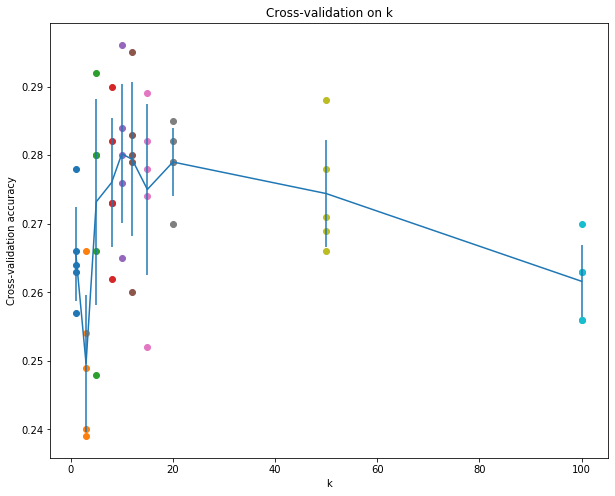

In [16]:
# plot the raw observations
for k in k_choices:
    accuracies = k_to_accuracies[k]
    plt.scatter([k] * len(accuracies), accuracies)

# plot the trend line with error bars that correspond to standard deviation
accuracies_mean = np.array([np.mean(v) for k,v in sorted(k_to_accuracies.items())])
accuracies_std = np.array([np.std(v) for k,v in sorted(k_to_accuracies.items())])
plt.errorbar(k_choices, accuracies_mean, yerr=accuracies_std)
plt.title('Cross-validation on k')
plt.xlabel('k')
plt.ylabel('Cross-validation accuracy')
plt.show()

In [17]:
# Based on the cross-validation results above, choose the best value for k,   
# retrain the classifier using all the training data, and test it on the test
# data. You should be able to get above 28% accuracy on the test data.
best_k = 1

classifier = KNearestNeighbor()
classifier.train(X_train, y_train)
y_test_pred = classifier.predict(X_test, k=best_k)

# Compute and display the accuracy
num_correct = np.sum(y_test_pred == y_test)
accuracy = float(num_correct) / num_test
print('Got %d / %d correct => accuracy: %f' % (num_correct, num_test, accuracy))

[ 420 3684 4224 ... 4375 2744 4601]
[420]
[4]
[2192 4848 2166 ... 4400 4688 1387]
[2192]
[9]
[4469  909 3904 ... 4921 3355 3837]
[4469]
[8]
[ 252 4453 4270 ... 4688 4921 1387]
[252]
[8]
[1881 3949 3797 ... 4271 2744 4601]
[1881]
[4]
[2654  347 1983 ...  790 4601 2744]
[2654]
[4]
[4033  831   22 ... 1342 2744 4601]
[4033]
[3]
[ 910 4055 1838 ... 4645 2744 4601]
[910]
[2]
[4808 1686 1283 ... 4813 4940 1387]
[4808]
[5]
[2096 4320  126 ... 2814 3035 4688]
[2096]
[8]
[ 303  456 1759 ... 1387 4940 3286]
[303]
[2]
[ 139  722 2905 ... 4921 3355 3837]
[139]
[8]
[2745 3540 4124 ... 4271 3205 4601]
[2745]
[5]
[ 825 4279  920 ... 1342 2744 1527]
[825]
[7]
[ 271 4066 2749 ... 4645 2744 4601]
[271]
[2]
[4183 4453 1832 ... 4273 1342 4564]
[4183]
[2]
[4153 1160 2550 ...  977 3737 4564]
[4153]
[5]
[  80 4864 4045 ... 4940 3286  735]
[80]
[3]
[3059 2192 2670 ... 4590 3355 3837]
[3059]
[1]
[1881 4139 4604 ... 4601 4418 1527]
[1881]
[4]
[2693 1440 1038 ...  735 4601  504]
[2693]
[2]
[1522 3382 3842 ... 18

[  10 1530 3560 ... 4645 2744 4601]
[10]
[4]
[3882 3501 1490 ... 3616 4590 3355]
[3882]
[9]
[1618 1211 4322 ... 4400 1387 4940]
[1618]
[5]
[2509 2674 1674 ... 3746 1766 4940]
[2509]
[5]
[  77 1470 1201 ... 4375 4601 2744]
[77]
[0]
[1284   69 1166 ... 4601 2744  504]
[1284]
[4]
[3116 3845   69 ...  790 2744 4601]
[3116]
[4]
[4477 2156 3607 ... 4688 3355 3837]
[4477]
[0]
[2247 1243 3829 ... 2744 4601 3286]
[2247]
[2]
[1122 1613  856 ... 4271 2744 4601]
[1122]
[2]
[2605 2106 3739 ... 4500  735 4601]
[2605]
[6]
[4477 2156 3607 ... 4921 4688 3837]
[4477]
[0]
[1832 4905 4224 ... 1342 4601 4418]
[1832]
[4]
[2507  850 2959 ...  790 2744 4601]
[2507]
[2]
[3376 4208 2867 ... 1766 3746 4940]
[3376]
[3]
[ 914 1367 4033 ... 4601 4375 2744]
[914]
[6]
[ 299 3412 1991 ... 4348 4601 3205]
[299]
[4]
[1530 2666 2211 ... 4645 2744 4601]
[1530]
[2]
[2831 2764 2573 ... 2744 4601  504]
[2831]
[6]
[ 982 4029 4159 ... 4101 1387 4940]
[982]
[4]
[1881 2730  420 ... 4375 2744 4601]
[1881]
[4]
[2003  185 3478 ... 

**Inline Question 3**

Which of the following statements about $k$-Nearest Neighbor ($k$-NN) are true in a classification setting, and for all $k$? Select all that apply.
1. The decision boundary of the k-NN classifier is linear.
2. The training error of a 1-NN will always be lower than that of 5-NN.
3. The test error of a 1-NN will always be lower than that of a 5-NN.
4. The time needed to classify a test example with the k-NN classifier grows with the size of the training set.
5. None of the above.

$\color{blue}{\textit Your Answer:}$


$\color{blue}{\textit Your Explanation:}$

